In [1]:
import gym
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [3]:
# another cell
import matplotlib.pyplot as plt
%matplotlib inline

# Values to test later on

$alpha$: 0.1 - 0.3

$\gamma$: 0.8 - 1.0

In [4]:
max_episodes = 5000
max_steps = 200
test_episodes = 1000
alpha = 0.1
gamma = 0.95
epsilon = 1.0
decay_rate = 0.01

In [5]:
class RandomAgent:

    def __init__(self, max_episodes, max_steps, test_episodes):
        self.env = gym.make("Taxi-v3", render_mode = "rgb_array")
        self.max_episodes = max_episodes
        self.test_episodes= test_episodes
        self.steps = max_steps
        self.reward_arr = np.empty(max_episodes)
        self.counts_solved = np.zeros(max_episodes)
        
    def run(self):
        print("Running...")
        for episode in range(self.max_episodes):
            state = self.env.reset()
            done = False
            eps_reward = 0
            for step in range(self.steps):
                action = self.env.action_space.sample()
                new_state, reward, done, info, _ = self.env.step(action)
                eps_reward += reward
                state = new_state
                if done == True: 
                    self.counts_solved[episode] += 1
                    self.reward_arr[episode] = eps_reward
                    eps_reward = 0
                    break
            self.reward_arr[episode] = eps_reward
            eps_reward = 0
        print("Done!")
        self.plot_rewards()
        self.info_rewards()
        
        
    def plot_rewards(self):
        plt.figure(figsize=(15,8))
        plt.title("Total Reward per episodes for random algorithm")
        plt.xlabel("episode")
        plt.ylabel("reward")
        plt.ylim(-400, 20)
        plt.grid()
        plt.plot(self.reward_arr, label = 'Random Agent', color = "red")
        plt.legend()
        plt.show()  
        
        
    def info_rewards(self):
        print("Number of times passenger was dropped off: {}".format(sum(self.counts_solved)))
        print("Max reward: {}".format(max(self.reward_arr)))
        print("Min reward: {}".format(min(self.reward_arr)))
        print("Avg reward: {}".format(sum(self.reward_arr)/self.max_episodes))
        
    def exportCSV(self,name):
        DF = pd.DataFrame(self.reward_arr)
        DF.to_csv(name + ".csv",index=False)


Running...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Done!


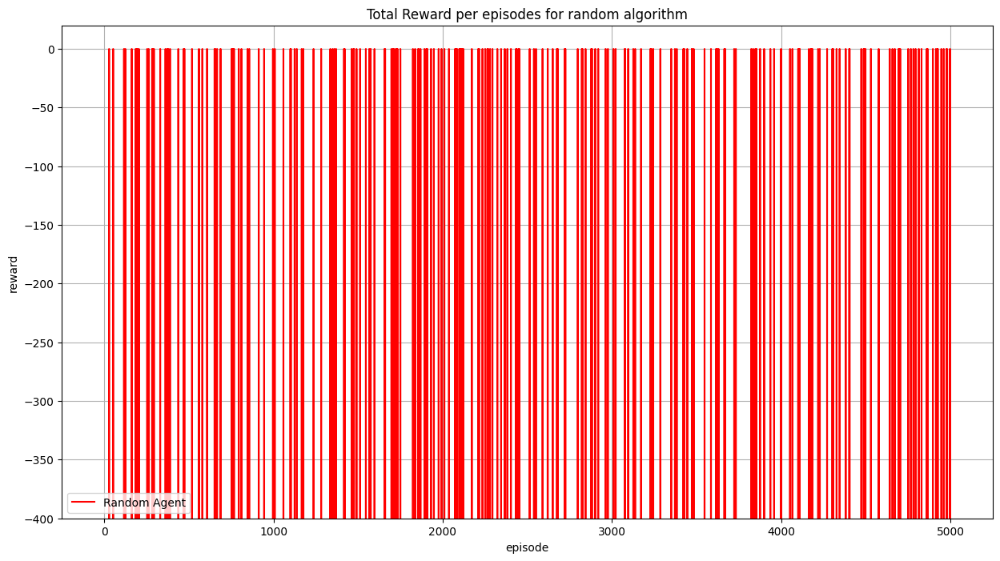

Number of times passenger was dropped off: 237.0
Max reward: 0.0
Min reward: -1073.0
Avg reward: -749.8952


In [6]:
randAgent = RandomAgent(max_episodes, max_steps, test_episodes)
randAgent.run()
randAgent.exportCSV("random_agent")

In [23]:
class SarsaAgent:
    def __init__(self, max_episodes, max_steps, test_episodes, alpha, gamma, epsilon, decay_rate, optimistic):
        self.env = gym.make("Taxi-v3", render_mode = "rgb_array")
        self.max_episodes = max_episodes
        self.steps = max_steps
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.decay_rate = decay_rate
        self.reward_list= np.empty(max_episodes)
        self.counts_solved = np.zeros(max_episodes)
        self.first_solved = 0
        self.optimistic = optimistic
        self.test_arr = np.empty(test_episodes)
        
        if optimistic:
            self.Q = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        else:
            self.Q = np.ones((self.env.observation_space.n,self.env.action_space.n))
        
        
    def chooseAction(self,state):
        action = 0
        if np.random.uniform(0,1) <self.epsilon:
            action = self.env.action_space.sample()
        else:
            action = np.argmax(self.Q[state,:])
        return action
    
    def chooseActionTesting(self,state):
        action = np.argmax(self.Q[state,:])
        return action
    
    def updateQ(self, state, action, state1, action1, reward):
        currentQ = self.Q[state,action]
        self.Q[state,action] = currentQ + float(self.alpha *( reward + 
                                                             (self.gamma *self.Q[state1,action1]) - currentQ))
        
        
    def run(self):
        print("Training...")
        for eps in range(self.max_episodes):
            state = self.env.reset()
            action1 = self.chooseAction(state[0])
            eps_reward = 0
            for step in range(self.steps):
                #take action 
                new_state, reward, done, info, _ = self.env.step(action1)
                
                #get next action
                action2 = self.chooseAction(new_state)
                        
                #Update Q table with next action
                if type(state) == tuple:
                    self.updateQ(state[0],action1, new_state , action2, reward)
                    
                else: 
                    self.updateQ(state,action1,new_state, action2, reward)
                
                #keep track of reward
                eps_reward+=reward
                
                #overwrite state and action value
                state = new_state
                action1 = action2
                
                if done:
                    self.counts_solved[eps] += 1
                    break
            self.epsilon = 0.01 + (1.0 - 0.01)*np.exp(-self.decay_rate*eps) 
            self.reward_list[eps]= eps_reward
#             print(f"ep : {eps} , reward : {eps_reward}")
            eps_reward = 0
        print("Learning done!")
        self.plot_rewards()
        self.info_rewards()
        
        
    def test(self):
        print("Testing...")
        
        for episode in range(test_episodes):
            episode_reward = 0
            state = self.env.reset()
            action1 = self.chooseActionTesting(state[0])
            
            for step in range(self.steps):
                new_state, reward, done, info, _  = self.env.step(action1)
                
                action2 = self.chooseActionTesting(new_state)
                
                episode_reward += reward
                
                state = new_state
                action1 = action2
                if done:
                    break
            self.test_arr[episode] = episode_reward
            episode_reward = 0
        print("Learning done!")
        self.plot_testing()
        
        
    def plot_testing(self):
        plt.figure(figsize=(15,8))
        plt.title("Total Reward per episodes testing for SARSA")
        plt.xlabel("episode")
        plt.ylabel("reward")
        plt.ylim(-400, 20)
        plt.grid()
        if self.optimistic:
            plt.title("Total Reward per episodes when testing for Optimistic SARSA")

            plt.plot(self.test_arr, label = "Optimistic SARSA Agent" , color = "blue")
        else:
            plt.plot(self.test_arr, label = "SARSA Agent" , color = "red")
        plt.legend()
        plt.show()  
                
            
    def plot_rewards(self):
        plt.figure(figsize=(15,8))
        plt.title("Total Reward per episodes for SARSA")
        plt.xlabel("episode")
        plt.ylabel("reward")
        plt.ylim(-400, 20)
        plt.grid()
        if self.optimistic:
            plt.title("Total Reward per episodes for Optimistic SARSA")

            plt.plot(self.reward_list, label = "Optimistic SARSA Agent" , color = "blue")
        else:
            plt.plot(self.reward_list, label = "SARSA Agent" , color = "red")
        plt.legend()
        plt.show()  
        
        
    def info_rewards(self):
        print("Number of times passenger was dropped off: {}".format(sum(self.counts_solved)))
        print("Max reward: {}".format(max(self.reward_list)))
        print("Min reward: {}".format(min(self.reward_list)))
        print("Avg reward: {}".format(sum(self.reward_list)/self.max_episodes))    
    
    def export_csv(self,name):
        df = pd.DataFrame(self.Q)
        df.to_csv(name+".csv",index = False)


   

In [27]:
class Q_Agent:
    def __init__(self, max_episodes, max_steps, test_episodes, alpha, gamma, epsilon, decay_rate, optimistic):
        self.env = gym.make("Taxi-v3", render_mode = "rgb_array")
        self.max_episodes = max_episodes
        self.test_episodes= test_episodes
        self.steps = max_steps
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.reward_arr = np.empty(max_episodes)
        self.decay_rate = decay_rate
        self.counts_solved = np.zeros(max_episodes)
        self.optimistic = optimistic
        self.test_arr = np.empty(test_episodes)
        
        if optimistic:
            self.qtable = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        else:
            self.qtable = np.ones((self.env.observation_space.n,self.env.action_space.n))
                    
                 
    
    def run(self):
        print("Training....")
        for episode in range(self.max_episodes):
            state = self.env.reset()
            done = False
            eps_reward = 0
            
            for step in range(self.steps):
                exp_exp_tradeoff = random.uniform(0,1)
                if exp_exp_tradeoff > self.epsilon:
                    if type(state) == tuple:
                        action = np.argmax(self.qtable[state[0],:])
                    else:
                        action = np.argmax(self.qtable[state,:])
                
                else:
                    action = self.env.action_space.sample()
                
                new_state, reward, done, info, _ = self.env.step(action)
                eps_reward += reward
                if type(state) == tuple:
                    self.qtable[state[0], action] = self.qtable[state[0], action] + self.alpha * (reward + self.gamma * 
                                            np.max(self.qtable[new_state, :]) - self.qtable[state[0], action])
                else:
                    self.qtable[state, action] = self.qtable[state, action] + self.alpha * (reward + self.gamma * 
                                            np.max(self.qtable[new_state, :]) - self.qtable[state, action])
                    
                state = new_state

                if done == True: 
                    self.counts_solved[episode] += 1
                    self.reward_arr[episode] = eps_reward
                    eps_reward = 0
                    break
                self.reward_arr[episode] = eps_reward
            eps_reward = 0
        
        # Reduce epsilon (because we need less and less exploration)
            self.epsilon = 0.01 + (1.0 - 0.01)*np.exp(-self.decay_rate*episode)
            print("epsilon: {}".format(self.epsilon))
            
        print("Learning done!")
        self.plot_rewards()
        self.info_rewards()
        
    
    def test(self):
        for episode in range(self.test_episodes):
            state = self.env.reset()
            done = False
            eps_reward = 0
            
            for step in range(max_steps):
                if type(state) == tuple:
                    action = np.argmax(self.qtable[state[0],:])
                else:
                    action = np.argmax(self.qtable[state,:])
                
                new_state, reward, done, info, _ = self.env.step(action)
                eps_reward += reward
                    
                state = new_state
                
                if done == True: 
                    break
                    
            self.test_arr[episode] = eps_reward
        self.plot_testing()
        
        
    def plot_testing(self):
        plt.figure(figsize=(15,8))
        plt.title(f"Total Reward per episodes testing for Q learning")
        plt.xlabel("episode")
        plt.ylabel("reward")
        plt.ylim(-400, 20)
        plt.grid()
        if self.optimistic:
            plt.plot(self.test_arr, label = "Optimistic Q-learning Agent" , color = "green")
            plt.title(f"Total Reward per episodes testing for Optimistic Q learning")

        else:
            plt.plot(self.test_arr, label = "Q-learning Agent" , color = "purple")
        plt.legend()
        plt.show()
            
        
    def plot_rewards(self):
        plt.figure(figsize=(15,8))
        plt.title(f"Total Reward per episodes for Q learning")
        plt.xlabel("episode")
        plt.ylabel("reward")
        plt.ylim(-400, 20)
        plt.grid()
        if self.optimistic:
            plt.plot(self.reward_arr, label = "Optimistic Q-learning Agent" , color = "green")
            plt.title(f"Total Reward per episodes for Optimistic Q learning")

        else:
            plt.plot(self.reward_arr, label = "Q-learning Agent" , color = "purple")
        plt.legend()
        plt.show()     
        
    def info_rewards(self):
        print("Number of times passenger was dropped off: {}".format(sum(self.counts_solved)))
        print("Max reward: {}".format(max(self.reward_arr)))
        print("Min reward: {}".format(min(self.reward_arr)))
        print("Avg reward: {}".format(sum(self.reward_arr)/self.max_episodes))
    def export_csv(self,name):
        DF = pd.DataFrame(self.reward_arr)
        DF.to_csv(name + ".csv")

    

### varying values of alpha and gamma for optimistic Sarsa agent

alpha = 0.1
...... running with alpha = 0.1 and gamma = 1 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


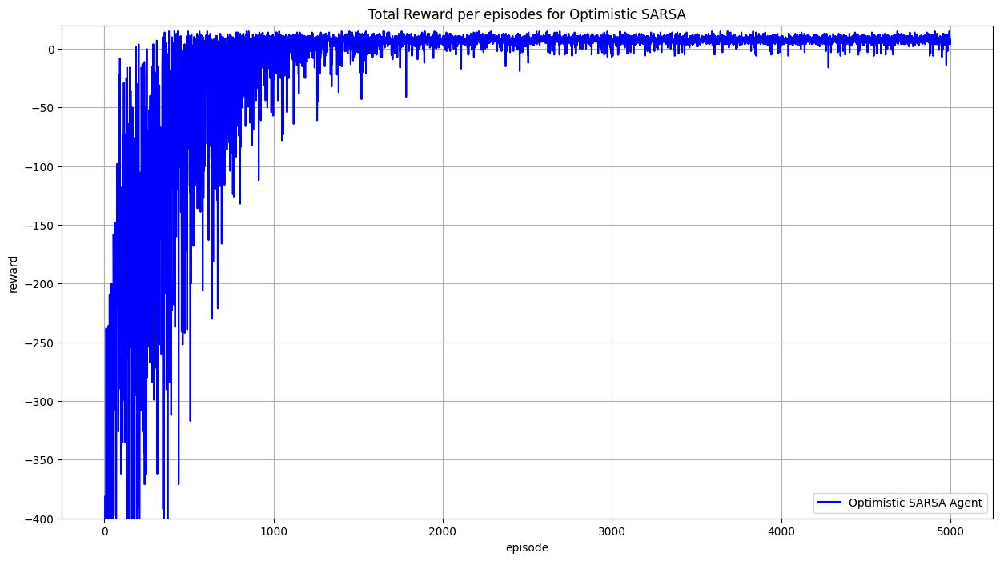

Number of times passenger was dropped off: 4829.0
Max reward: 15.0
Min reward: -893.0
Avg reward: -16.0206
Testing...
Learning done!


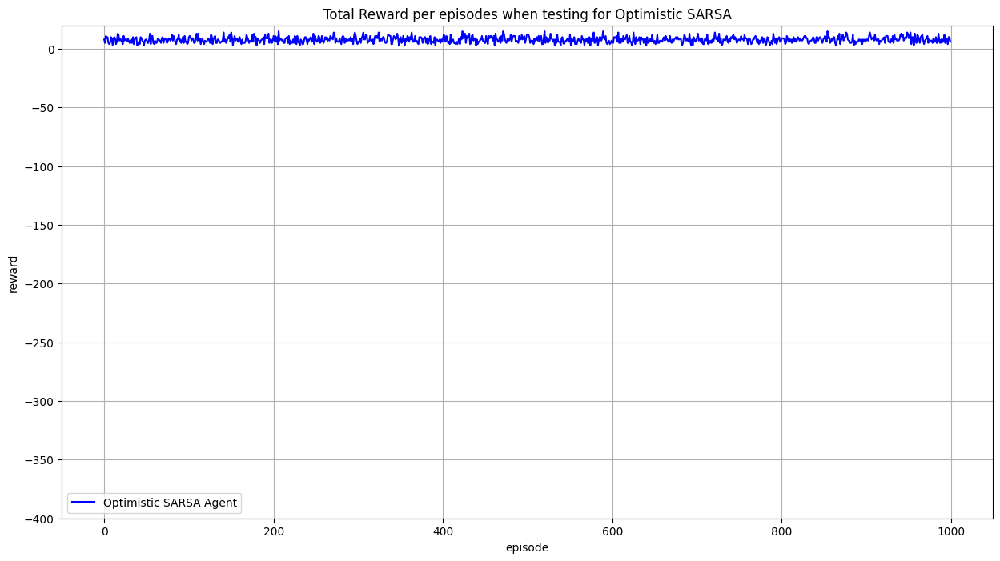

...... running with alpha = 0.1 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


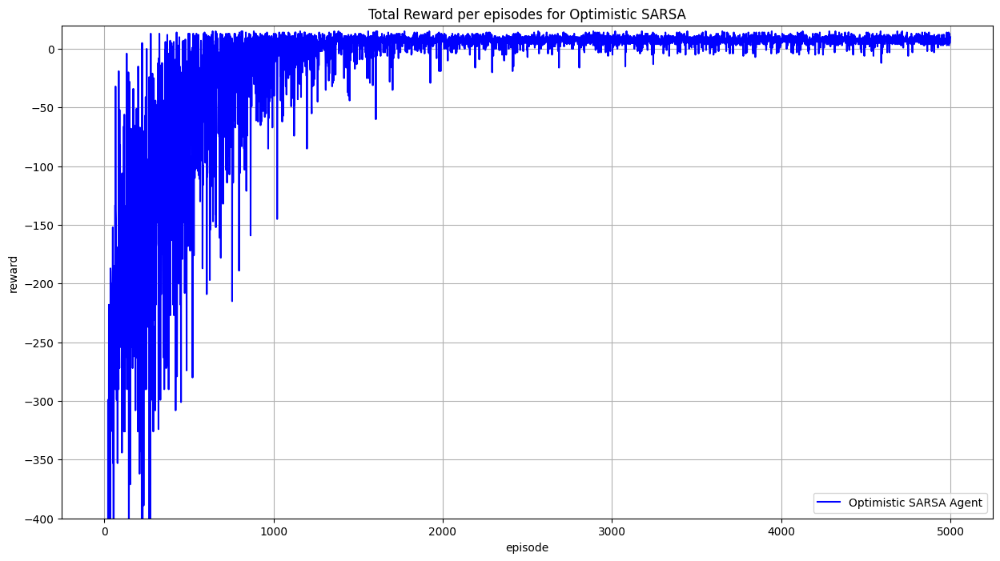

Number of times passenger was dropped off: 4823.0
Max reward: 15.0
Min reward: -830.0
Avg reward: -16.3752
Testing...
Learning done!


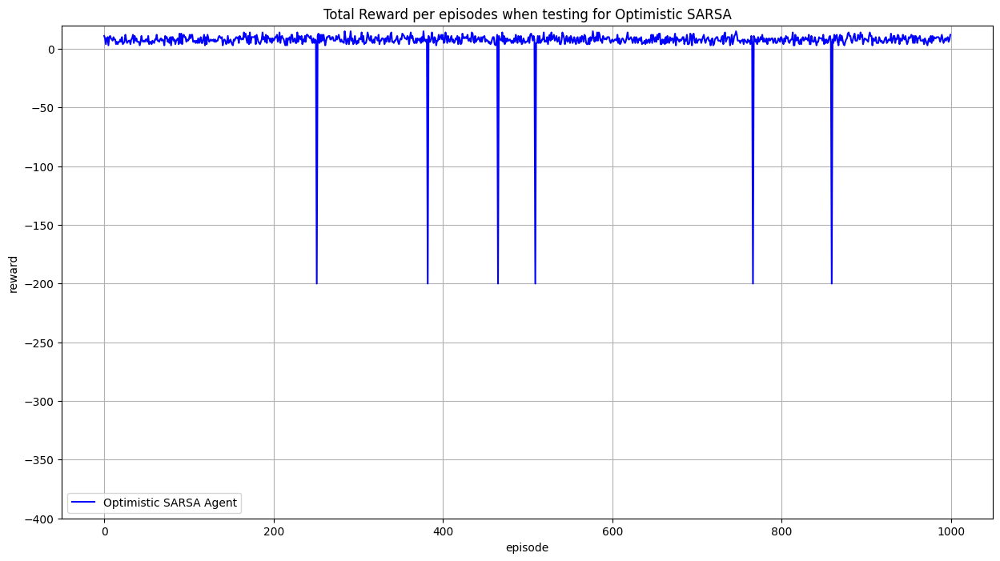

...... running with alpha = 0.1 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


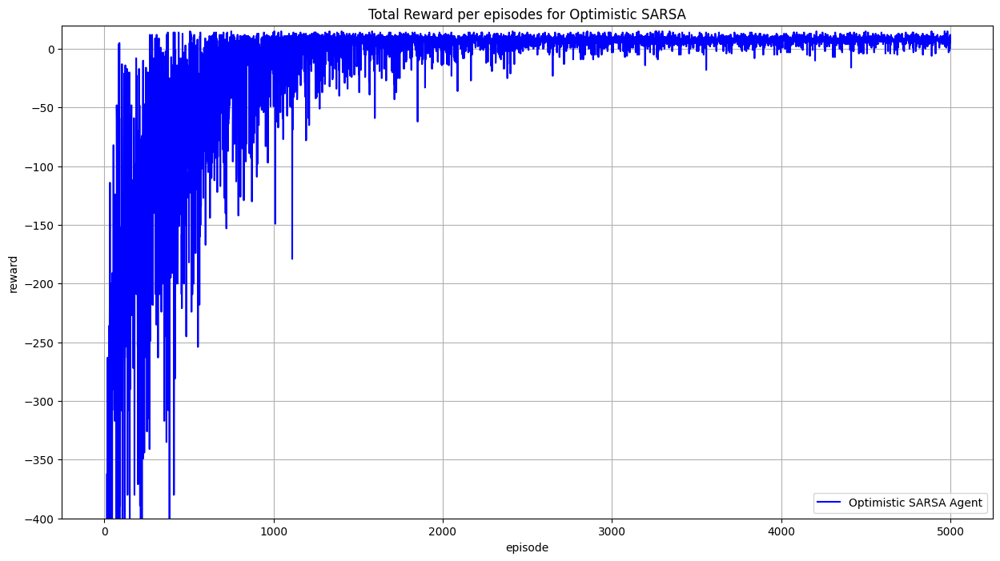

Number of times passenger was dropped off: 4819.0
Max reward: 15.0
Min reward: -803.0
Avg reward: -16.9316
Testing...
Learning done!


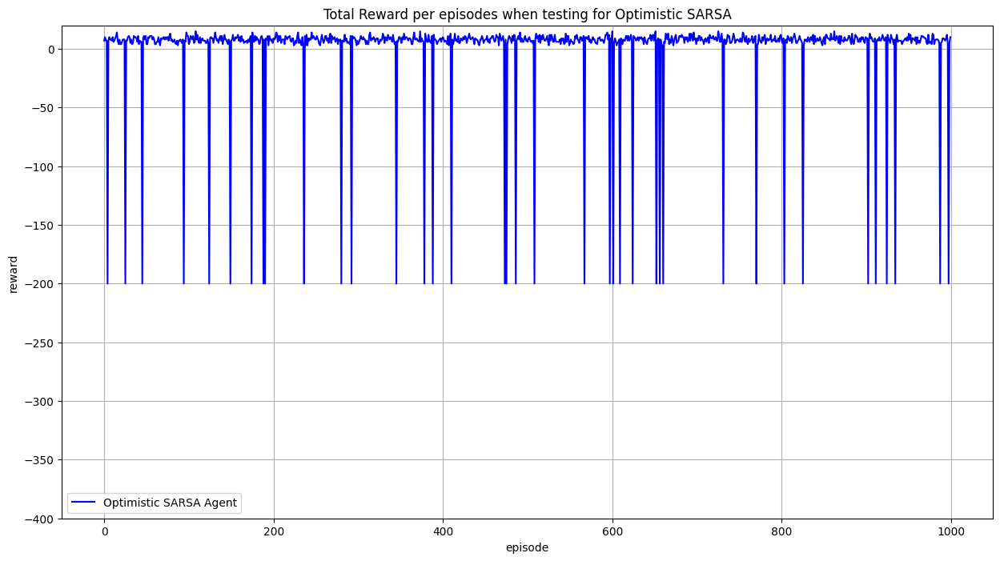

...... running with alpha = 0.1 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


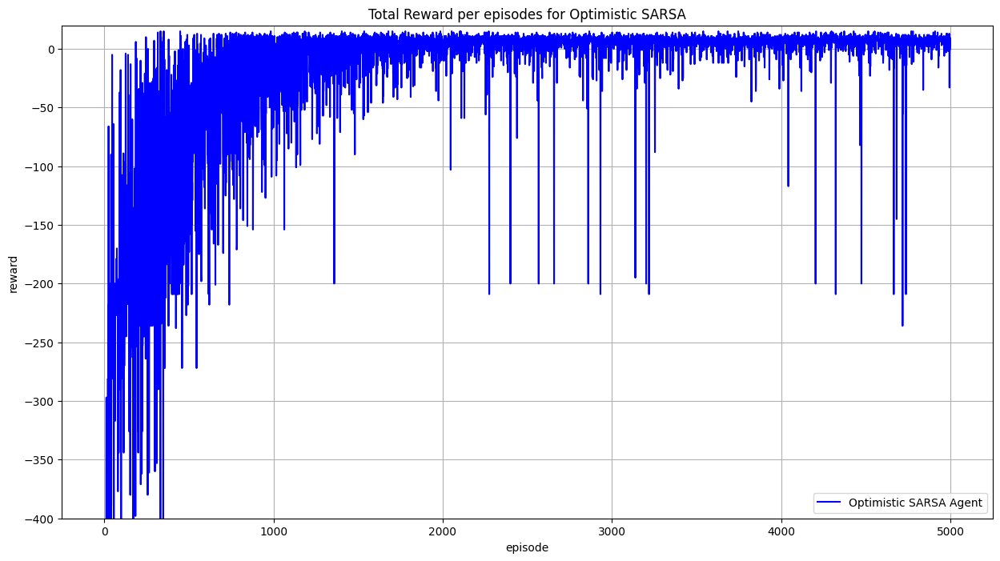

Number of times passenger was dropped off: 4771.0
Max reward: 15.0
Min reward: -821.0
Avg reward: -20.7656
Testing...
Learning done!


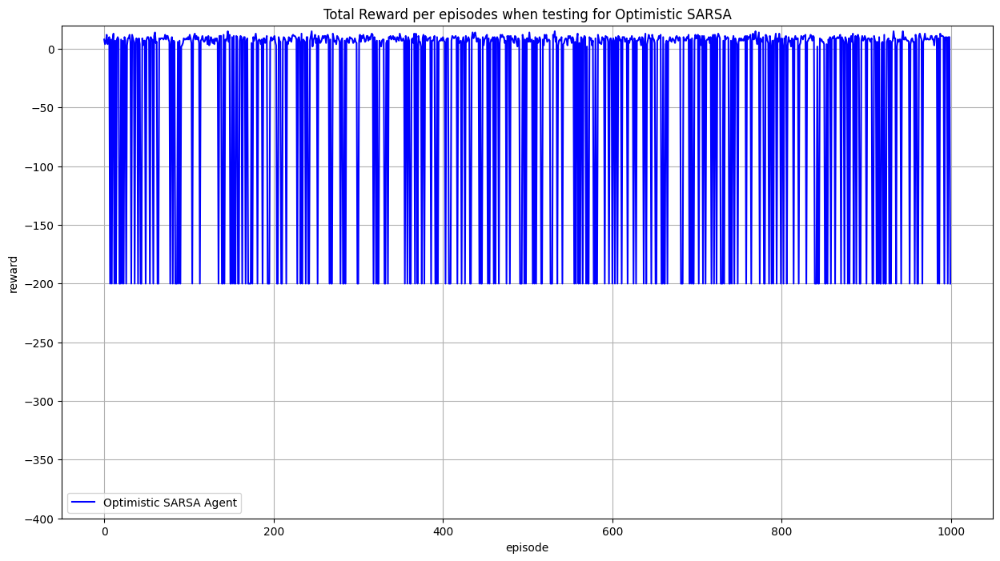

alpha = 0.2
...... running with alpha = 0.2 and gamma = 1 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


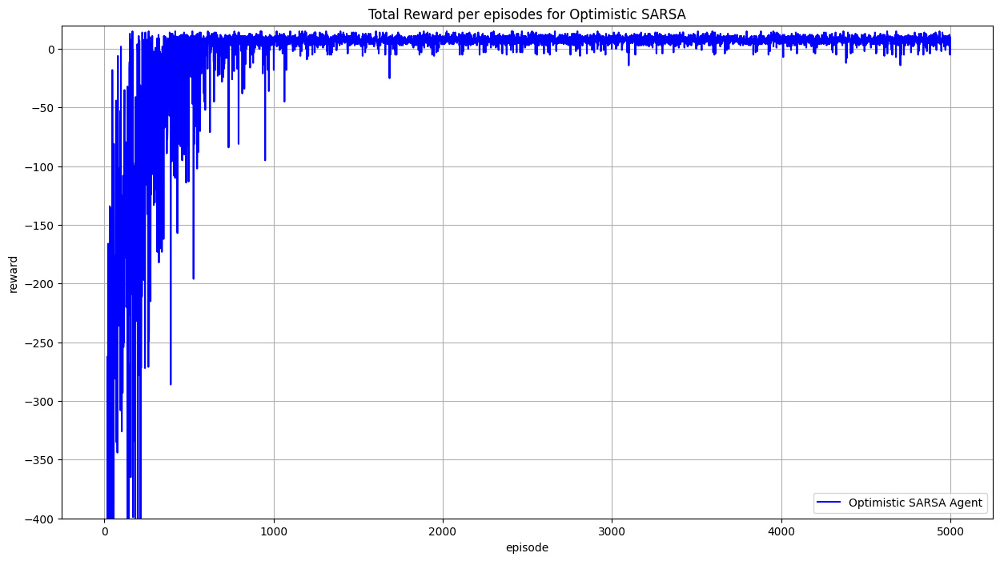

Number of times passenger was dropped off: 4904.0
Max reward: 15.0
Min reward: -848.0
Avg reward: -6.9838
Testing...
Learning done!


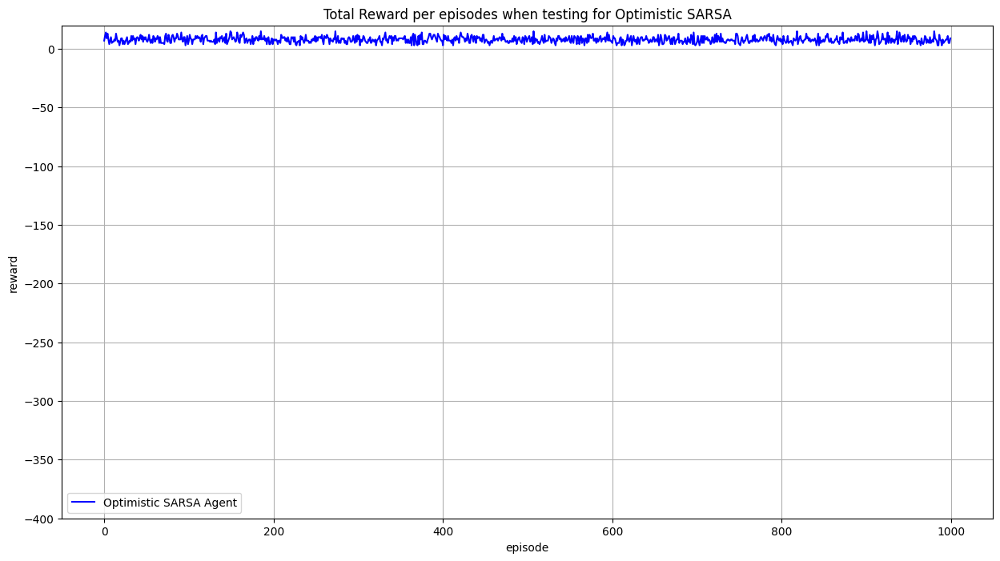

...... running with alpha = 0.2 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


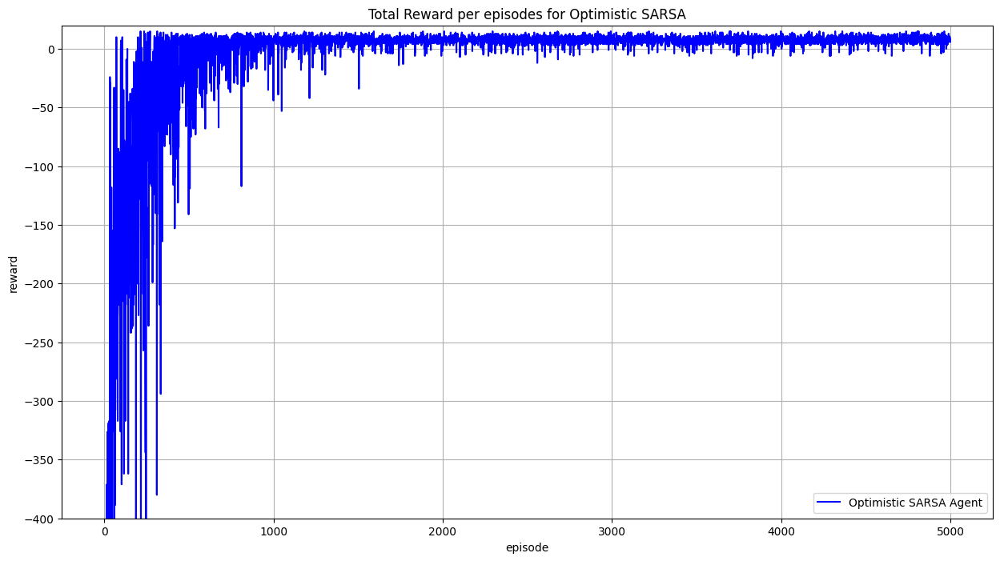

Number of times passenger was dropped off: 4893.0
Max reward: 15.0
Min reward: -875.0
Avg reward: -6.7354
Testing...
Learning done!


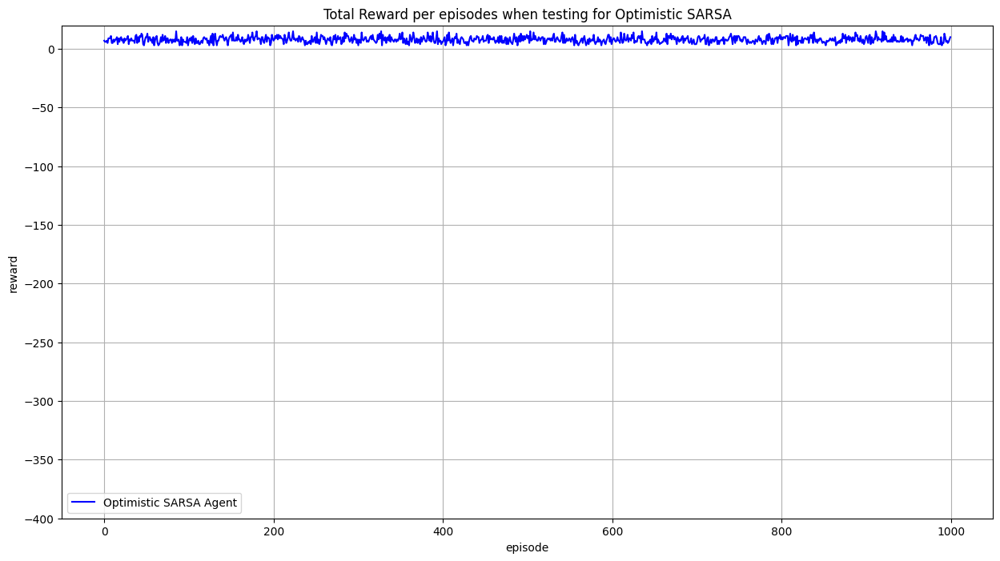

...... running with alpha = 0.2 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


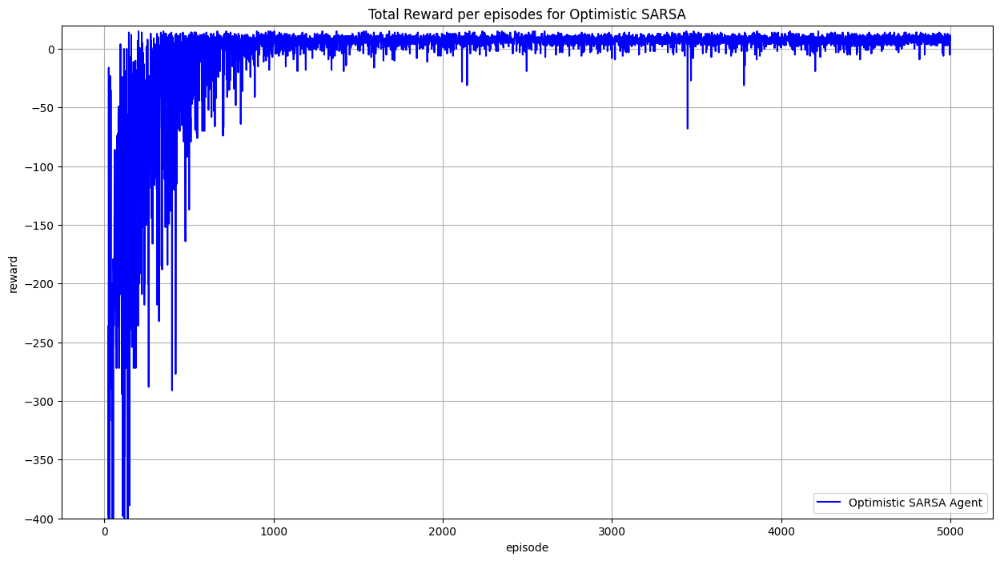

Number of times passenger was dropped off: 4895.0
Max reward: 15.0
Min reward: -1001.0
Avg reward: -7.0848
Testing...
Learning done!


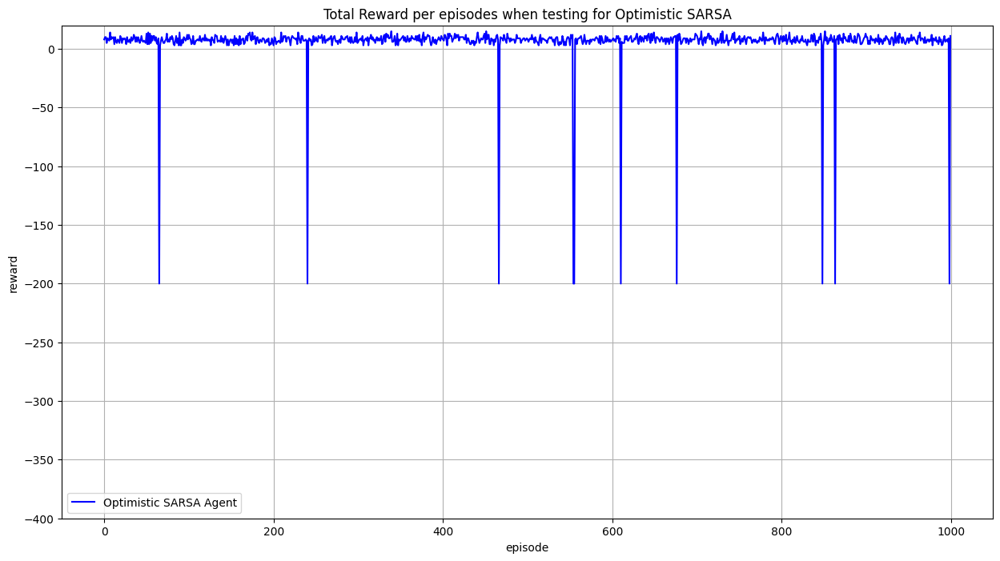

...... running with alpha = 0.2 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


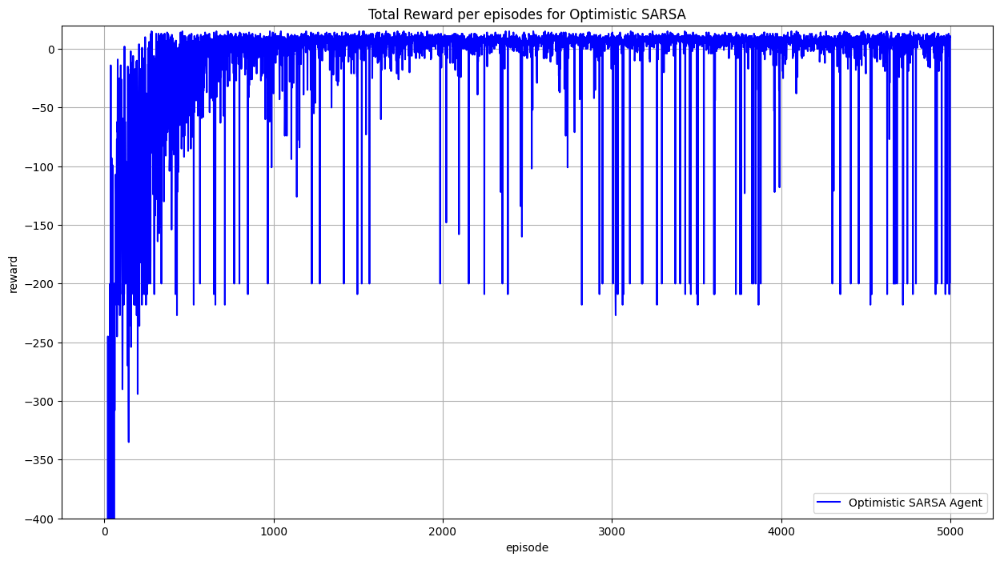

Number of times passenger was dropped off: 4806.0
Max reward: 15.0
Min reward: -839.0
Avg reward: -12.1668
Testing...
Learning done!


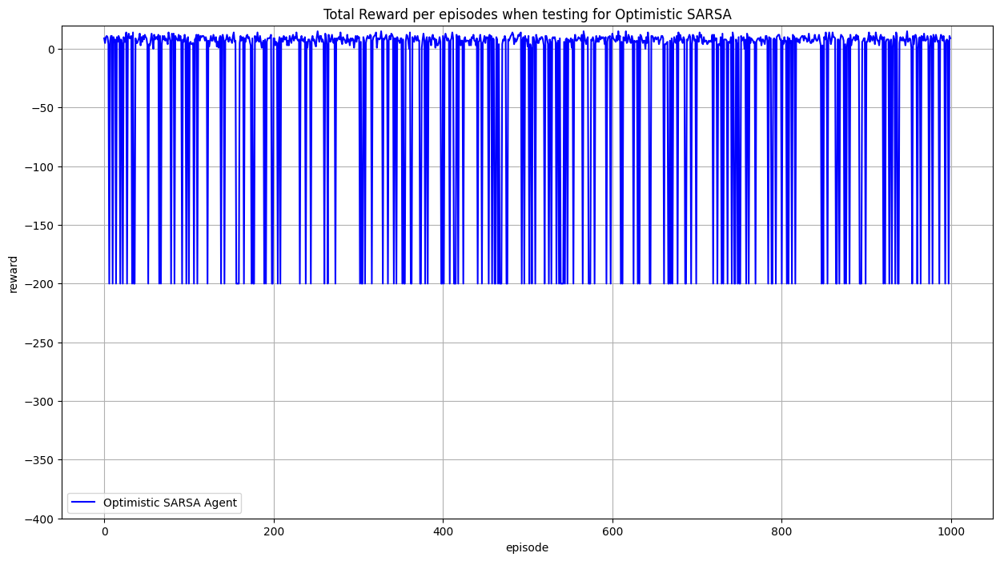

alpha = 0.3
...... running with alpha = 0.3 and gamma = 1 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


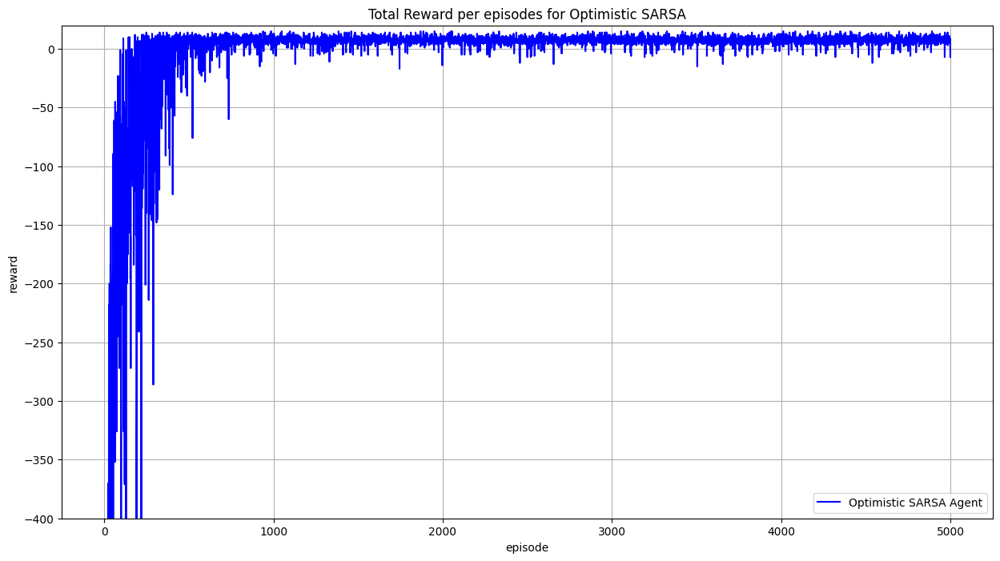

Number of times passenger was dropped off: 4926.0
Max reward: 15.0
Min reward: -830.0
Avg reward: -3.893
Testing...
Learning done!


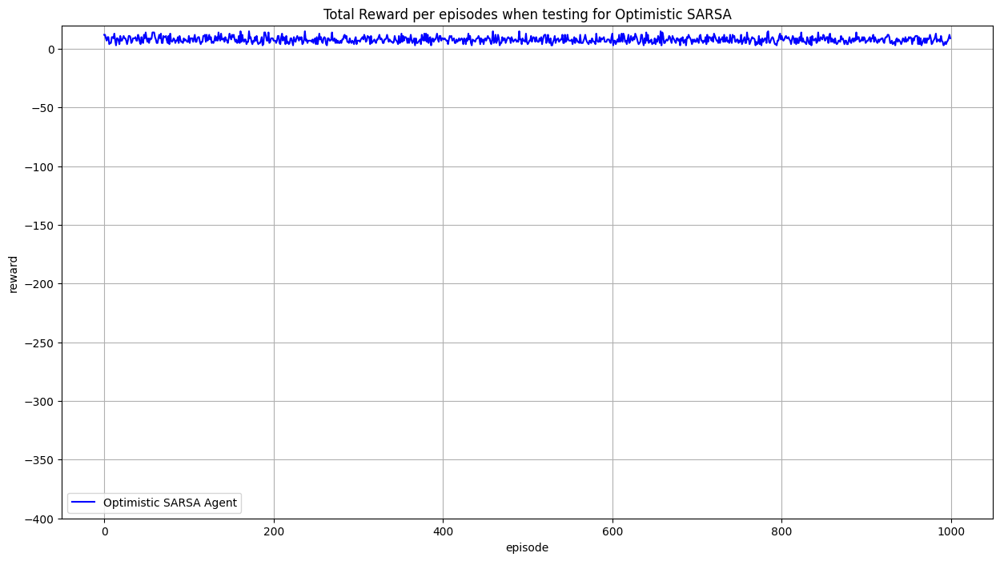

...... running with alpha = 0.3 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


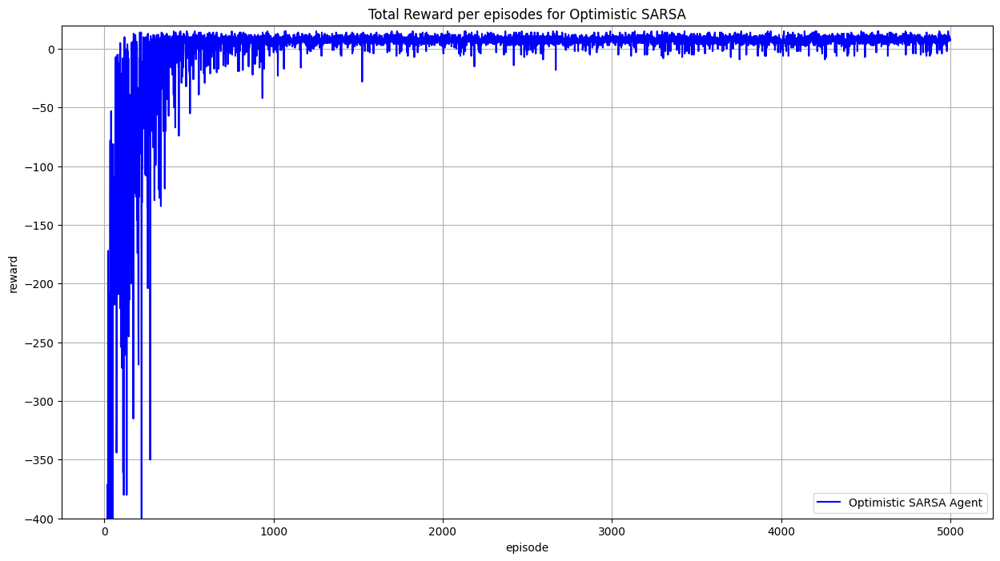

Number of times passenger was dropped off: 4926.0
Max reward: 15.0
Min reward: -875.0
Avg reward: -3.34
Testing...
Learning done!


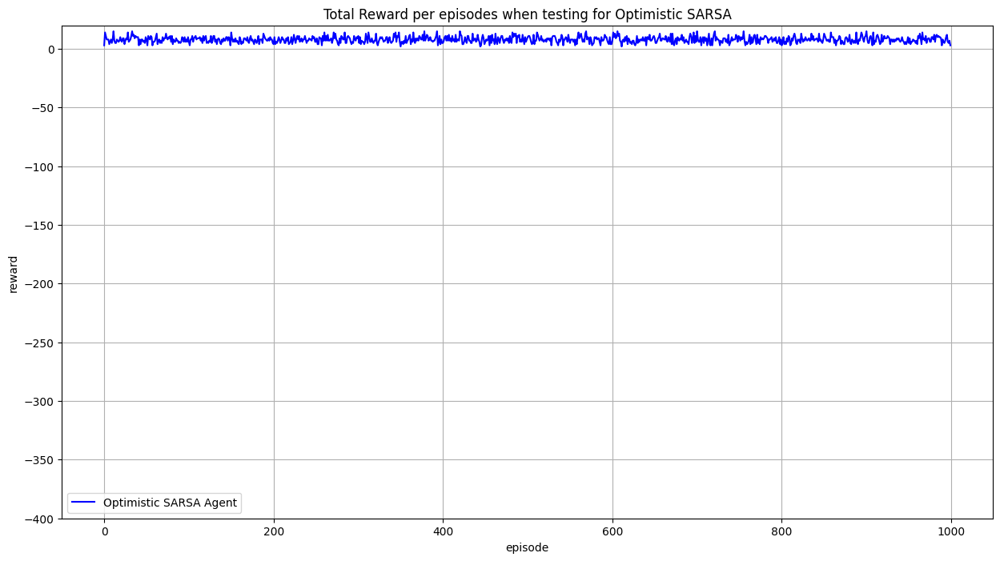

...... running with alpha = 0.3 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


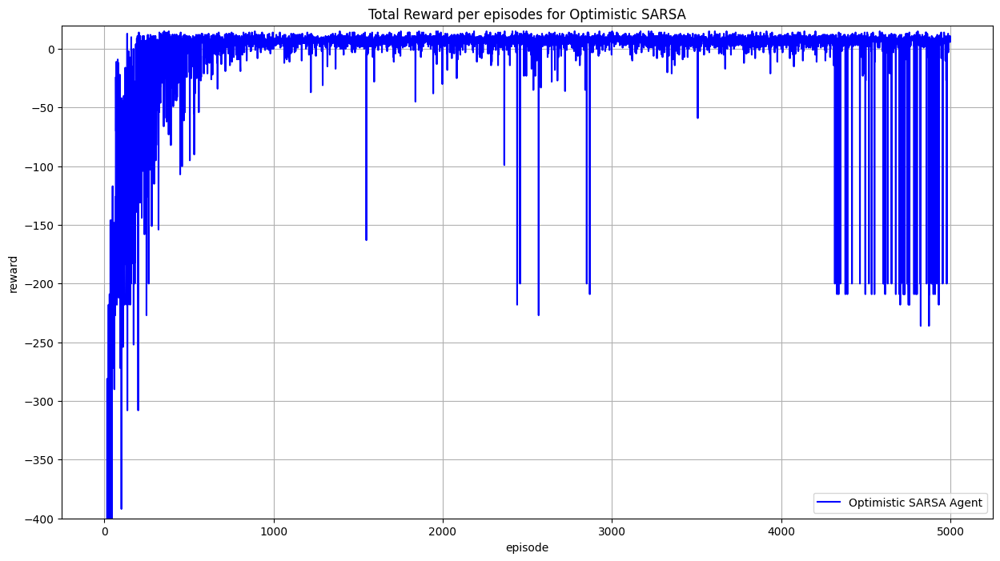

Number of times passenger was dropped off: 4863.0
Max reward: 15.0
Min reward: -812.0
Avg reward: -6.5058
Testing...
Learning done!


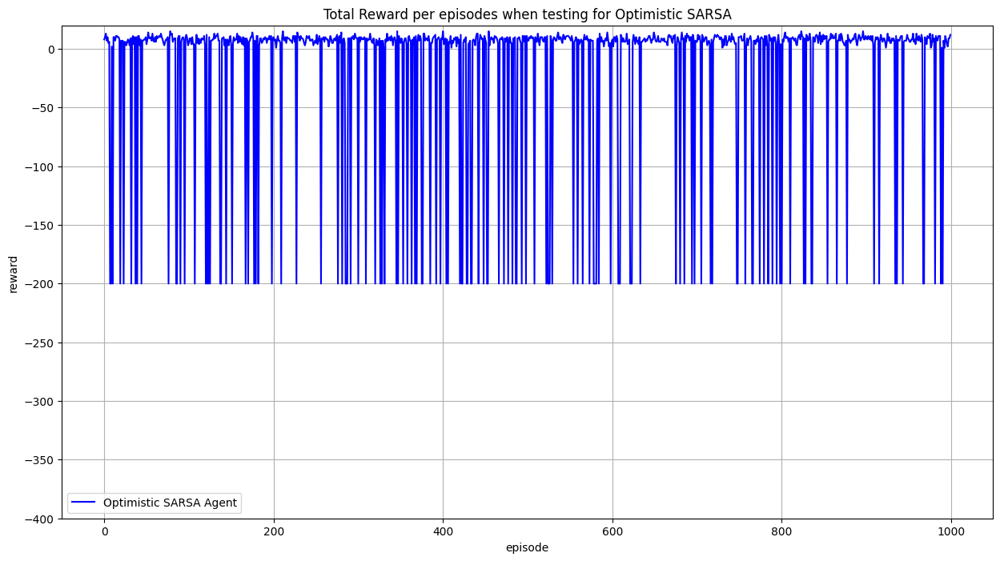

...... running with alpha = 0.3 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


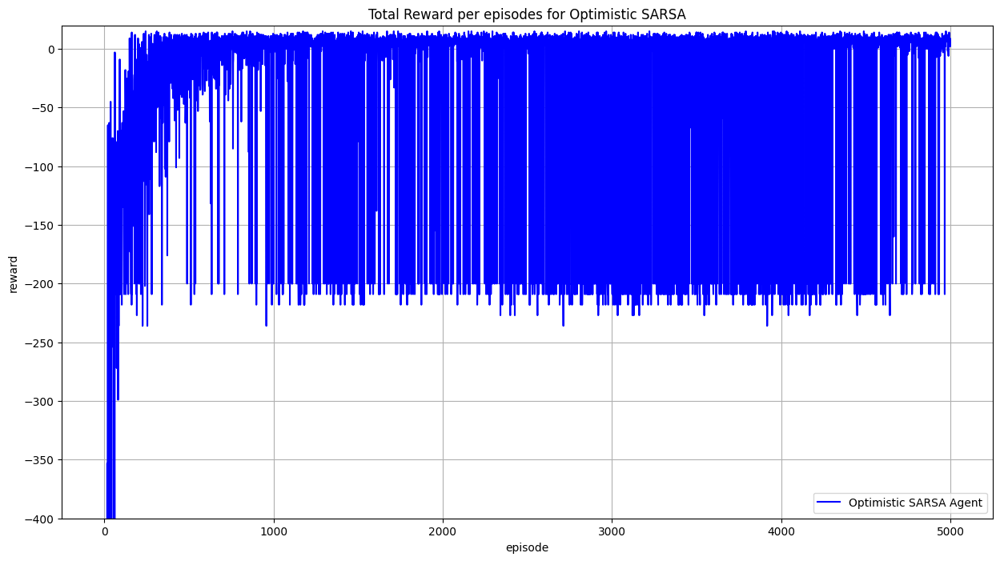

Number of times passenger was dropped off: 3954.0
Max reward: 15.0
Min reward: -839.0
Avg reward: -46.3926
Testing...
Learning done!


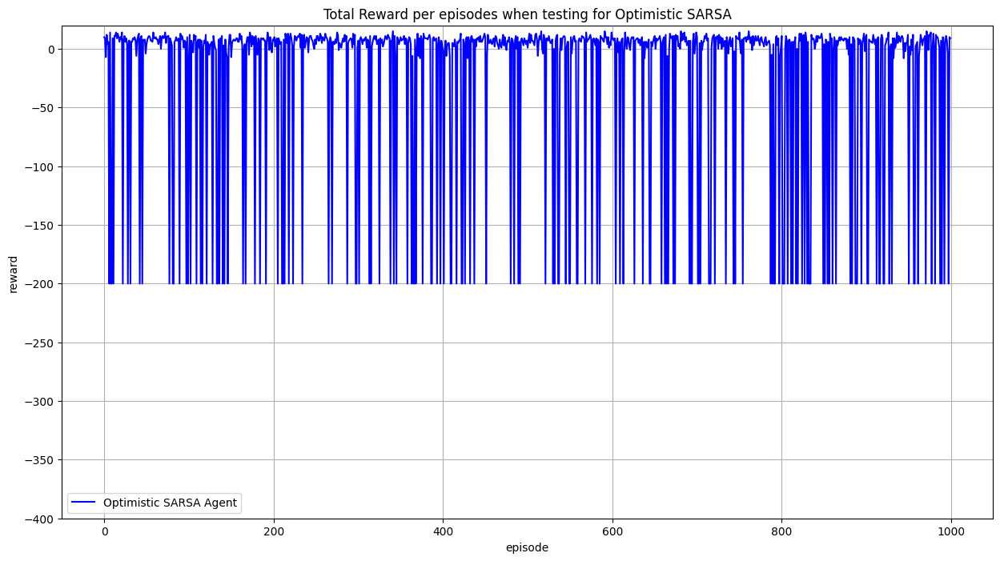

alpha = 0.4
...... running with alpha = 0.4 and gamma = 1 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


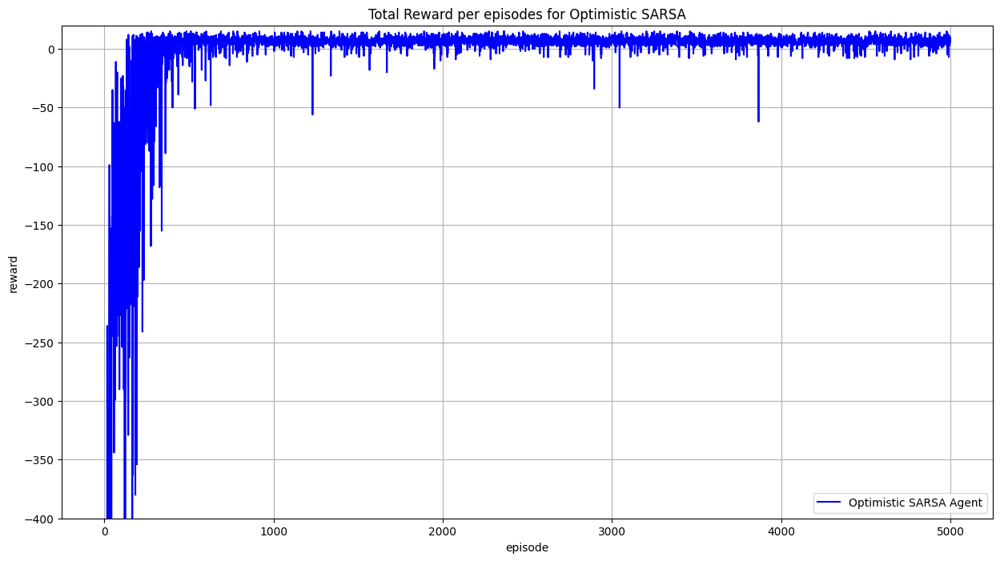

Number of times passenger was dropped off: 4927.0
Max reward: 15.0
Min reward: -821.0
Avg reward: -3.742
Testing...
Learning done!


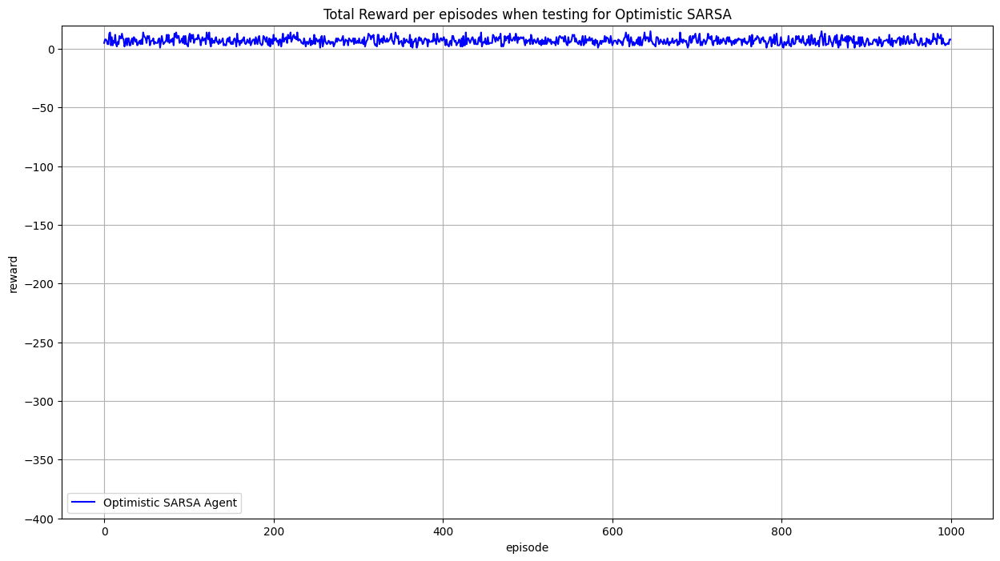

...... running with alpha = 0.4 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


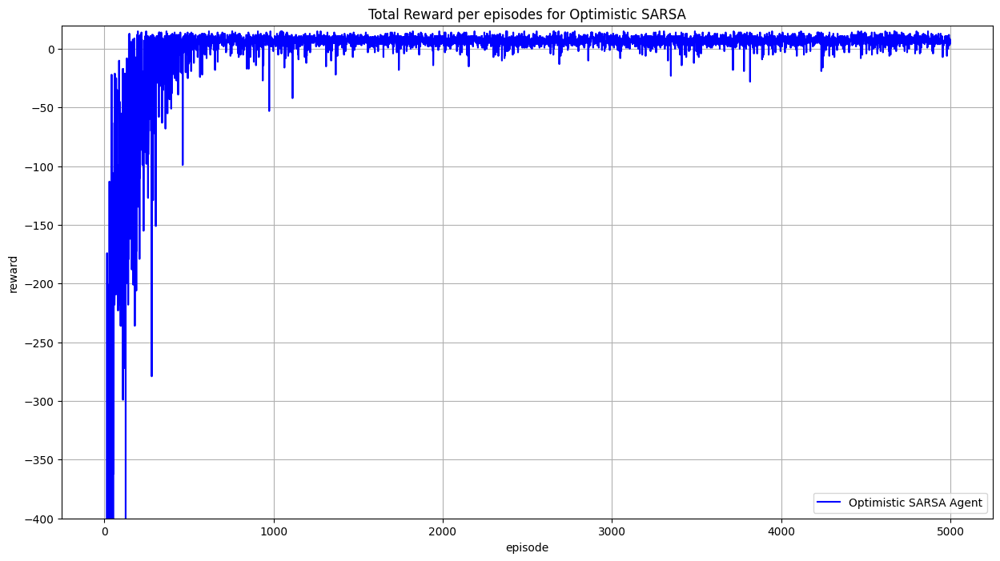

Number of times passenger was dropped off: 4916.0
Max reward: 15.0
Min reward: -839.0
Avg reward: -3.2236
Testing...
Learning done!


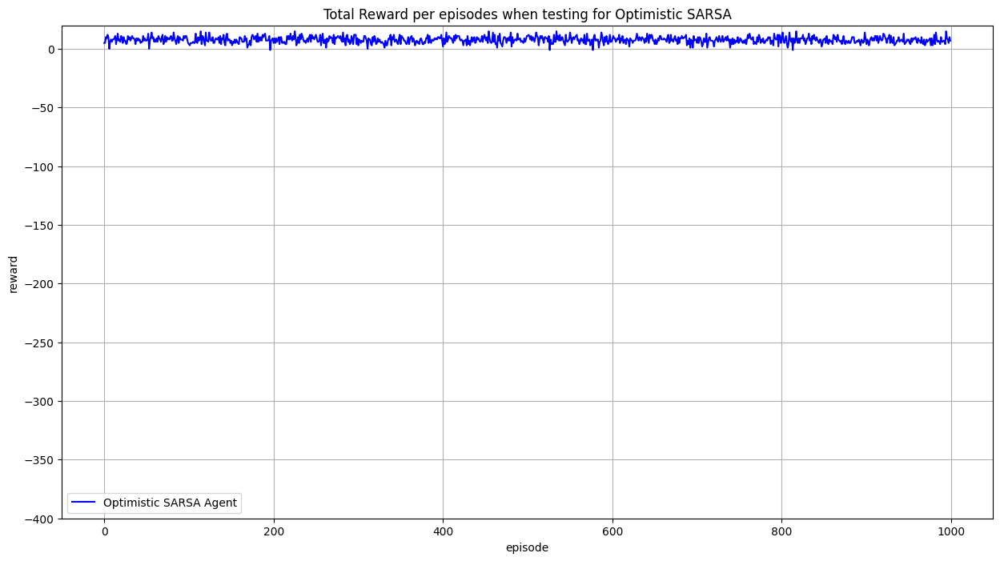

...... running with alpha = 0.4 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


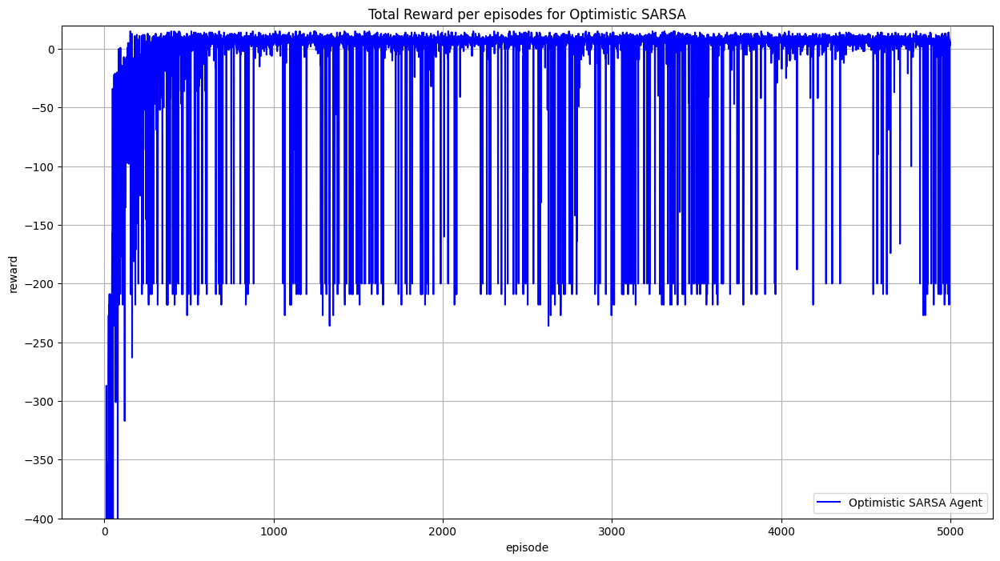

Number of times passenger was dropped off: 4643.0
Max reward: 15.0
Min reward: -848.0
Avg reward: -14.7062
Testing...
Learning done!


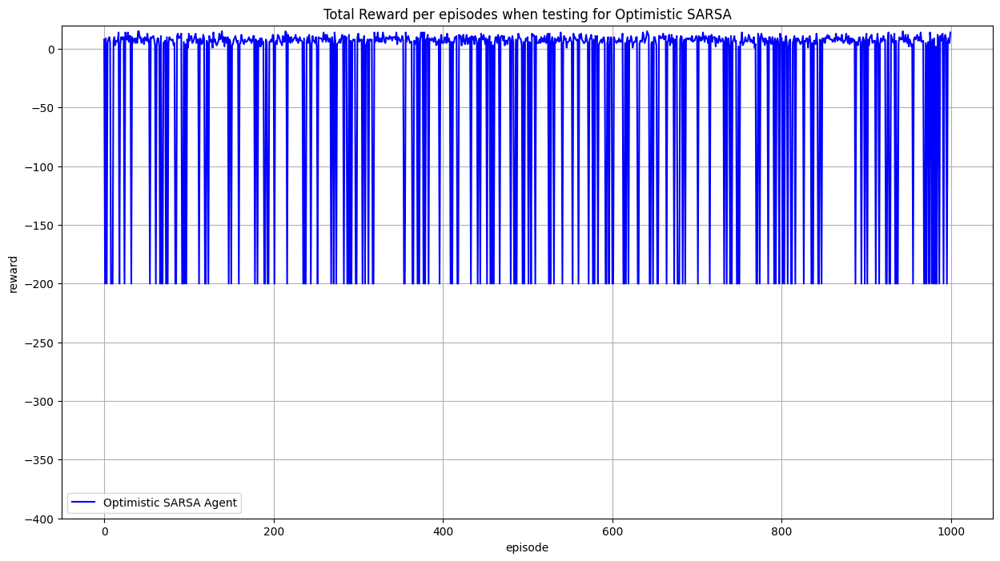

...... running with alpha = 0.4 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


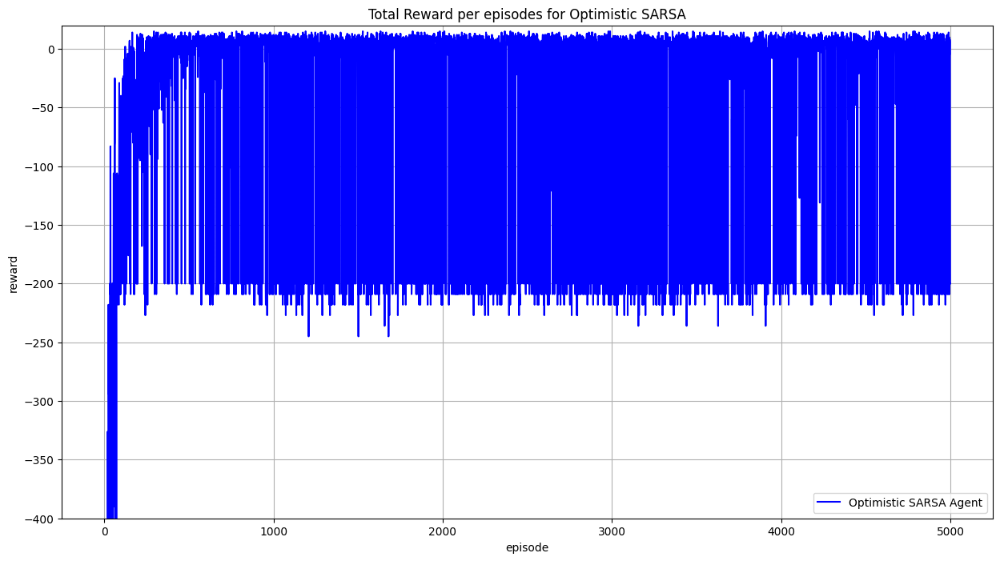

Number of times passenger was dropped off: 3564.0
Max reward: 15.0
Min reward: -866.0
Avg reward: -61.7746
Testing...
Learning done!


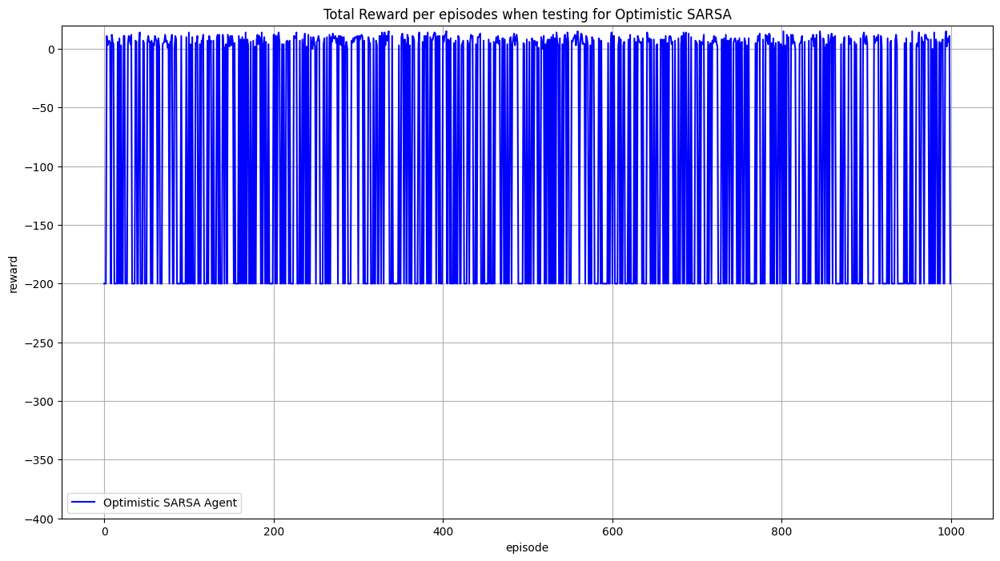

In [26]:
#trying optimistic Sarsa_agent

OIV_SARSA_rewards = pd.DataFrame()
performance = {"alpha":[],"gamma":[],"avg_reward":[]}

for i in [0.1,0.2,0.3,0.4]:
    print(f"alpha = {i}")
    for j in [1,0.9,0.8,0.7]:
        print(f"...... running with alpha = {i} and gamma = {j} ......")
        alpha = i
        gamma = j
        sarsa_agent = SarsaAgent(max_episodes, 
                max_steps, 
                test_episodes, 
                alpha = i, 
                gamma = j, 
                epsilon = 1, 
                decay_rate = 0.01,
                optimistic = True
                )

        sarsa_agent.run()
        sarsa_agent.test()
        
        name = "a"+str(i)+"_g"+str(j)
        OIV_SARSA_rewards[name] = pd.Series(sarsa_agent.reward_list)
        sarsa_agent.export_csv(f"sarsa_a{i}_g{j}")
        performance["alpha"].append(i)
        performance["gamma"].append(j)
        performance["avg_reward"].append((sum(sarsa_agent.reward_list)/sarsa_agent.max_episodes))
        
        
OIV_SARSA_rewards.to_csv("optimistic_sarsa.csv")

# Testing Q Agent for multiple epsilons, alpha and gamma

epsilon = 1
Training....
epsilon: 1.0
epsilon: 0.9901493354116764
epsilon: 0.9803966865736877
epsilon: 0.970741078213023
epsilon: 0.9611815447608
epsilon: 0.9517171302557069
epsilon: 0.9423468882484062
epsilon: 0.9330698817068888
epsilon: 0.9238851829227694
epsilon: 0.9147918734185159
epsilon: 0.9057890438555999
epsilon: 0.896875793943563
epsilon: 0.888051232349986
epsilon: 0.8793144766113556
epsilon: 0.8706646530448178
epsilon: 0.8621008966608072
epsilon: 0.8536223510765493
epsilon: 0.8452281684304199
epsilon: 0.8369175092971592
epsilon: 0.8286895426039287
epsilon: 0.820543445547202
epsilon: 0.8124784035104852
epsilon: 0.8044936099828537
epsilon: 0.7965882664783007
epsilon: 0.7887615824558879
epsilon: 0.7810127752406908
epsilon: 0.7733410699455306
epsilon: 0.7657456993934846
epsilon: 0.7582259040411682
epsilon: 0.7507809319027796
epsilon: 0.7434100384749007
epsilon: 0.7361124866620463
epsilon: 0.7288875467029541
epsilon: 0.7217344960976069
epsilon: 0.7146526195349836
epsilon: 0.707641

/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


epsilon: 0.2666478580394326
epsilon: 0.26409416918402034
epsilon: 0.26156588995727226
epsilon: 0.2590627675291589
epsilon: 0.2565845515853515
epsilon: 0.2541309943021904
epsilon: 0.25170185032190273
epsilon: 0.24929687672806608
epsilon: 0.246915833021317
epsilon: 0.24455848109530054
epsilon: 0.2422245852128597
epsilon: 0.23991391198246126
epsilon: 0.2376262303348566
epsilon: 0.2353613114999746
epsilon: 0.23311892898404435
epsilon: 0.23089885854694553
epsilon: 0.22870087817978443
epsilon: 0.22652476808269262
epsilon: 0.22437031064284702
epsilon: 0.22223729041270818
epsilon: 0.22012549408847562
epsilon: 0.21803471048875708
epsilon: 0.21596473053345028
epsilon: 0.21391534722283462
epsilon: 0.2118863556168713
epsilon: 0.20987755281470882
epsilon: 0.20788873793439305
epsilon: 0.2059197120927785
epsilon: 0.20397027838564025
epsilon: 0.20204024186798297
epsilon: 0.20012940953454655
epsilon: 0.1982375903005053
epsilon: 0.19636459498235934
epsilon: 0.19451023627901587
epsilon: 0.192674328753059

epsilon: 0.010005183394871029
epsilon: 0.010005131819230318
epsilon: 0.010005080756775806
epsilon: 0.010005030202401208
epsilon: 0.01000498015105104
epsilon: 0.010004930597720129
epsilon: 0.010004881537453098
epsilon: 0.01000483296534388
epsilon: 0.010004784876535224
epsilon: 0.010004737266218209
epsilon: 0.010004690129631762
epsilon: 0.010004643462062188
epsilon: 0.01000459725884269
epsilon: 0.010004551515352907
epsilon: 0.010004506227018452
epsilon: 0.010004461389310455
epsilon: 0.010004416997745106
epsilon: 0.010004373047883213
epsilon: 0.010004329535329752
epsilon: 0.010004286455733433
epsilon: 0.010004243804786258
epsilon: 0.010004201578223099
epsilon: 0.010004159771821263
epsilon: 0.010004118381400076
epsilon: 0.010004077402820461
epsilon: 0.010004036831984526
epsilon: 0.010003996664835153
epsilon: 0.010003956897355594
epsilon: 0.010003917525569068
epsilon: 0.010003878545538364
epsilon: 0.010003839953365446
epsilon: 0.010003801745191065
epsilon: 0.01000376391719437
epsilon: 0.010

epsilon: 0.010000000008943891
epsilon: 0.010000000008854898
epsilon: 0.010000000008766791
epsilon: 0.010000000008679559
epsilon: 0.010000000008593196
epsilon: 0.010000000008507693
epsilon: 0.01000000000842304
epsilon: 0.010000000008339229
epsilon: 0.010000000008256252
epsilon: 0.010000000008174102
epsilon: 0.010000000008092768
epsilon: 0.010000000008012244
epsilon: 0.010000000007932521
epsilon: 0.010000000007853591
epsilon: 0.010000000007775445
epsilon: 0.010000000007698078
epsilon: 0.010000000007621482
epsilon: 0.010000000007545647
epsilon: 0.010000000007470566
epsilon: 0.010000000007396233
epsilon: 0.01000000000732264
epsilon: 0.010000000007249777
epsilon: 0.01000000000717764
epsilon: 0.010000000007106222
epsilon: 0.010000000007035515
epsilon: 0.01000000000696551
epsilon: 0.010000000006896203
epsilon: 0.010000000006827584
epsilon: 0.010000000006759649
epsilon: 0.010000000006692388
epsilon: 0.010000000006625797
epsilon: 0.010000000006559871
epsilon: 0.010000000006494598
epsilon: 0.010

epsilon: 0.010000000000003282
epsilon: 0.010000000000003251
epsilon: 0.010000000000003218
epsilon: 0.010000000000003187
epsilon: 0.010000000000003154
epsilon: 0.010000000000003123
epsilon: 0.010000000000003091
epsilon: 0.010000000000003062
epsilon: 0.01000000000000303
epsilon: 0.010000000000003001
epsilon: 0.01000000000000297
epsilon: 0.01000000000000294
epsilon: 0.010000000000002911
epsilon: 0.010000000000002883
epsilon: 0.010000000000002854
epsilon: 0.010000000000002826
epsilon: 0.010000000000002798
epsilon: 0.01000000000000277
epsilon: 0.010000000000002743
epsilon: 0.010000000000002715
epsilon: 0.010000000000002687
epsilon: 0.010000000000002661
epsilon: 0.010000000000002635
epsilon: 0.01000000000000261
epsilon: 0.010000000000002583
epsilon: 0.010000000000002557
epsilon: 0.010000000000002531
epsilon: 0.010000000000002507
epsilon: 0.01000000000000248
epsilon: 0.010000000000002457
epsilon: 0.010000000000002432
epsilon: 0.010000000000002408
epsilon: 0.010000000000002384
epsilon: 0.01000

epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilon: 0.01
epsilo

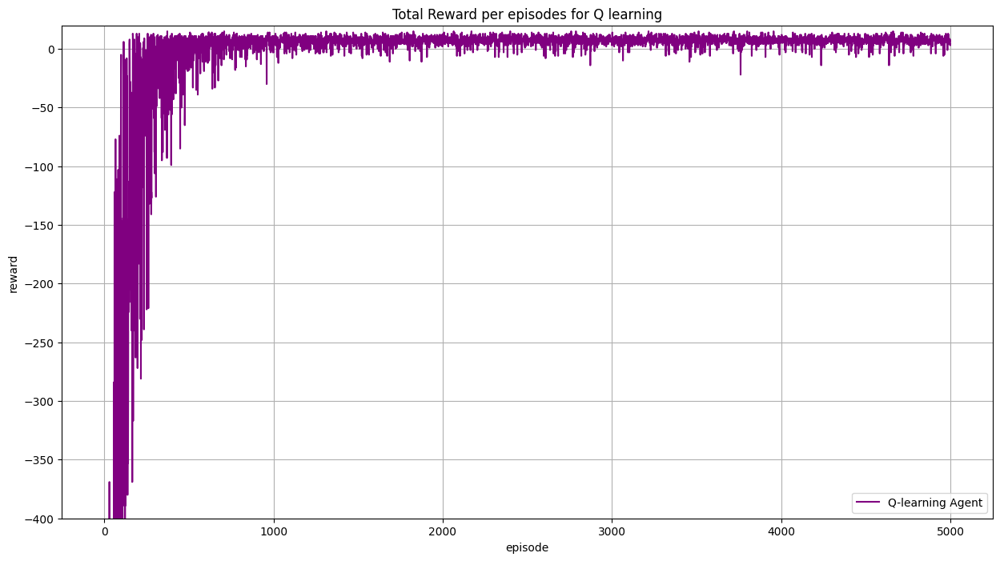

Number of times passenger was dropped off: 4906.0
Max reward: 15.0
Min reward: -875.0
Avg reward: -9.491


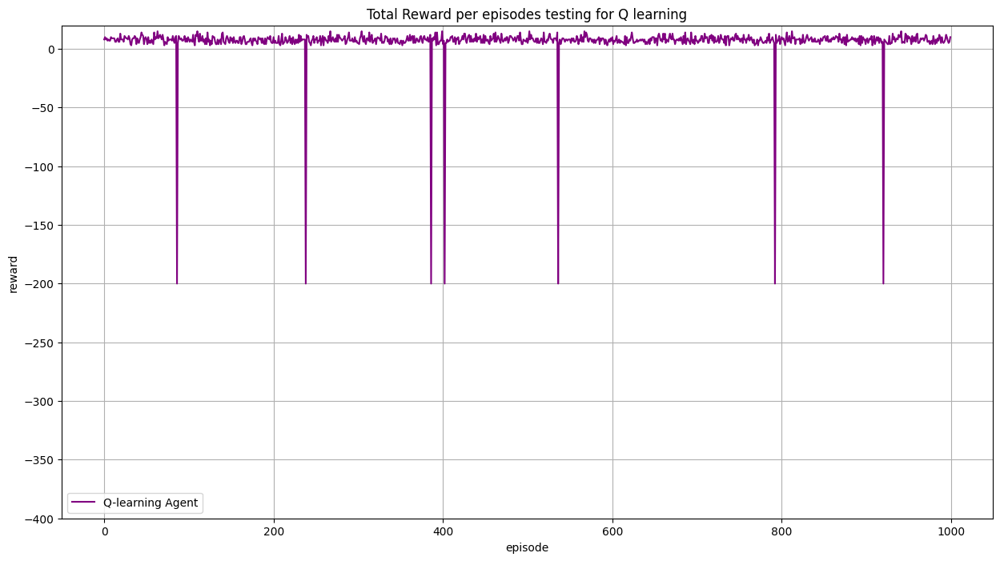

epsilon = 0.9
Training....
epsilon: 1.0
epsilon: 0.9901493354116764
epsilon: 0.9803966865736877
epsilon: 0.970741078213023
epsilon: 0.9611815447608
epsilon: 0.9517171302557069
epsilon: 0.9423468882484062
epsilon: 0.9330698817068888
epsilon: 0.9238851829227694
epsilon: 0.9147918734185159
epsilon: 0.9057890438555999
epsilon: 0.896875793943563
epsilon: 0.888051232349986
epsilon: 0.8793144766113556
epsilon: 0.8706646530448178
epsilon: 0.8621008966608072
epsilon: 0.8536223510765493
epsilon: 0.8452281684304199
epsilon: 0.8369175092971592
epsilon: 0.8286895426039287
epsilon: 0.820543445547202
epsilon: 0.8124784035104852
epsilon: 0.8044936099828537
epsilon: 0.7965882664783007
epsilon: 0.7887615824558879
epsilon: 0.7810127752406908
epsilon: 0.7733410699455306
epsilon: 0.7657456993934846
epsilon: 0.7582259040411682
epsilon: 0.7507809319027796
epsilon: 0.7434100384749007
epsilon: 0.7361124866620463
epsilon: 0.7288875467029541
epsilon: 0.7217344960976069
epsilon: 0.7146526195349836
epsilon: 0.7076

epsilon: 0.010409714355138974
epsilon: 0.010405637629189989
epsilon: 0.010401601467341955
epsilon: 0.010397605465975325
epsilon: 0.01039364922548663
epsilon: 0.010389732350248527
epsilon: 0.010385854448570228
epsilon: 0.01038201513265833
epsilon: 0.010378214018578047
epsilon: 0.0103744507262148
epsilon: 0.010370724879236218
epsilon: 0.010367036105054498
epsilon: 0.010363384034789147
epsilon: 0.010359768303230097
epsilon: 0.010356188548801179
epsilon: 0.010352644413523964
epsilon: 0.010349135542981974
epsilon: 0.010345661586285228
epsilon: 0.010342222196035164
epsilon: 0.01033881702828989
epsilon: 0.010335445742529792
epsilon: 0.010332108001623487
epsilon: 0.010328803471794101
epsilon: 0.0103255318225859
epsilon: 0.010322292726831234
epsilon: 0.01031908586061783
epsilon: 0.010315910903256391
epsilon: 0.01031276753724854
epsilon: 0.010309655448255054
epsilon: 0.01030657432506444
epsilon: 0.010303523859561813
epsilon: 0.01030050374669808
epsilon: 0.010297513684459435
epsilon: 0.0102945533

epsilon: 0.010001343744637396
epsilon: 0.010001330374154856
epsilon: 0.010001317136710838
epsilon: 0.010001304030981591
epsilon: 0.010001291055656527
epsilon: 0.010001278209438106
epsilon: 0.010001265491041694
epsilon: 0.01000125289919544
epsilon: 0.01000124043264015
epsilon: 0.010001228090129157
epsilon: 0.0100012158704282
epsilon: 0.0100012037723153
epsilon: 0.010001191794580635
epsilon: 0.010001179936026422
epsilon: 0.010001168195466793
epsilon: 0.010001156571727685
epsilon: 0.010001145063646714
epsilon: 0.010001133670073062
epsilon: 0.01000112238986736
epsilon: 0.010001111221901582
epsilon: 0.01000110016505892
epsilon: 0.01000108921823368
epsilon: 0.010001078380331171
epsilon: 0.010001067650267596
epsilon: 0.010001057026969934
epsilon: 0.010001046509375852
epsilon: 0.01000103609643358
epsilon: 0.010001025787101813
epsilon: 0.010001015580349612
epsilon: 0.010001005475156293
epsilon: 0.010000995470511326
epsilon: 0.01000098556541424
epsilon: 0.010000975758874518
epsilon: 0.0100009660

epsilon: 0.010000000018934219
epsilon: 0.01000000001874582
epsilon: 0.010000000018559297
epsilon: 0.010000000018374628
epsilon: 0.010000000018191797
epsilon: 0.010000000018010786
epsilon: 0.010000000017831575
epsilon: 0.01000000001765415
epsilon: 0.010000000017478486
epsilon: 0.010000000017304573
epsilon: 0.01000000001713239
epsilon: 0.01000000001696192
epsilon: 0.010000000016793145
epsilon: 0.010000000016626051
epsilon: 0.01000000001646062
epsilon: 0.010000000016296832
epsilon: 0.010000000016134677
epsilon: 0.010000000015974134
epsilon: 0.010000000015815188
epsilon: 0.010000000015657824
epsilon: 0.010000000015502027
epsilon: 0.010000000015347779
epsilon: 0.010000000015195066
epsilon: 0.010000000015043873
epsilon: 0.010000000014894183
epsilon: 0.010000000014745984
epsilon: 0.01000000001459926
epsilon: 0.010000000014453994
epsilon: 0.010000000014310175
epsilon: 0.010000000014167785
epsilon: 0.010000000014026815
epsilon: 0.010000000013887246
epsilon: 0.010000000013749065
epsilon: 0.01000

epsilon: 0.010000000000005522
epsilon: 0.010000000000005466
epsilon: 0.010000000000005413
epsilon: 0.010000000000005359
epsilon: 0.010000000000005305
epsilon: 0.010000000000005253
epsilon: 0.010000000000005201
epsilon: 0.010000000000005149
epsilon: 0.010000000000005097
epsilon: 0.010000000000005047
epsilon: 0.010000000000004996
epsilon: 0.010000000000004948
epsilon: 0.010000000000004897
epsilon: 0.010000000000004849
epsilon: 0.0100000000000048
epsilon: 0.010000000000004753
epsilon: 0.010000000000004707
epsilon: 0.01000000000000466
epsilon: 0.010000000000004613
epsilon: 0.010000000000004566
epsilon: 0.010000000000004521
epsilon: 0.010000000000004476
epsilon: 0.010000000000004432
epsilon: 0.010000000000004387
epsilon: 0.010000000000004344
epsilon: 0.0100000000000043
epsilon: 0.010000000000004257
epsilon: 0.010000000000004216
epsilon: 0.010000000000004174
epsilon: 0.010000000000004132
epsilon: 0.01000000000000409
epsilon: 0.01000000000000405
epsilon: 0.01000000000000401
epsilon: 0.0100000

epsilon: 0.010000000000000021
epsilon: 0.010000000000000021
epsilon: 0.010000000000000021
epsilon: 0.010000000000000021
epsilon: 0.010000000000000021
epsilon: 0.010000000000000021
epsilon: 0.010000000000000021
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.01000000000000002
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000018
epsilon: 0.010000000000000016
epsilon: 0.010000000000000016
epsilon: 0.010000000000000016
epsilon: 0.010000000000000016
epsilon: 0.010000000000000016
epsilon: 0.010000000000000016
epsilon: 0.010000000000000016
epsilon: 0.01000000

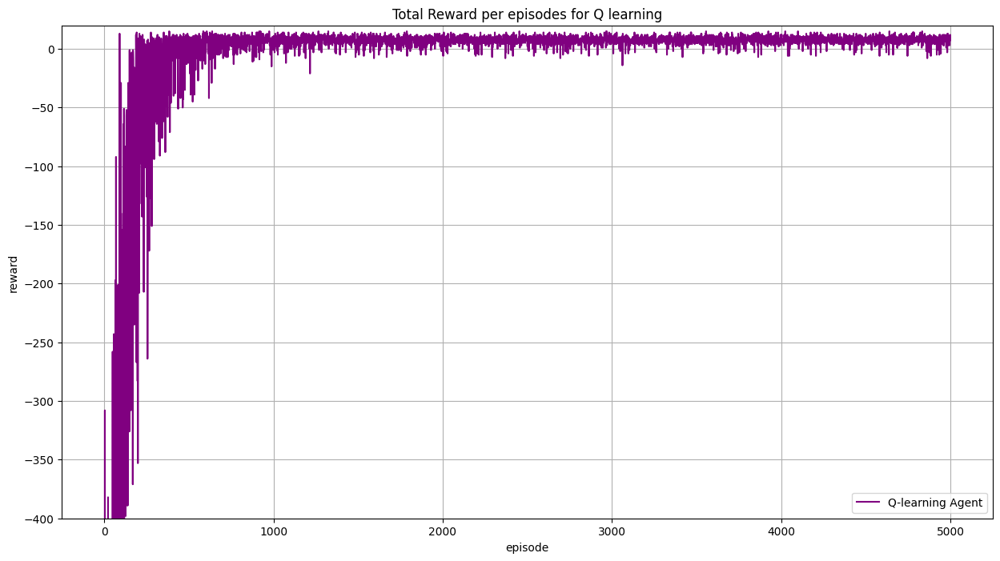

Number of times passenger was dropped off: 4901.0
Max reward: 15.0
Min reward: -902.0
Avg reward: -9.2516


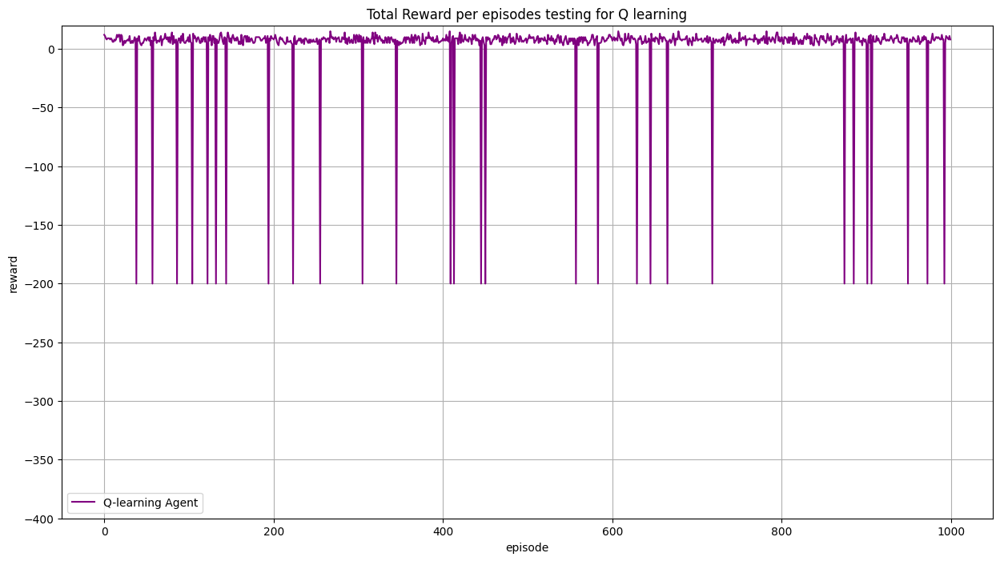

epsilon = 0.8
Training....
epsilon: 1.0
epsilon: 0.9901493354116764
epsilon: 0.9803966865736877
epsilon: 0.970741078213023
epsilon: 0.9611815447608
epsilon: 0.9517171302557069
epsilon: 0.9423468882484062
epsilon: 0.9330698817068888
epsilon: 0.9238851829227694
epsilon: 0.9147918734185159
epsilon: 0.9057890438555999
epsilon: 0.896875793943563
epsilon: 0.888051232349986
epsilon: 0.8793144766113556
epsilon: 0.8706646530448178
epsilon: 0.8621008966608072
epsilon: 0.8536223510765493
epsilon: 0.8452281684304199
epsilon: 0.8369175092971592
epsilon: 0.8286895426039287
epsilon: 0.820543445547202
epsilon: 0.8124784035104852
epsilon: 0.8044936099828537
epsilon: 0.7965882664783007
epsilon: 0.7887615824558879
epsilon: 0.7810127752406908
epsilon: 0.7733410699455306
epsilon: 0.7657456993934846
epsilon: 0.7582259040411682
epsilon: 0.7507809319027796
epsilon: 0.7434100384749007
epsilon: 0.7361124866620463
epsilon: 0.7288875467029541
epsilon: 0.7217344960976069
epsilon: 0.7146526195349836
epsilon: 0.7076

epsilon: 0.011564716947048855
epsilon: 0.011549147753290225
epsilon: 0.011533733475597885
epsilon: 0.011518472572531219
epsilon: 0.011503363517987204
epsilon: 0.011488404801047796
epsilon: 0.011473594925828836
epsilon: 0.011458932411330456
epsilon: 0.01144441579128899
epsilon: 0.011430043614030338
epsilon: 0.011415814442324796
epsilon: 0.011401726853243335
epsilon: 0.011387779438015309
epsilon: 0.011373970801887569
epsilon: 0.011360299563985
epsilon: 0.011346764357172414
epsilon: 0.011333363827917855
epsilon: 0.011320096636157226
epsilon: 0.011306961455160297
epsilon: 0.011293956971398022
epsilon: 0.01128108188441119
epsilon: 0.01126833490668037
epsilon: 0.011255714763497167
epsilon: 0.011243220192836747
epsilon: 0.011230849945231628
epsilon: 0.011218602783646746
epsilon: 0.011206477483355735
epsilon: 0.01119447283181846
epsilon: 0.011182587628559764
epsilon: 0.011170820685049418
epsilon: 0.011159170824583262
epsilon: 0.011147636882165546
epsilon: 0.011136217704392411
epsilon: 0.011124

epsilon: 0.010000002102685845
epsilon: 0.01000000208176377
epsilon: 0.010000002061049876
epsilon: 0.010000002040542086
epsilon: 0.010000002020238354
epsilon: 0.010000002000136647
epsilon: 0.010000001980234954
epsilon: 0.010000001960531286
epsilon: 0.010000001941023675
epsilon: 0.010000001921710166
epsilon: 0.010000001902588831
epsilon: 0.010000001883657756
epsilon: 0.010000001864915047
epsilon: 0.010000001846358833
epsilon: 0.010000001827987255
epsilon: 0.010000001809798478
epsilon: 0.010000001791790683
epsilon: 0.010000001773962068
epsilon: 0.01000000175631085
epsilon: 0.010000001738835265
epsilon: 0.010000001721533565
epsilon: 0.01000000170440402
epsilon: 0.010000001687444917
epsilon: 0.01000000167065456
epsilon: 0.010000001654031268
epsilon: 0.010000001637573383
epsilon: 0.010000001621279255
epsilon: 0.010000001605147257
epsilon: 0.010000001589175776
epsilon: 0.010000001573363212
epsilon: 0.010000001557707985
epsilon: 0.010000001542208533
epsilon: 0.010000001526863301
epsilon: 0.010

epsilon: 0.010000000000003091
epsilon: 0.010000000000003062
epsilon: 0.01000000000000303
epsilon: 0.010000000000003001
epsilon: 0.01000000000000297
epsilon: 0.01000000000000294
epsilon: 0.010000000000002911
epsilon: 0.010000000000002883
epsilon: 0.010000000000002854
epsilon: 0.010000000000002826
epsilon: 0.010000000000002798
epsilon: 0.01000000000000277
epsilon: 0.010000000000002743
epsilon: 0.010000000000002715
epsilon: 0.010000000000002687
epsilon: 0.010000000000002661
epsilon: 0.010000000000002635
epsilon: 0.01000000000000261
epsilon: 0.010000000000002583
epsilon: 0.010000000000002557
epsilon: 0.010000000000002531
epsilon: 0.010000000000002507
epsilon: 0.01000000000000248
epsilon: 0.010000000000002457
epsilon: 0.010000000000002432
epsilon: 0.010000000000002408
epsilon: 0.010000000000002384
epsilon: 0.010000000000002361
epsilon: 0.010000000000002337
epsilon: 0.010000000000002314
epsilon: 0.01000000000000229
epsilon: 0.010000000000002267
epsilon: 0.010000000000002245
epsilon: 0.010000

epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0

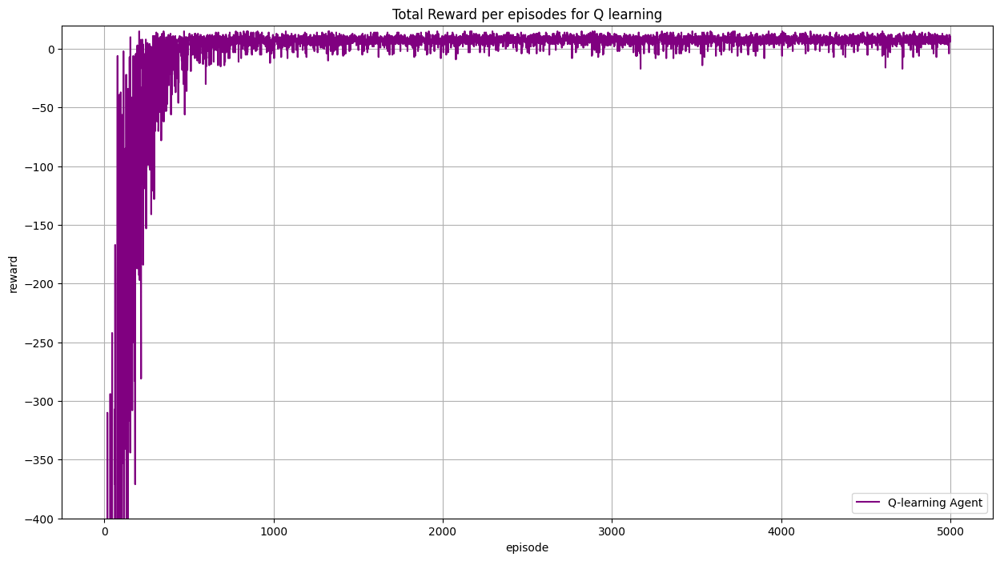

Number of times passenger was dropped off: 4902.0
Max reward: 15.0
Min reward: -884.0
Avg reward: -9.5794


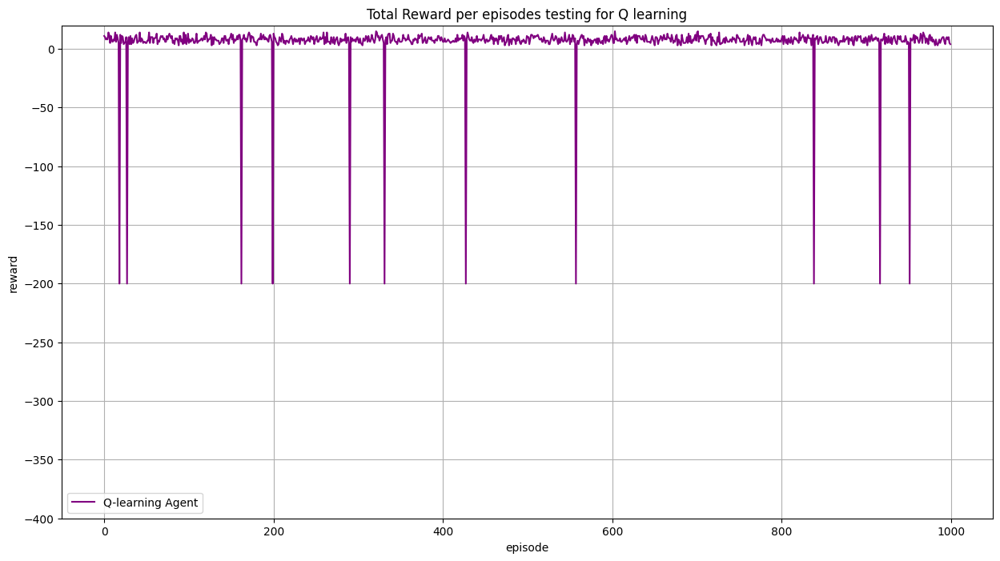

epsilon = 0.7
Training....
epsilon: 1.0
epsilon: 0.9901493354116764
epsilon: 0.9803966865736877
epsilon: 0.970741078213023
epsilon: 0.9611815447608
epsilon: 0.9517171302557069
epsilon: 0.9423468882484062
epsilon: 0.9330698817068888
epsilon: 0.9238851829227694
epsilon: 0.9147918734185159
epsilon: 0.9057890438555999
epsilon: 0.896875793943563
epsilon: 0.888051232349986
epsilon: 0.8793144766113556
epsilon: 0.8706646530448178
epsilon: 0.8621008966608072
epsilon: 0.8536223510765493
epsilon: 0.8452281684304199
epsilon: 0.8369175092971592
epsilon: 0.8286895426039287
epsilon: 0.820543445547202
epsilon: 0.8124784035104852
epsilon: 0.8044936099828537
epsilon: 0.7965882664783007
epsilon: 0.7887615824558879
epsilon: 0.7810127752406908
epsilon: 0.7733410699455306
epsilon: 0.7657456993934846
epsilon: 0.7582259040411682
epsilon: 0.7507809319027796
epsilon: 0.7434100384749007
epsilon: 0.7361124866620463
epsilon: 0.7288875467029541
epsilon: 0.7217344960976069
epsilon: 0.7146526195349836
epsilon: 0.7076

epsilon: 0.010001370890079726
epsilon: 0.01000135724949552
epsilon: 0.010001343744637396
epsilon: 0.010001330374154856
epsilon: 0.010001317136710838
epsilon: 0.010001304030981591
epsilon: 0.010001291055656527
epsilon: 0.010001278209438106
epsilon: 0.010001265491041694
epsilon: 0.01000125289919544
epsilon: 0.01000124043264015
epsilon: 0.010001228090129157
epsilon: 0.0100012158704282
epsilon: 0.0100012037723153
epsilon: 0.010001191794580635
epsilon: 0.010001179936026422
epsilon: 0.010001168195466793
epsilon: 0.010001156571727685
epsilon: 0.010001145063646714
epsilon: 0.010001133670073062
epsilon: 0.01000112238986736
epsilon: 0.010001111221901582
epsilon: 0.01000110016505892
epsilon: 0.01000108921823368
epsilon: 0.010001078380331171
epsilon: 0.010001067650267596
epsilon: 0.010001057026969934
epsilon: 0.010001046509375852
epsilon: 0.01000103609643358
epsilon: 0.010001025787101813
epsilon: 0.010001015580349612
epsilon: 0.010001005475156293
epsilon: 0.010000995470511326
epsilon: 0.0100009855

epsilon: 0.0100000039877035
epsilon: 0.010000003948025186
epsilon: 0.01000000390874168
epsilon: 0.01000000386984905
epsilon: 0.01000000383134341
epsilon: 0.010000003793220904
epsilon: 0.010000003755477726
epsilon: 0.010000003718110098
epsilon: 0.010000003681114285
epsilon: 0.010000003644486586
epsilon: 0.010000003608223338
epsilon: 0.010000003572320917
epsilon: 0.010000003536775728
epsilon: 0.010000003501584222
epsilon: 0.010000003466742877
epsilon: 0.01000000343224821
epsilon: 0.01000000339809677
epsilon: 0.010000003364285142
epsilon: 0.010000003330809946
epsilon: 0.010000003297667832
epsilon: 0.010000003264855489
epsilon: 0.010000003232369634
epsilon: 0.01000000320020702
epsilon: 0.010000003168364427
epsilon: 0.010000003136838674
epsilon: 0.010000003105626609
epsilon: 0.010000003074725107
epsilon: 0.010000003044131081
epsilon: 0.01000000301384147
epsilon: 0.010000002983853246
epsilon: 0.01000000295416341
epsilon: 0.010000002924768993
epsilon: 0.010000002895667057
epsilon: 0.010000002

epsilon: 0.010000000001311238
epsilon: 0.01000000000129819
epsilon: 0.010000000001285272
epsilon: 0.010000000001272484
epsilon: 0.010000000001259822
epsilon: 0.010000000001247287
epsilon: 0.010000000001234877
epsilon: 0.01000000000122259
epsilon: 0.010000000001210424
epsilon: 0.01000000000119838
epsilon: 0.010000000001186456
epsilon: 0.01000000000117465
epsilon: 0.010000000001162962
epsilon: 0.010000000001151392
epsilon: 0.010000000001139934
epsilon: 0.010000000001128592
epsilon: 0.010000000001117362
epsilon: 0.010000000001106244
epsilon: 0.010000000001095237
epsilon: 0.01000000000108434
epsilon: 0.01000000000107355
epsilon: 0.010000000001062869
epsilon: 0.010000000001052292
epsilon: 0.010000000001041821
epsilon: 0.010000000001031456
epsilon: 0.010000000001021192
epsilon: 0.010000000001011032
epsilon: 0.010000000001000972
epsilon: 0.010000000000991011
epsilon: 0.010000000000981151
epsilon: 0.010000000000971388
epsilon: 0.010000000000961722
epsilon: 0.010000000000952153
epsilon: 0.01000

epsilon: 0.010000000000000071
epsilon: 0.010000000000000071
epsilon: 0.010000000000000071
epsilon: 0.01000000000000007
epsilon: 0.01000000000000007
epsilon: 0.010000000000000068
epsilon: 0.010000000000000068
epsilon: 0.010000000000000068
epsilon: 0.010000000000000066
epsilon: 0.010000000000000066
epsilon: 0.010000000000000066
epsilon: 0.010000000000000064
epsilon: 0.010000000000000064
epsilon: 0.010000000000000063
epsilon: 0.010000000000000063
epsilon: 0.010000000000000063
epsilon: 0.010000000000000061
epsilon: 0.010000000000000061
epsilon: 0.010000000000000061
epsilon: 0.01000000000000006
epsilon: 0.01000000000000006
epsilon: 0.01000000000000006
epsilon: 0.010000000000000057
epsilon: 0.010000000000000057
epsilon: 0.010000000000000057
epsilon: 0.010000000000000056
epsilon: 0.010000000000000056
epsilon: 0.010000000000000056
epsilon: 0.010000000000000054
epsilon: 0.010000000000000054
epsilon: 0.010000000000000054
epsilon: 0.010000000000000052
epsilon: 0.010000000000000052
epsilon: 0.0100

epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0.010000000000000002
epsilon: 0

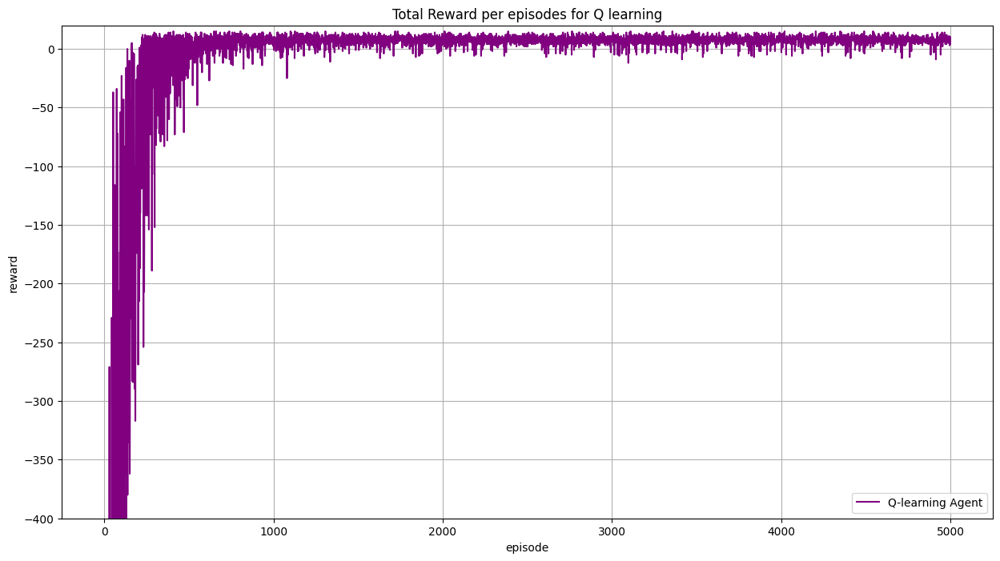

Number of times passenger was dropped off: 4904.0
Max reward: 15.0
Min reward: -830.0
Avg reward: -8.975


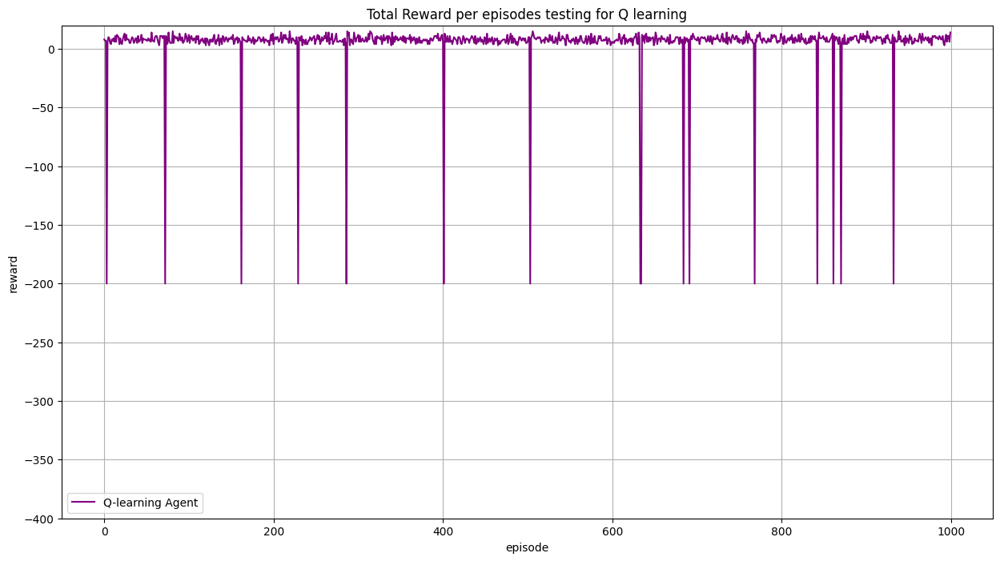

In [28]:
for i in [1,0.9,0.8,0.7]:
        epsilon = i
        print(f"epsilon = {epsilon}")
        Q_agent = Q_Agent(max_episodes, 
                max_steps, 
                test_episodes, 
                alpha, 
                gamma, 
                epsilon = epsilon, 
                decay_rate = decay_rate,
                optimistic= False)

        Q_agent.run()
        Q_agent.test()

In [11]:
epsilon = 0.9
#based on results above

# Sarsa Class and Testing

Training...
Learning done!


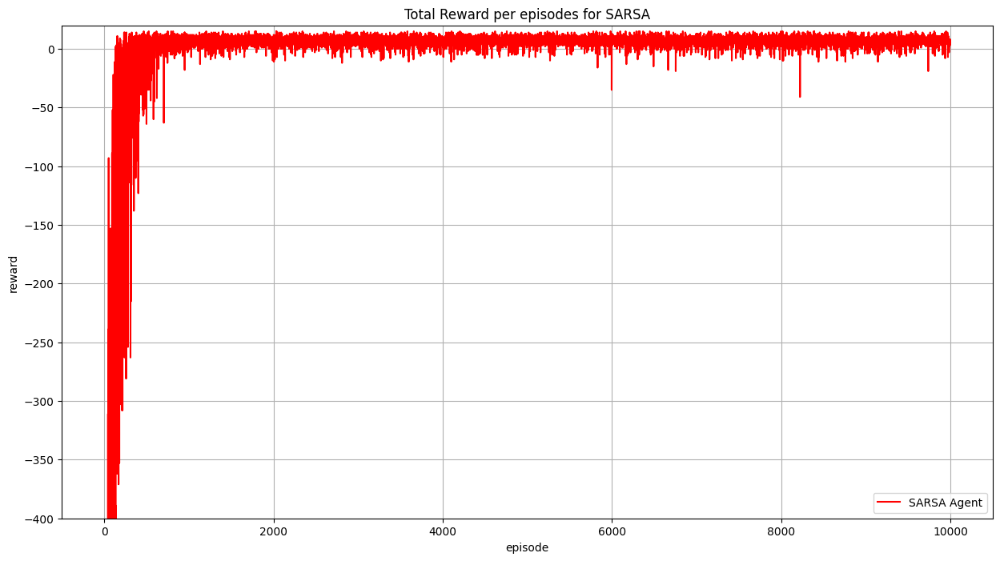

Number of times passenger was dropped off: 9875.0
Max reward: 15.0
Min reward: -893.0
Avg reward: -2.2429
Testing...
Learning done!


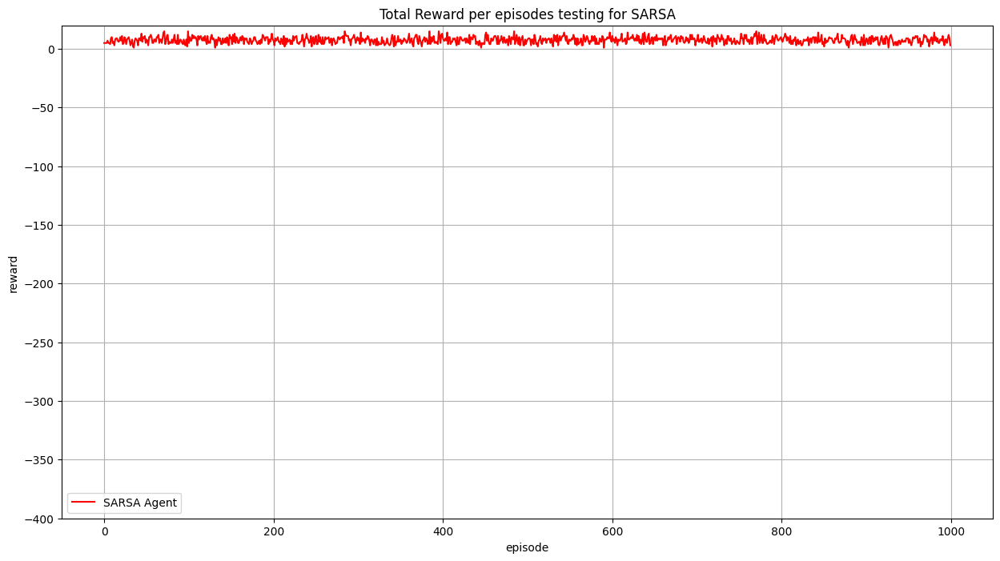

In [12]:
#testing 

sarsa_OIV_agent = SarsaAgent(max_episodes = 10000, 
                max_steps = 200, 
                test_episodes = 1000, 
                alpha = 0.3, 
                gamma = 1, 
                epsilon = 1, 
                decay_rate = 0.01,
                optimistic = False)
sarsa_OIV_agent.run()
sarsa_OIV_agent.test()

# Testing different alphas and gammas for SARSA Agent.

alpha = 0.1
...... running with alpha = 0.1 and gamma = 1 ......
Training...
Learning done!


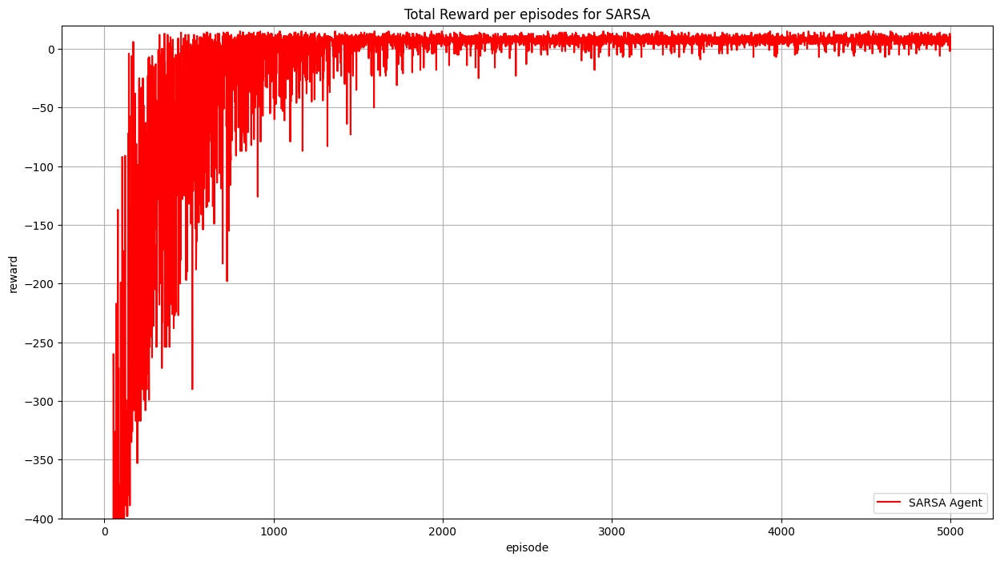

Number of times passenger was dropped off: 4803.0
Max reward: 15.0
Min reward: -875.0
Avg reward: -21.3824
Testing...
Learning done!


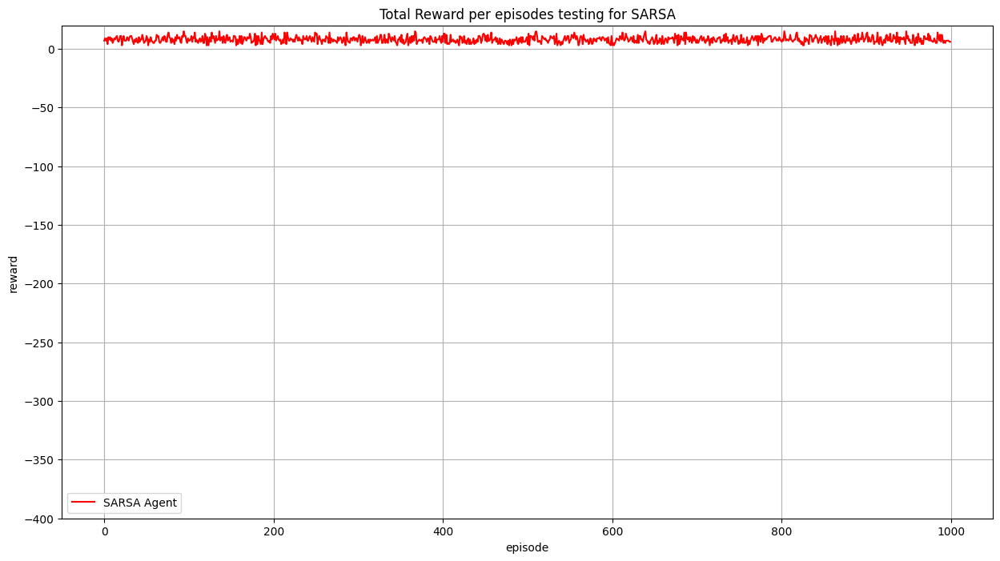

...... running with alpha = 0.1 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


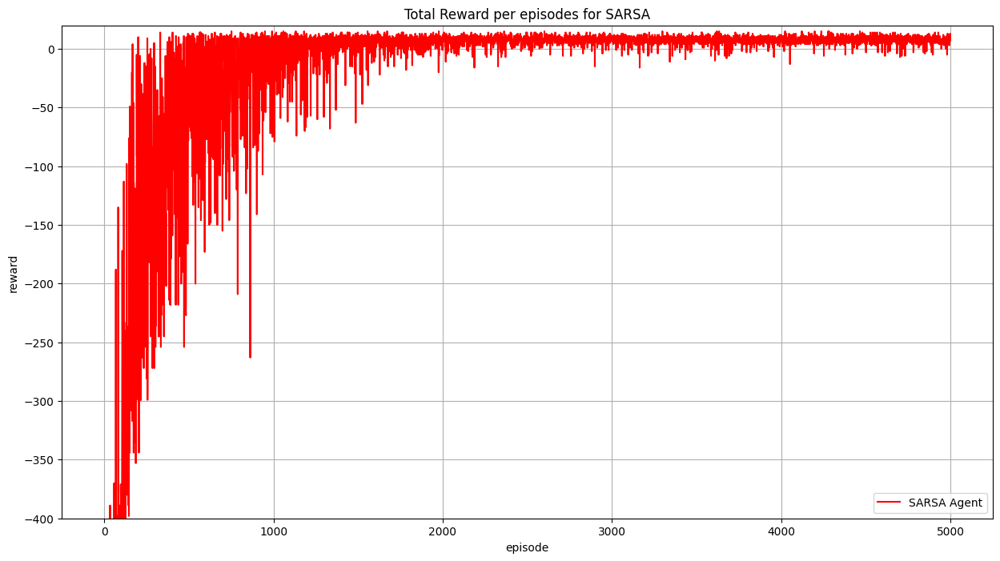

Number of times passenger was dropped off: 4802.0
Max reward: 15.0
Min reward: -821.0
Avg reward: -21.5726
Testing...
Learning done!


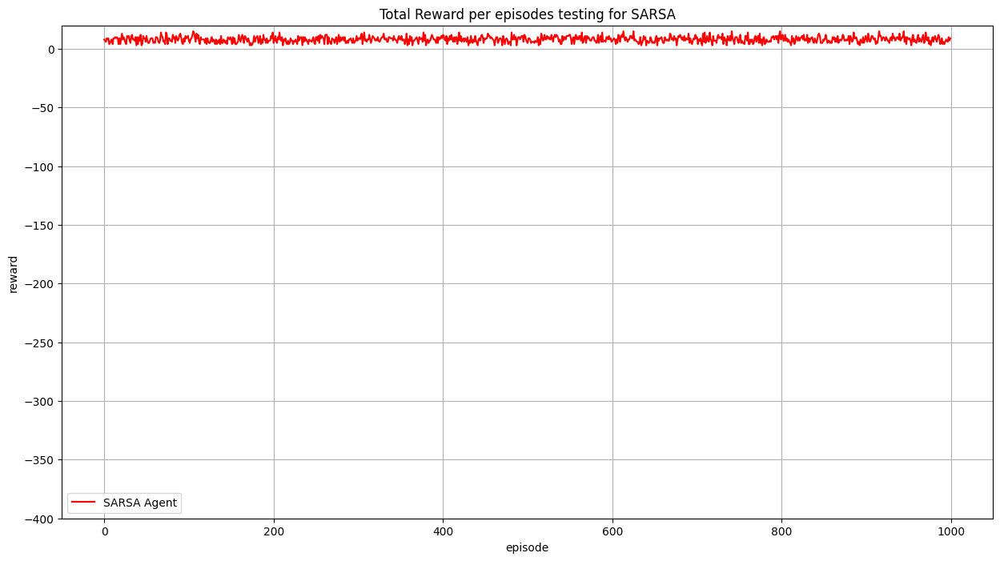

...... running with alpha = 0.1 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


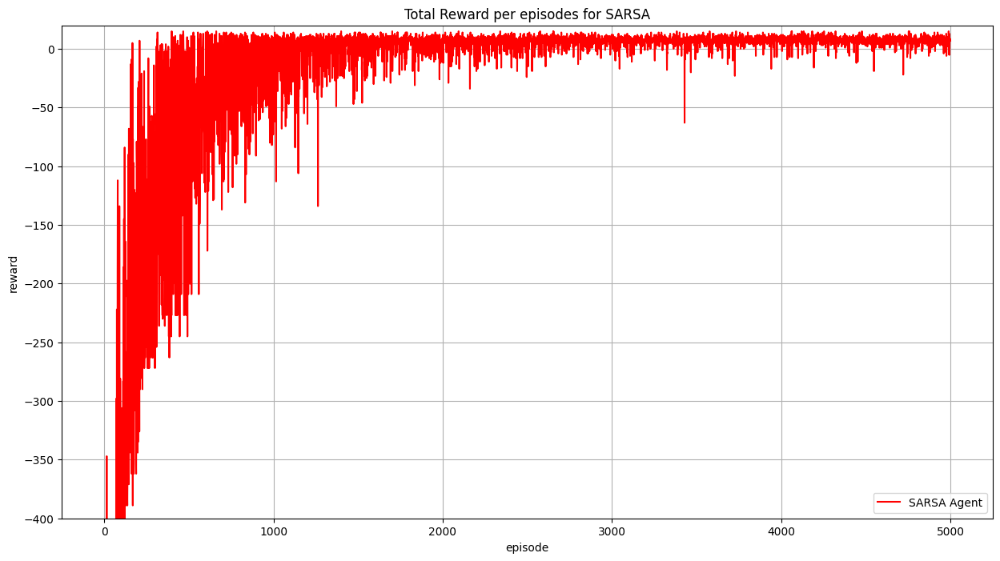

Number of times passenger was dropped off: 4781.0
Max reward: 15.0
Min reward: -866.0
Avg reward: -23.3498
Testing...
Learning done!


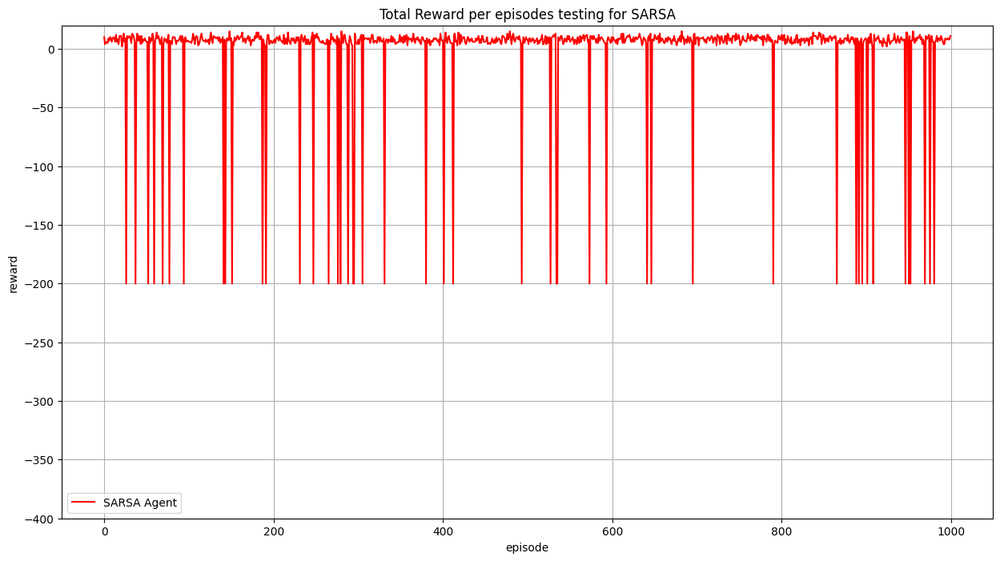

...... running with alpha = 0.1 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


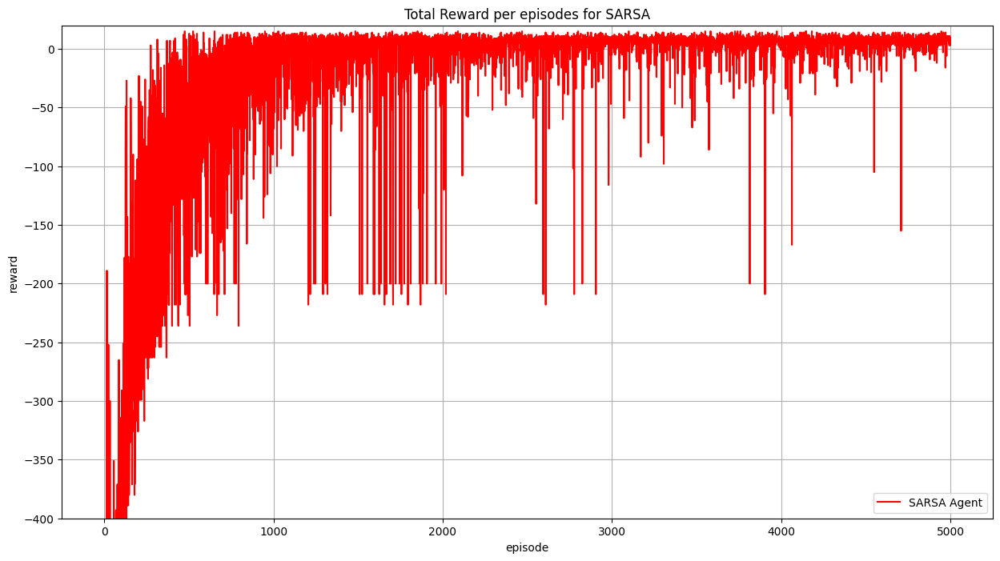

Number of times passenger was dropped off: 4710.0
Max reward: 15.0
Min reward: -893.0
Avg reward: -29.4394
Testing...
Learning done!


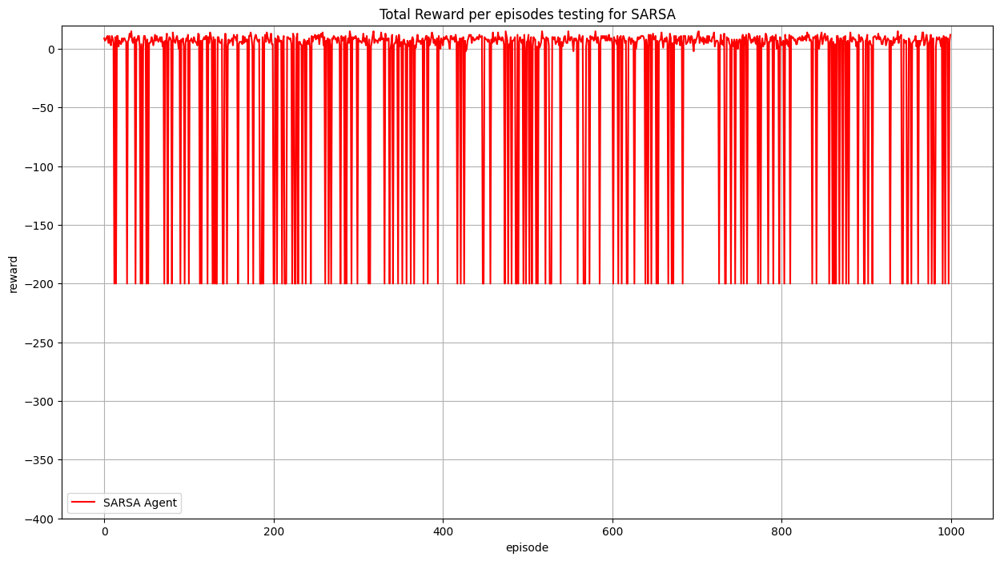

alpha = 0.2
...... running with alpha = 0.2 and gamma = 1 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


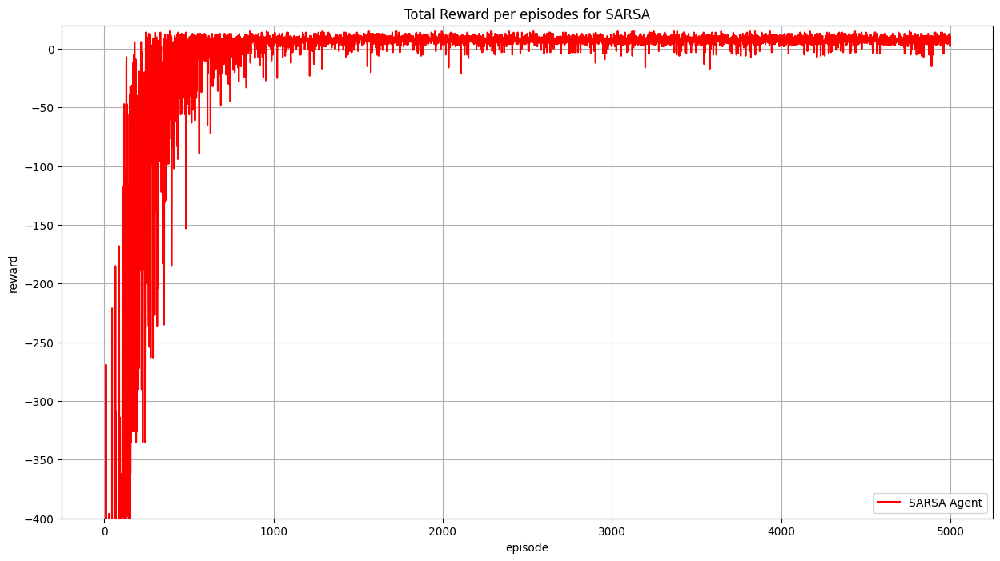

Number of times passenger was dropped off: 4855.0
Max reward: 15.0
Min reward: -911.0
Avg reward: -13.285
Testing...
Learning done!


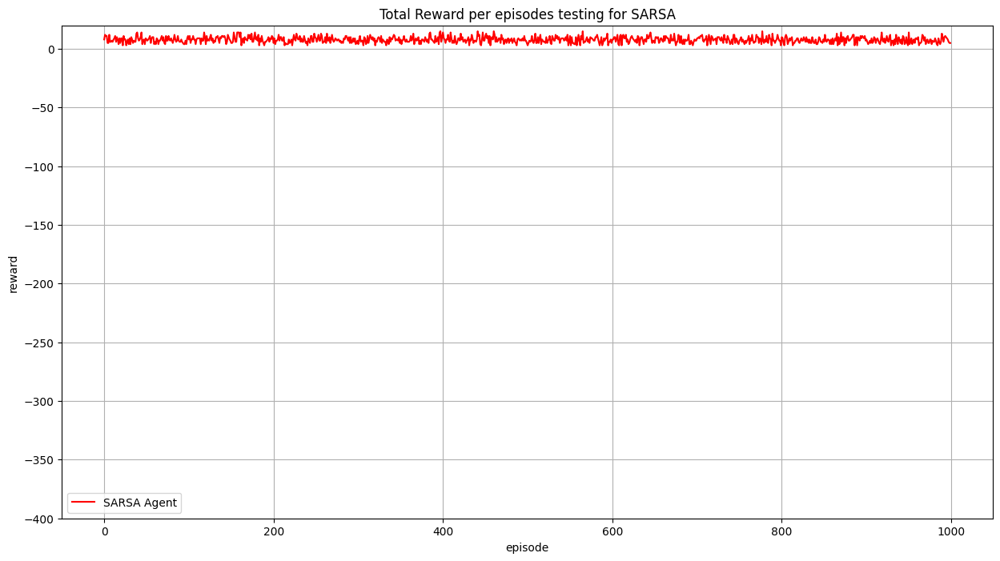

...... running with alpha = 0.2 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


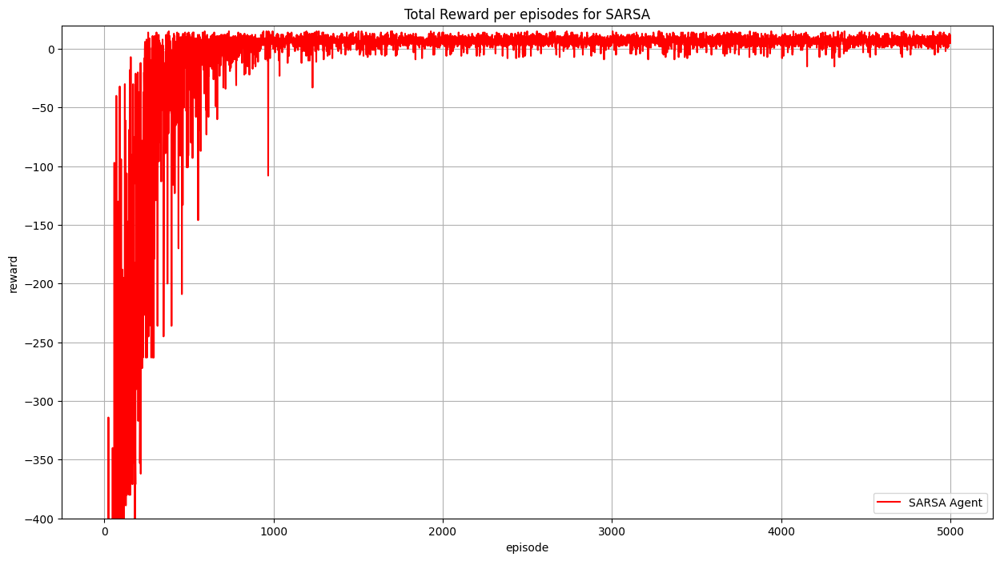

Number of times passenger was dropped off: 4838.0
Max reward: 15.0
Min reward: -902.0
Avg reward: -14.5262
Testing...
Learning done!


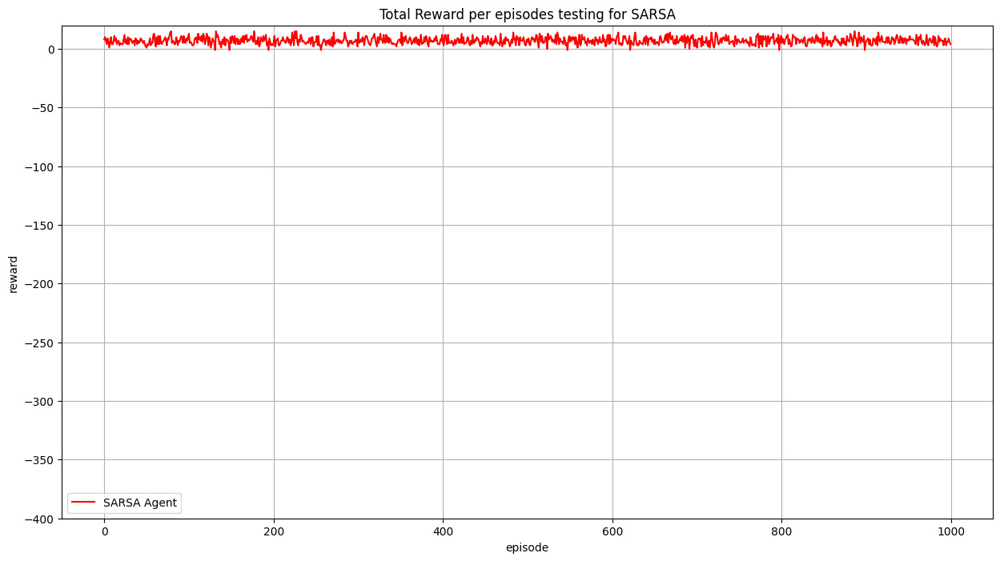

...... running with alpha = 0.2 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


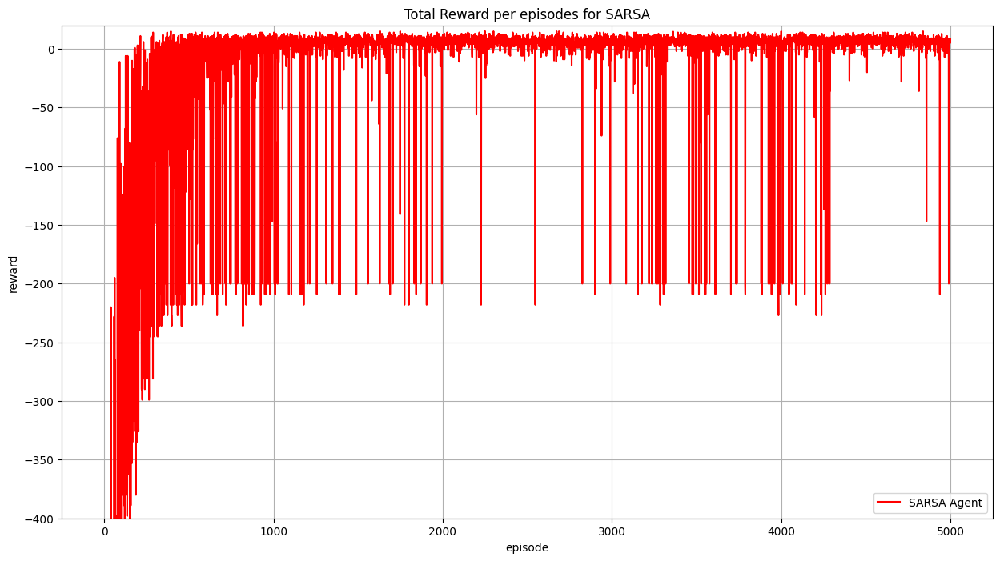

Number of times passenger was dropped off: 4672.0
Max reward: 15.0
Min reward: -893.0
Avg reward: -22.1372
Testing...
Learning done!


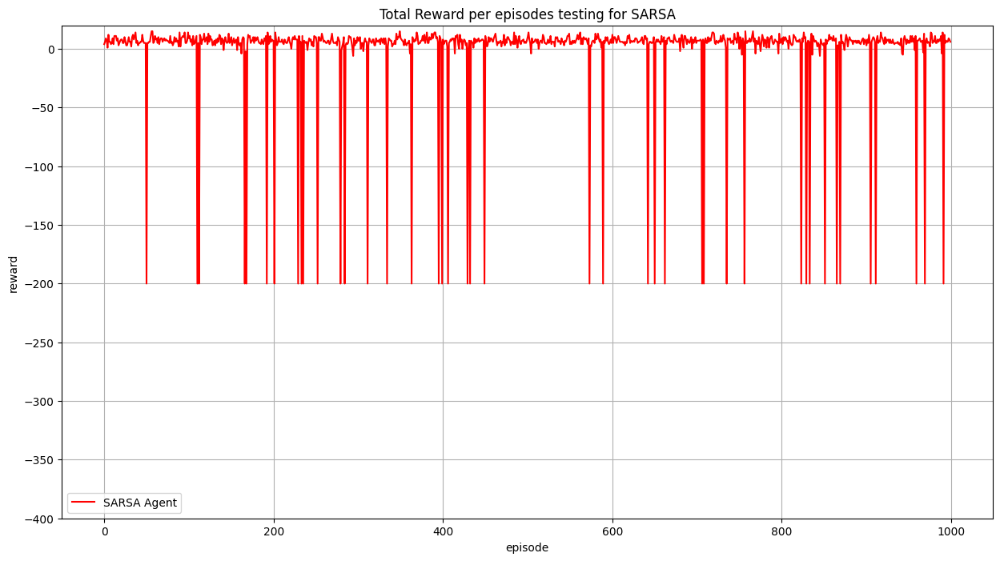

...... running with alpha = 0.2 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


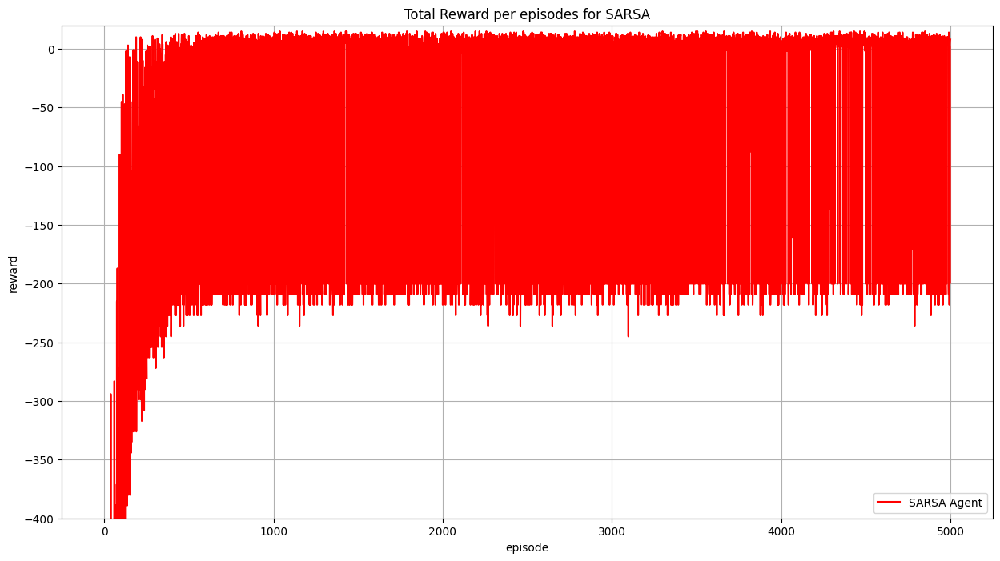

Number of times passenger was dropped off: 3078.0
Max reward: 15.0
Min reward: -893.0
Avg reward: -89.3634
Testing...
Learning done!


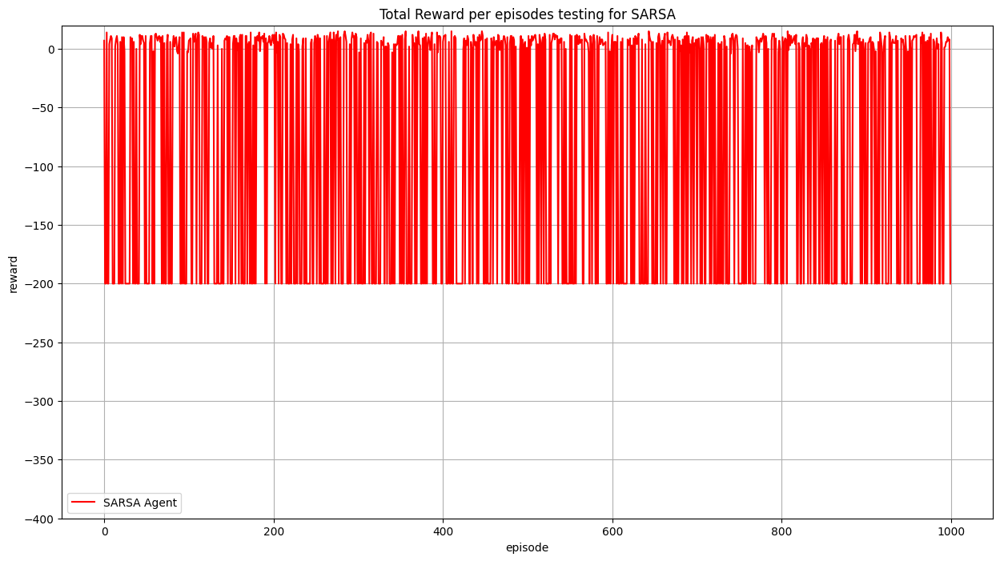

alpha = 0.3
...... running with alpha = 0.3 and gamma = 1 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


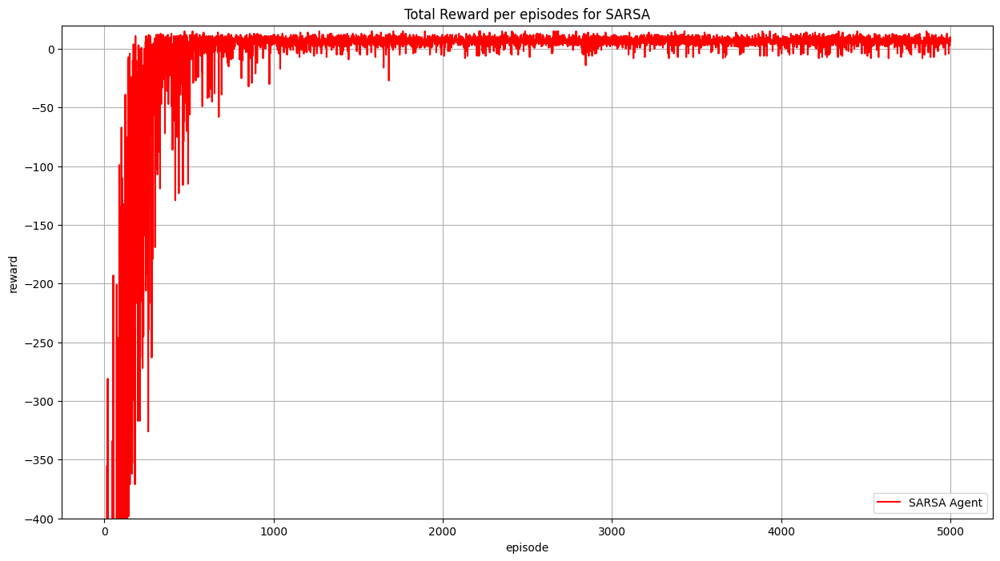

Number of times passenger was dropped off: 4869.0
Max reward: 15.0
Min reward: -839.0
Avg reward: -12.1188
Testing...
Learning done!


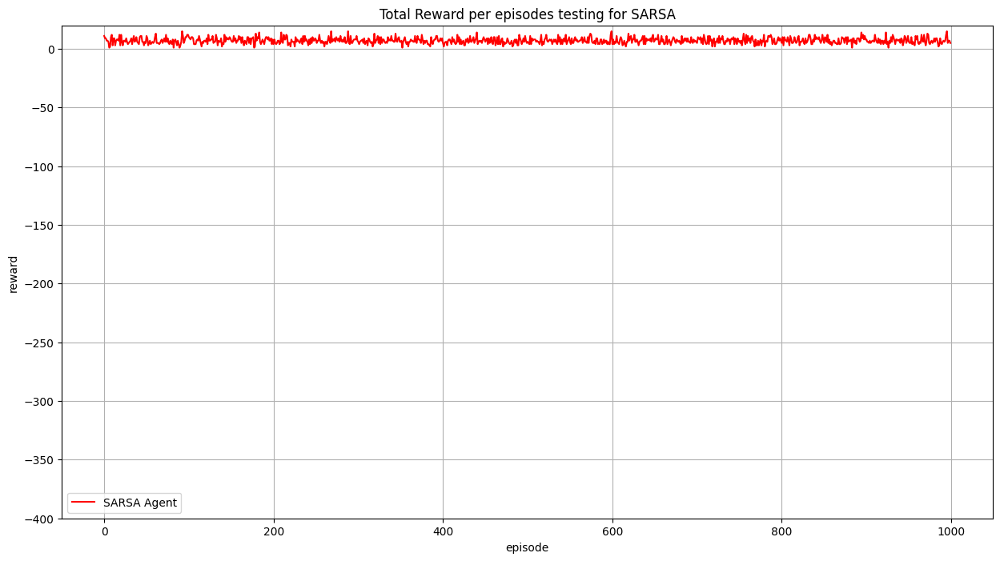

...... running with alpha = 0.3 and gamma = 0.9 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


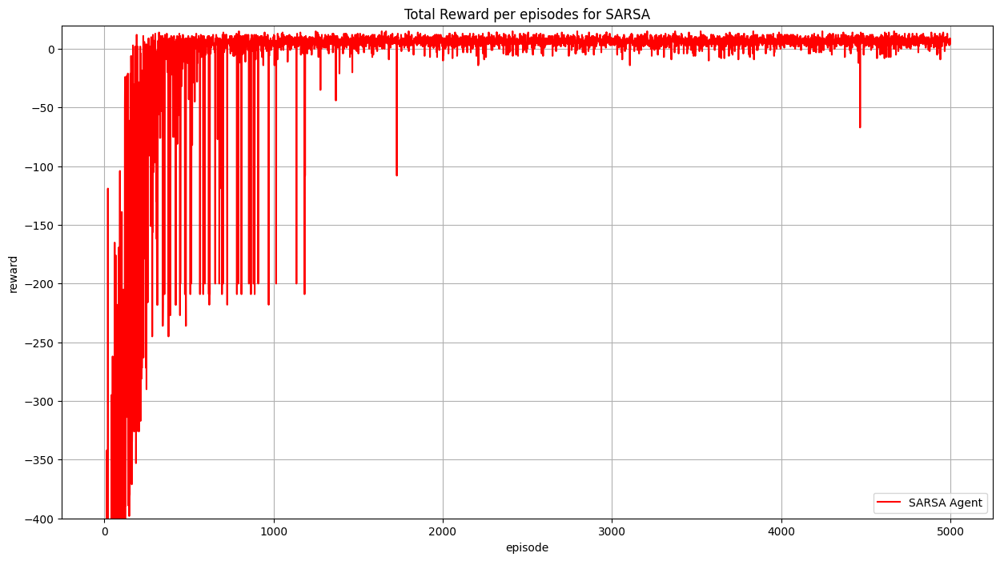

Number of times passenger was dropped off: 4812.0
Max reward: 15.0
Min reward: -884.0
Avg reward: -14.199
Testing...
Learning done!


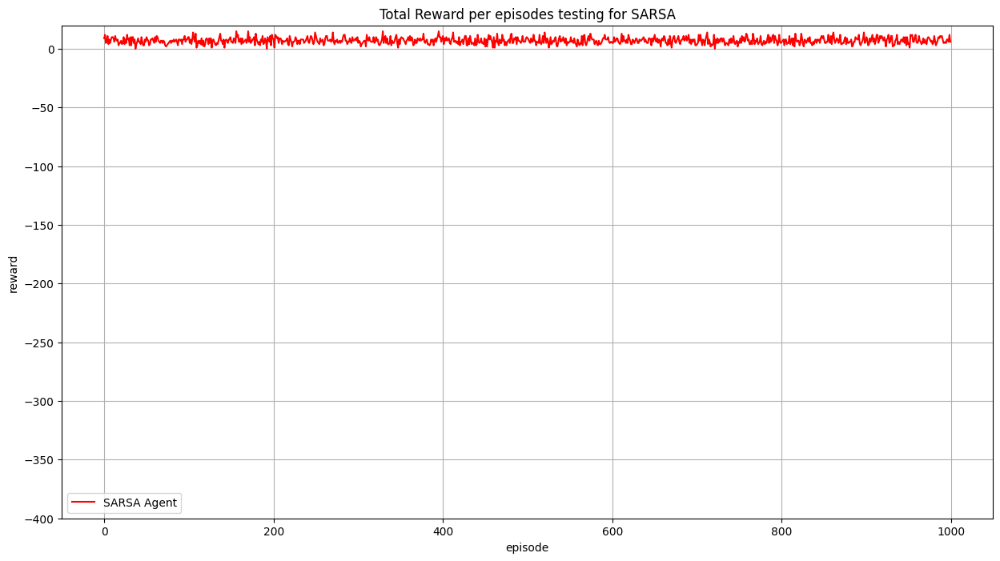

...... running with alpha = 0.3 and gamma = 0.8 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


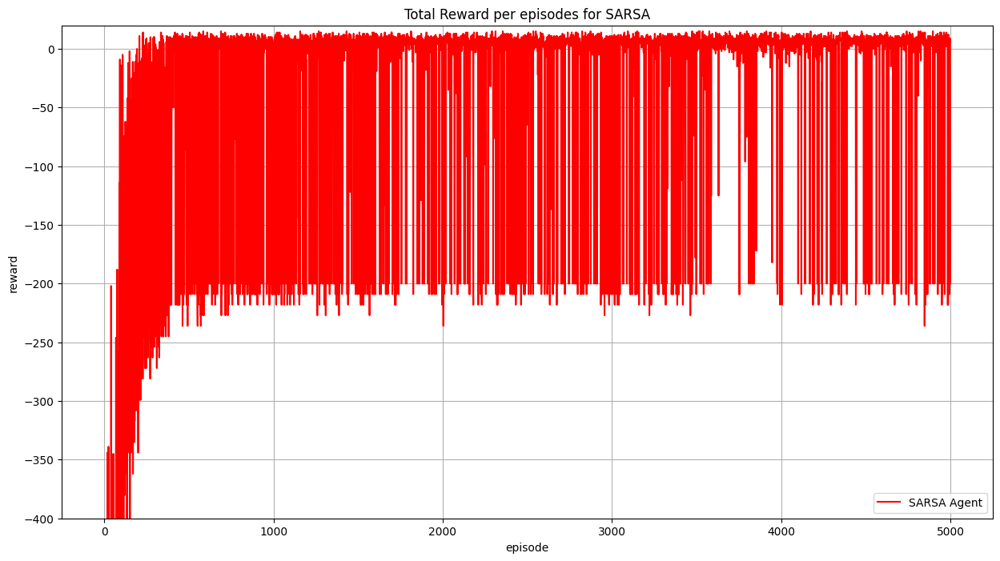

Number of times passenger was dropped off: 4169.0
Max reward: 15.0
Min reward: -857.0
Avg reward: -42.7082
Testing...
Learning done!


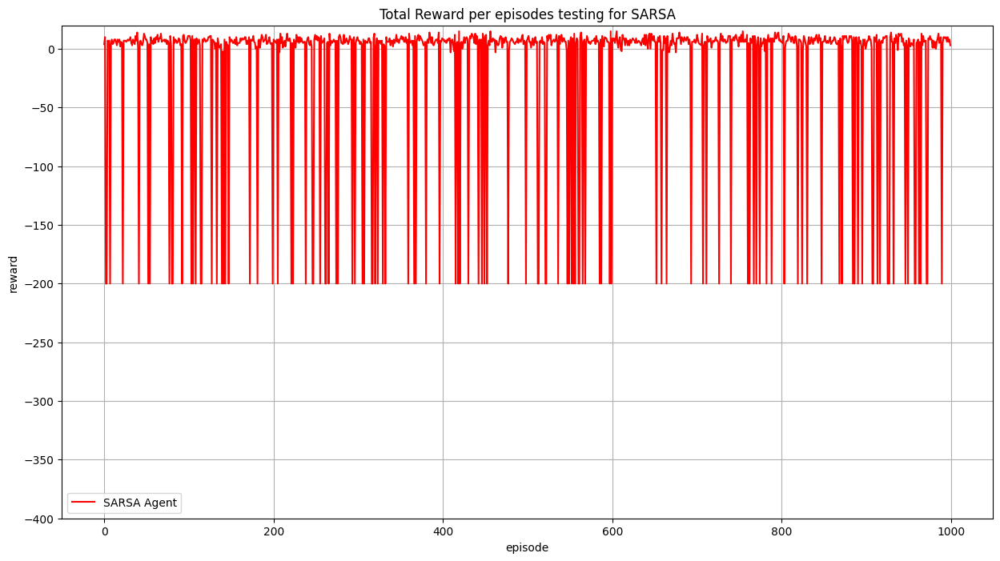

...... running with alpha = 0.3 and gamma = 0.7 ......
Training...


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


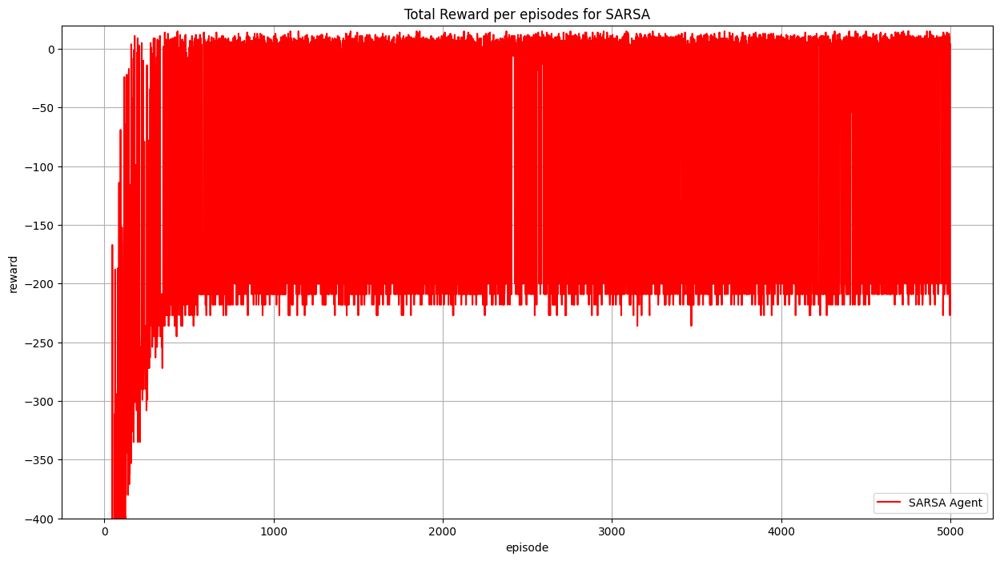

Number of times passenger was dropped off: 2698.0
Max reward: 15.0
Min reward: -902.0
Avg reward: -105.847
Testing...
Learning done!


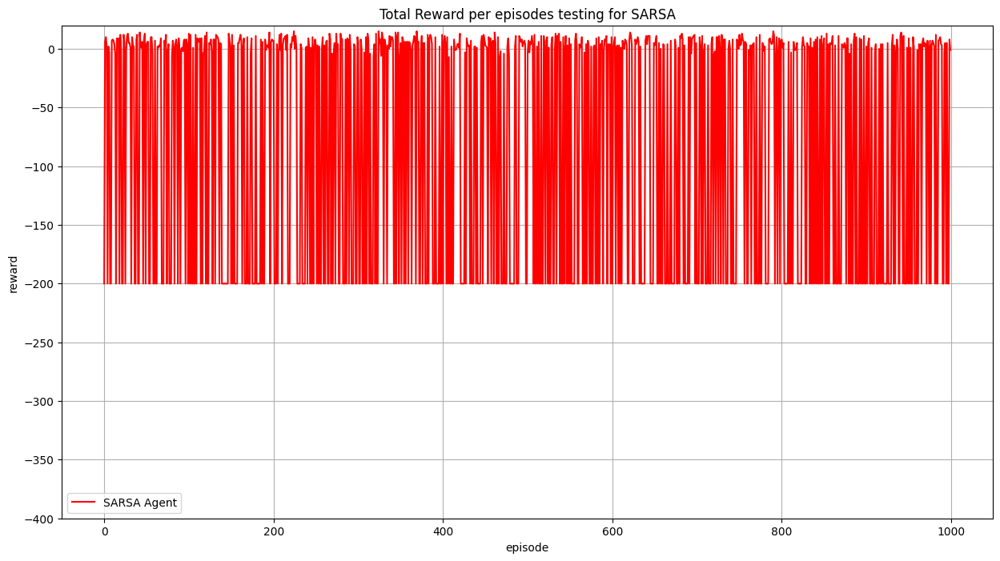

In [13]:
alpha = 0.1
gamma = 0.8

SARSA_rewards = pd.DataFrame()
performance = {"alpha":[],"gamma":[],"avg_reward":[]}

for i in [0.1,0.2,0.3]:
    print(f"alpha = {i}")
    for j in [1,0.9,0.8,0.7]:
        print(f"...... running with alpha = {i} and gamma = {j} ......")
        alpha = i
        gamma = j
        sarsa_agent = SarsaAgent(max_episodes, 
                max_steps, 
                test_episodes, 
                alpha = i, 
                gamma = j, 
                epsilon = 1, 
                decay_rate = 0.01,
                optimistic = False
                )

        sarsa_agent.run()
        sarsa_agent.test()
        
        name = "a"+str(i)+"_g"+str(j)
        SARSA_rewards[name] = pd.Series(sarsa_agent.reward_list)
        sarsa_agent.export_csv(f"sarsa_a{i}_g{j}")
        performance["alpha"].append(i)
        performance["gamma"].append(j)
        performance["avg_reward"].append((sum(sarsa_agent.reward_list)/sarsa_agent.max_episodes))
        
        
SARSA_rewards.to_csv("sarsa.csv")




In [14]:
performance=pd.DataFrame.from_dict(performance)

performance.to_csv("sarsa_performance.csv",index = False)

In [15]:
performance

,alpha,gamma,avg_reward
0,0.1,1.0,-21.3824
1,0.1,0.9,-21.5726
2,0.1,0.8,-23.3498
3,0.1,0.7,-29.4394
4,0.2,1.0,-13.2850
5,0.2,0.9,-14.5262
6,0.2,0.8,-22.1372
7,0.2,0.7,-89.3634
8,0.3,1.0,-12.1188
9,0.3,0.9,-14.1990


best algorithm : alpha = 0.3 and gamma = 1.0

## Testing different alphas and gammas for Q Learning Agent

alpha = 0.1
...... running with alpha = 0.1 and gamma = 1 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


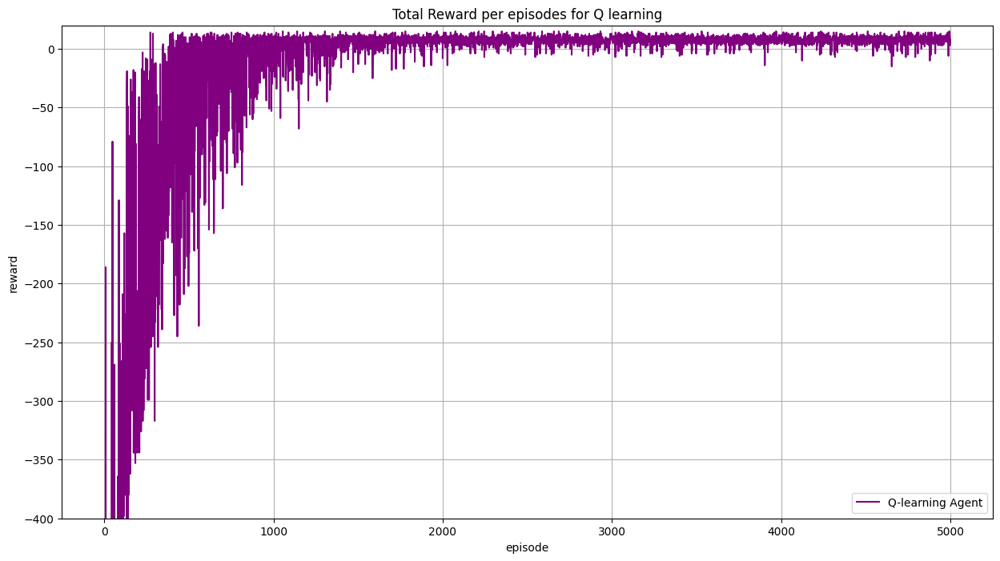

Number of times passenger was dropped off: 4816.0
Max reward: 15.0
Min reward: -821.0
Avg reward: -19.9418


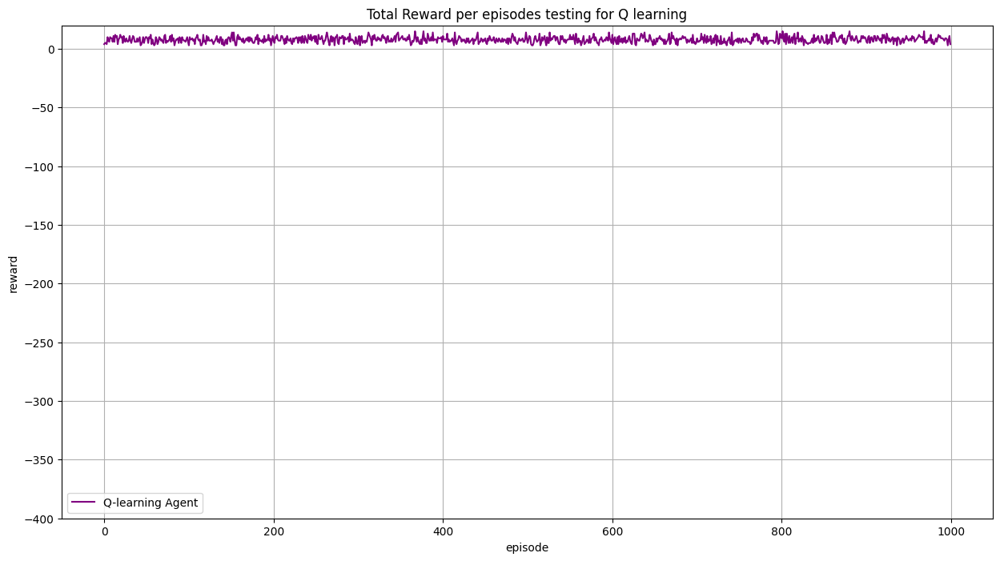

...... running with alpha = 0.1 and gamma = 0.9 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


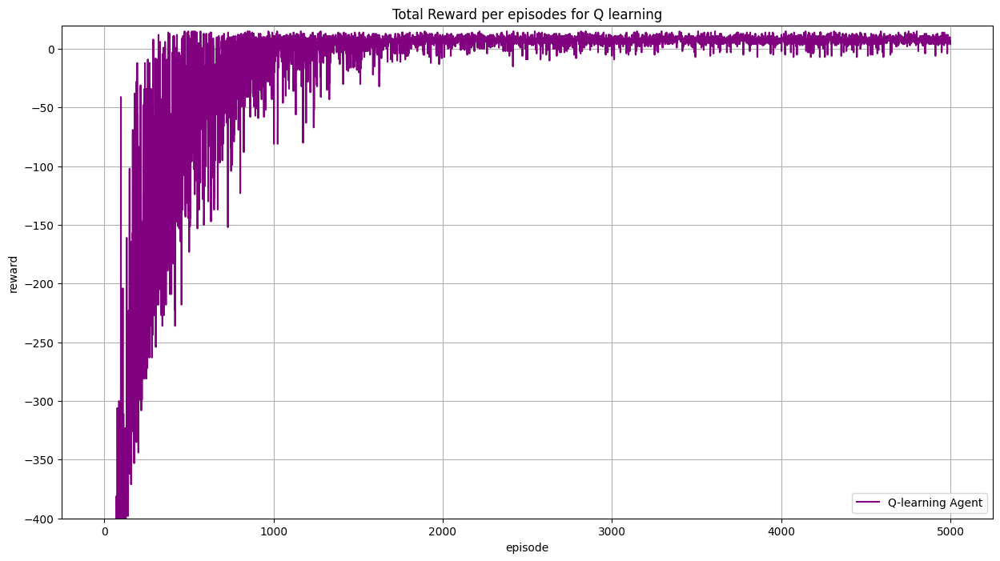

Number of times passenger was dropped off: 4795.0
Max reward: 15.0
Min reward: -929.0
Avg reward: -22.1812


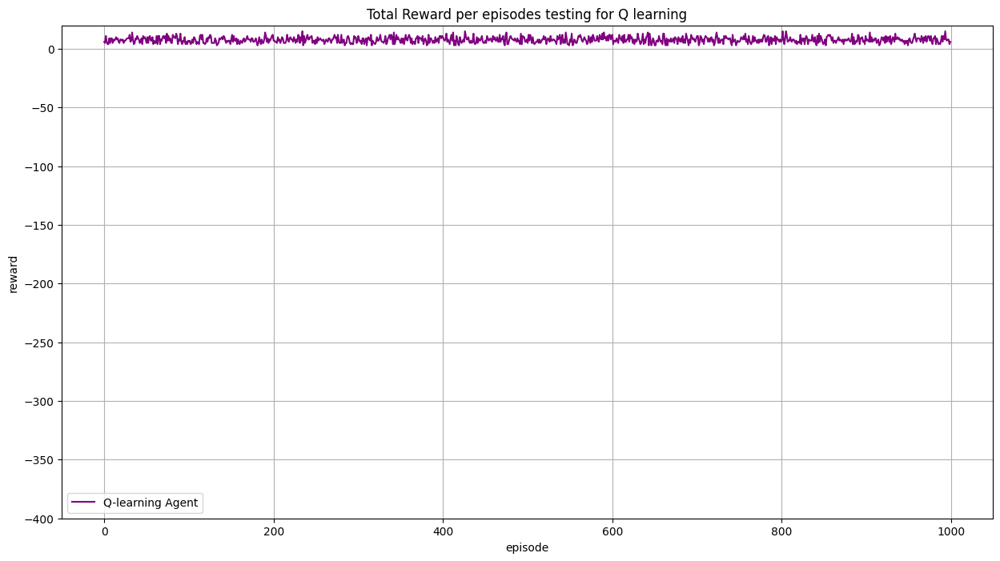

...... running with alpha = 0.1 and gamma = 0.8 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


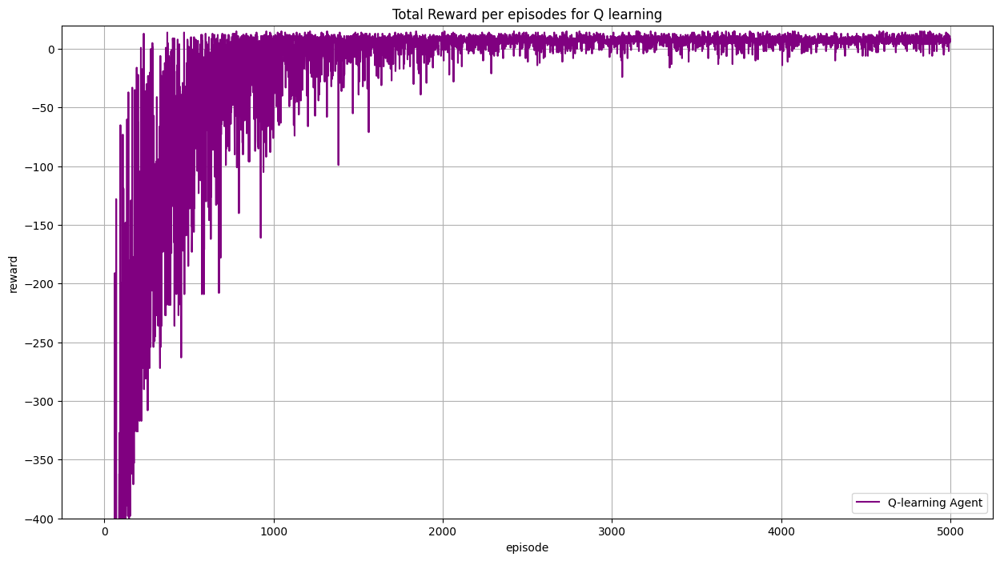

Number of times passenger was dropped off: 4778.0
Max reward: 15.0
Min reward: -848.0
Avg reward: -24.239


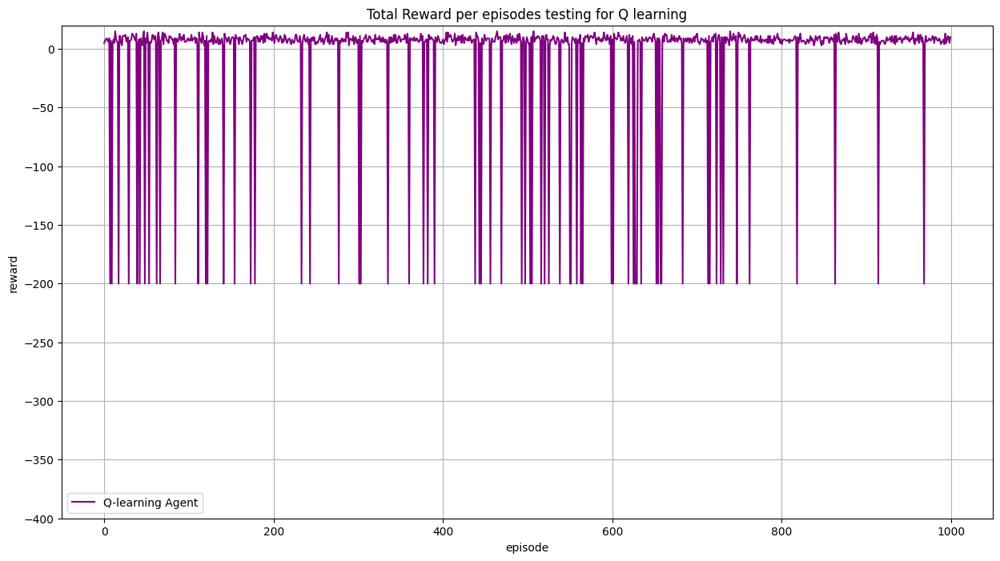

...... running with alpha = 0.1 and gamma = 0.7 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


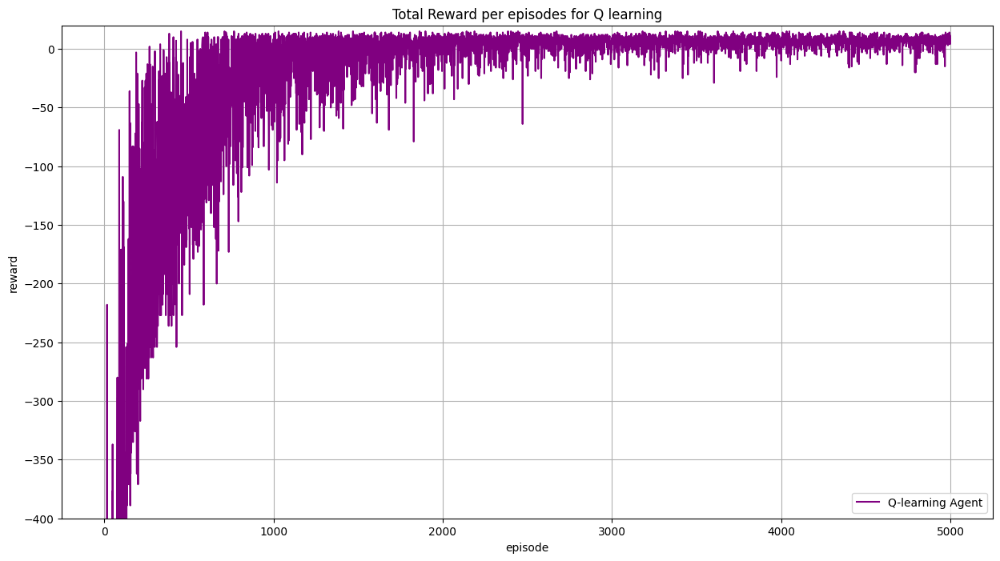

Number of times passenger was dropped off: 4759.0
Max reward: 15.0
Min reward: -830.0
Avg reward: -27.2416


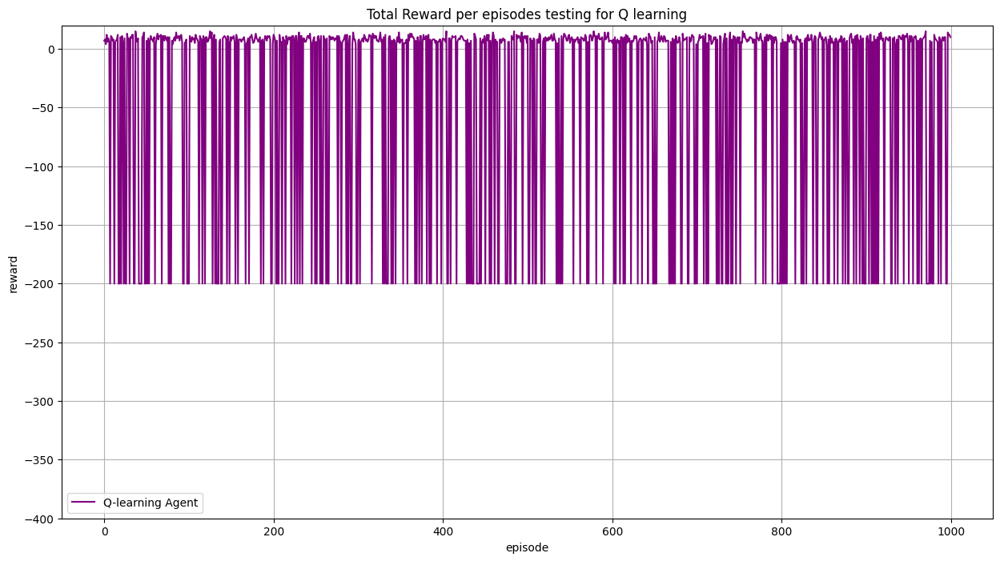

alpha = 0.2
...... running with alpha = 0.2 and gamma = 1 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


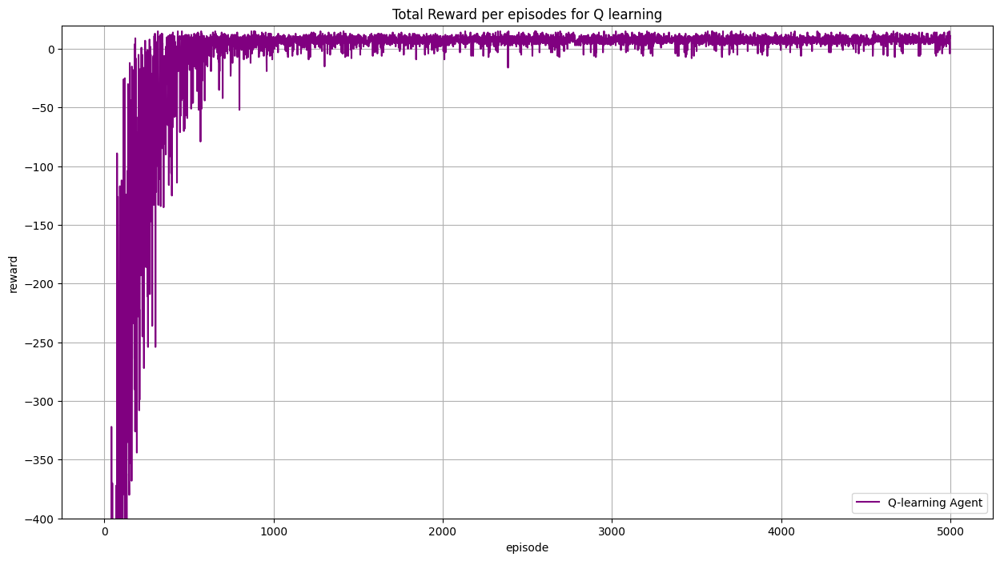

Number of times passenger was dropped off: 4874.0
Max reward: 15.0
Min reward: -866.0
Avg reward: -12.6142


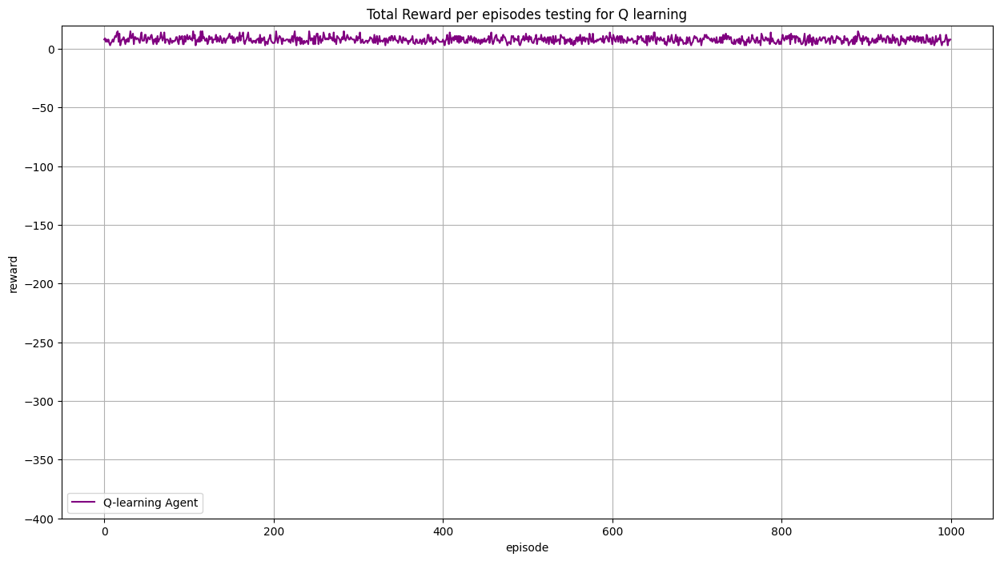

...... running with alpha = 0.2 and gamma = 0.9 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


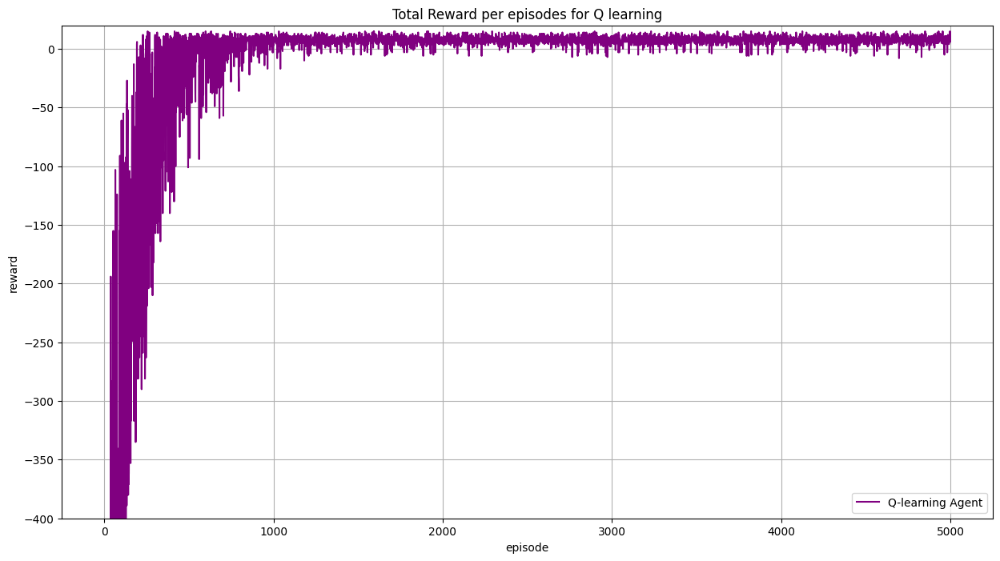

Number of times passenger was dropped off: 4867.0
Max reward: 15.0
Min reward: -920.0
Avg reward: -13.1088


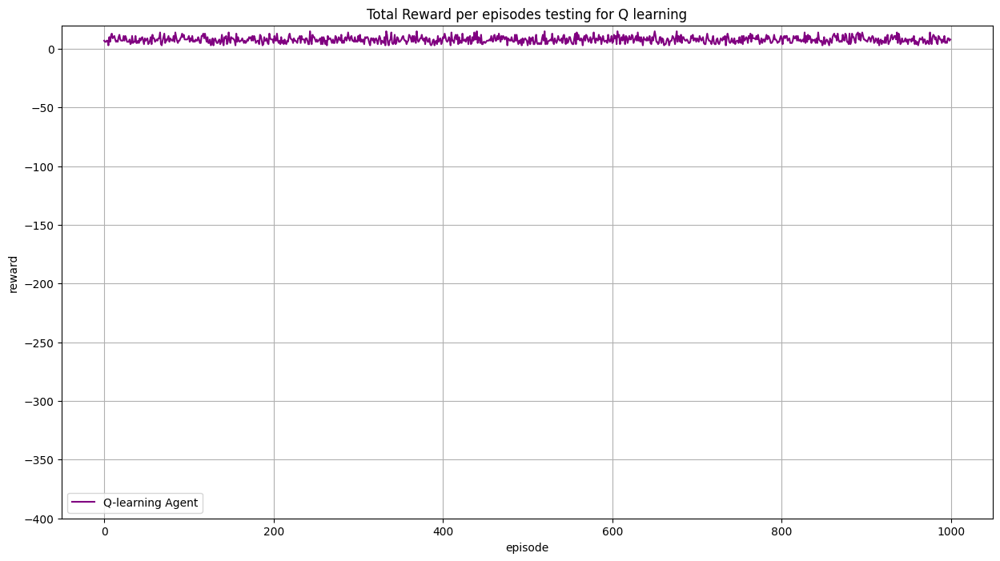

...... running with alpha = 0.2 and gamma = 0.8 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


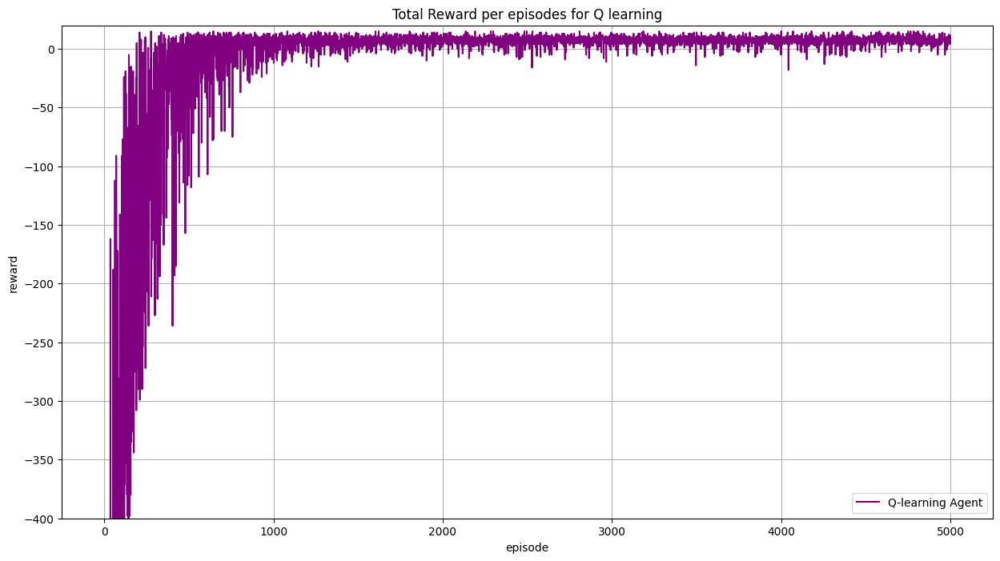

Number of times passenger was dropped off: 4876.0
Max reward: 15.0
Min reward: -866.0
Avg reward: -13.611


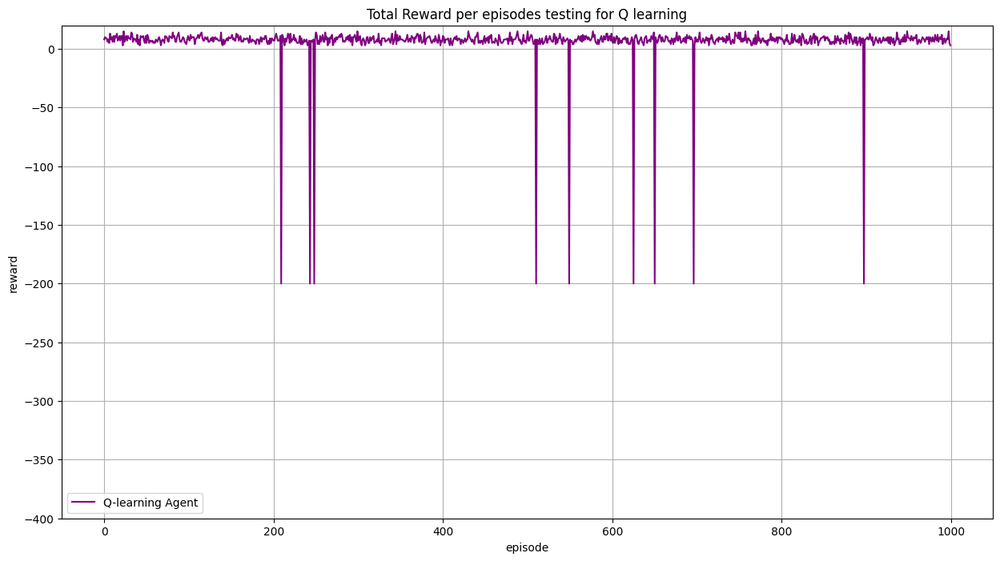

...... running with alpha = 0.2 and gamma = 0.7 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


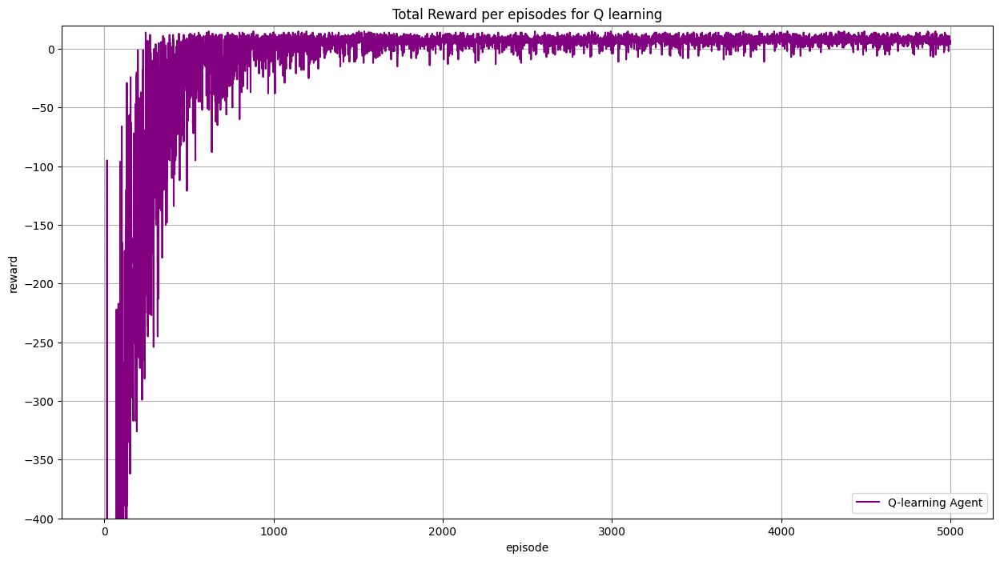

Number of times passenger was dropped off: 4861.0
Max reward: 15.0
Min reward: -866.0
Avg reward: -15.636


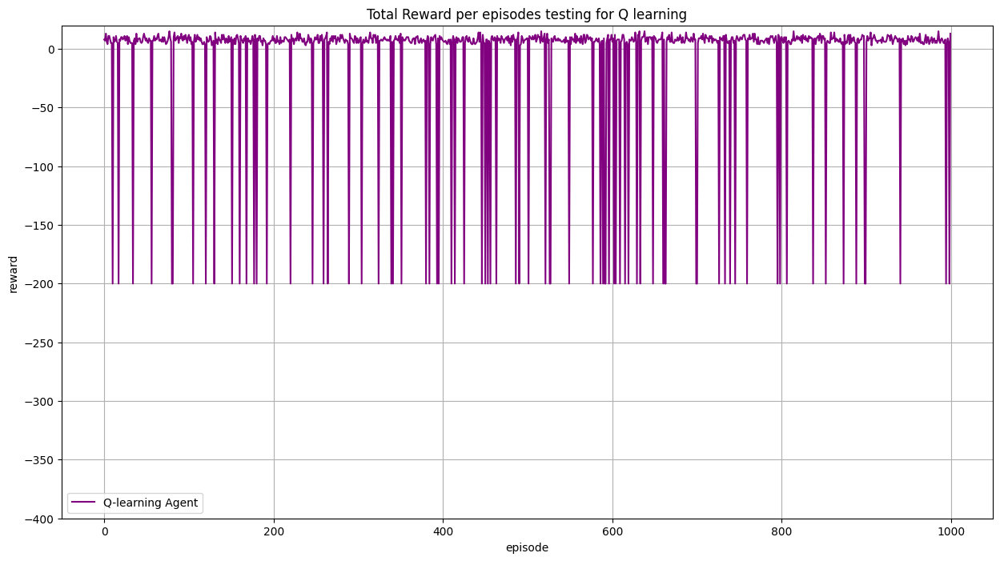

alpha = 0.3
...... running with alpha = 0.3 and gamma = 1 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


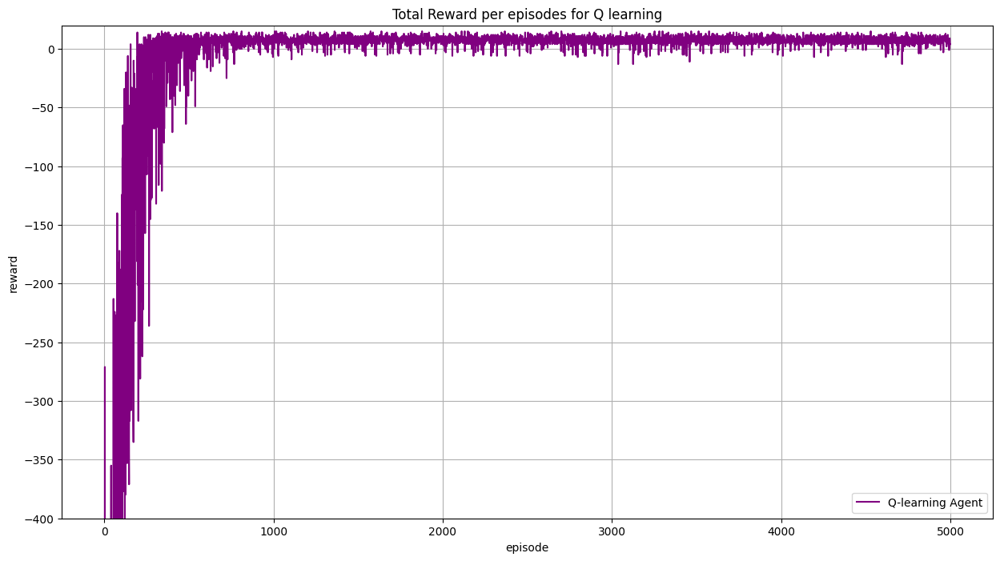

Number of times passenger was dropped off: 4898.0
Max reward: 15.0
Min reward: -884.0
Avg reward: -9.5786


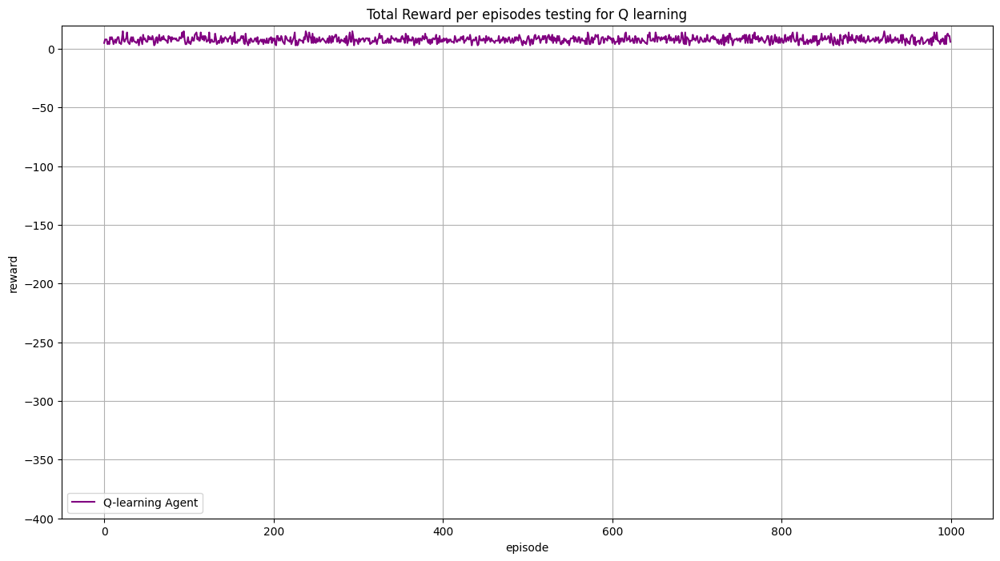

...... running with alpha = 0.3 and gamma = 0.9 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


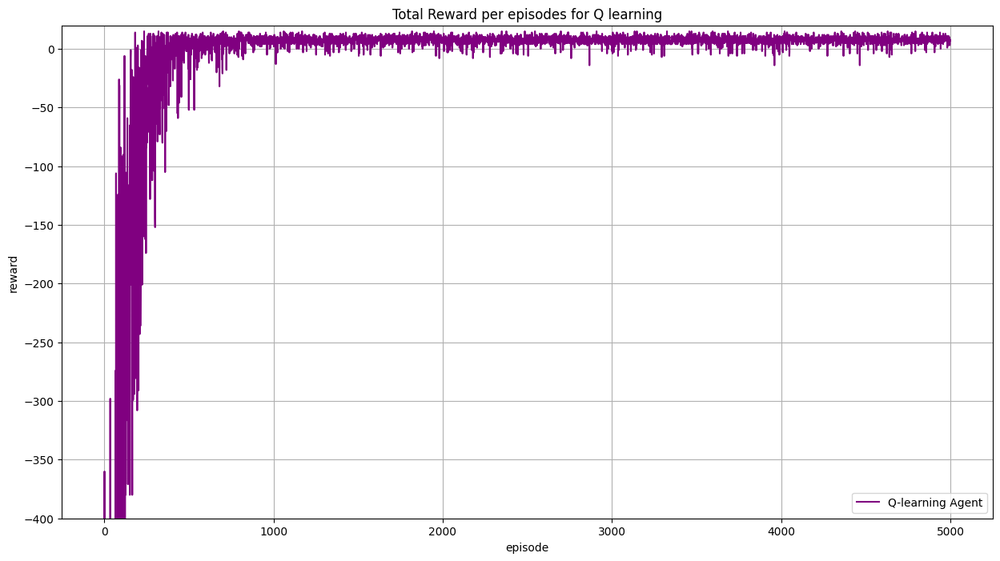

Number of times passenger was dropped off: 4895.0
Max reward: 15.0
Min reward: -875.0
Avg reward: -9.6612


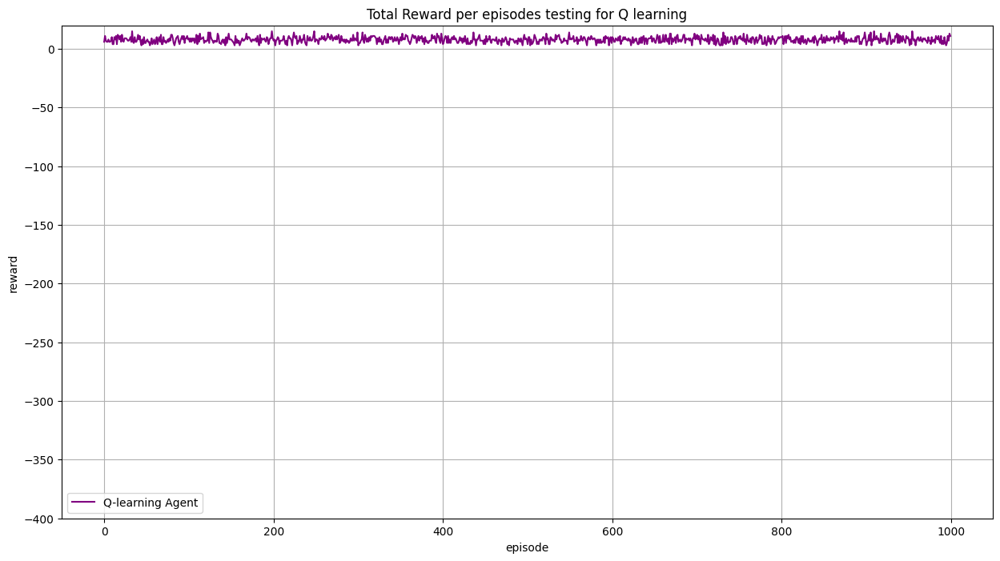

...... running with alpha = 0.3 and gamma = 0.8 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


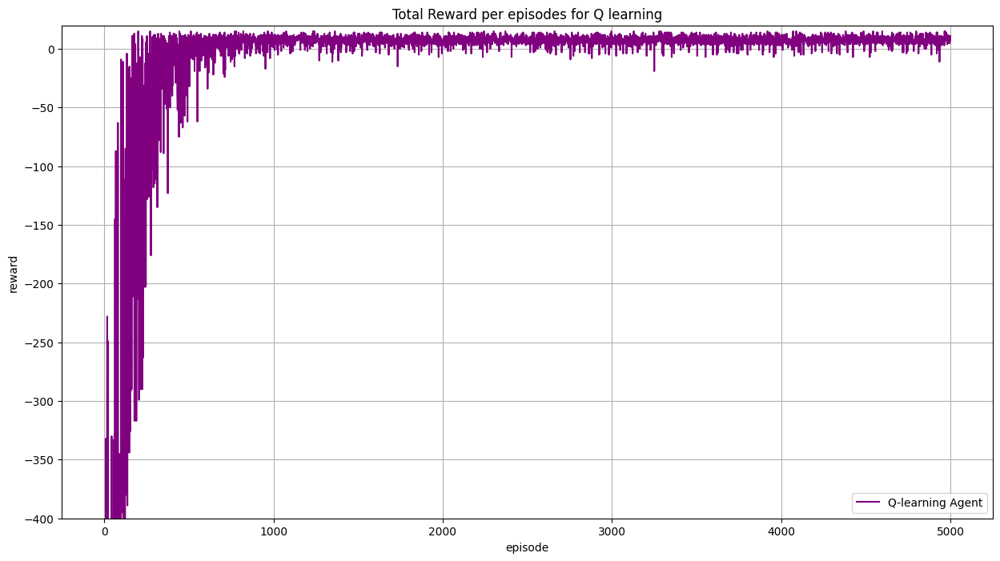

Number of times passenger was dropped off: 4899.0
Max reward: 15.0
Min reward: -884.0
Avg reward: -10.1542


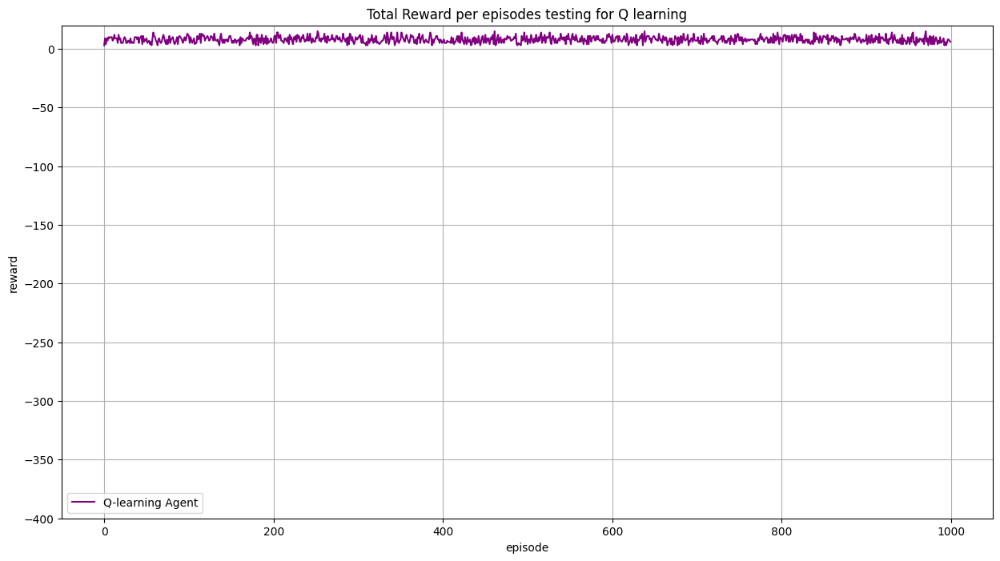

...... running with alpha = 0.3 and gamma = 0.7 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


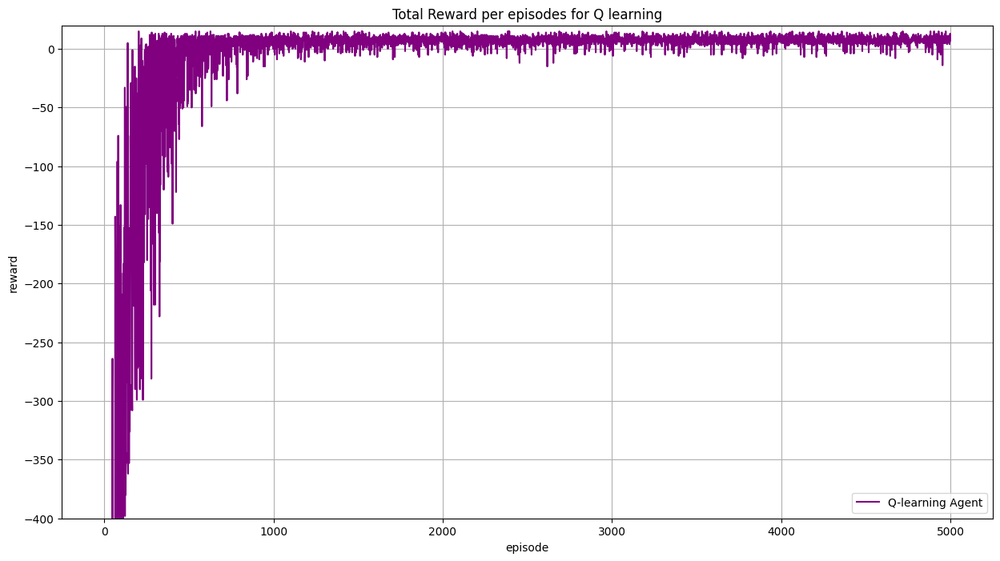

Number of times passenger was dropped off: 4881.0
Max reward: 15.0
Min reward: -902.0
Avg reward: -11.6044


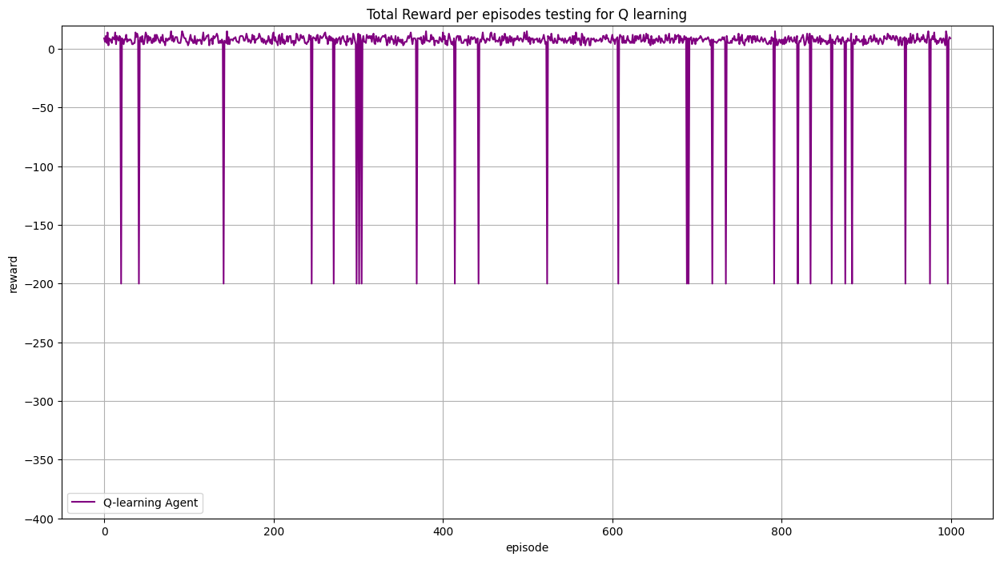

In [16]:
alpha = 0.1
gamma = 0.8

Q_rewards = pd.DataFrame()
Qperformance = {"alpha":[],"gamma":[],"avg_reward":[]}


for i in [0.1,0.2,0.3]:
    print(f"alpha = {i}")
    for j in [1,0.9,0.8,0.7]:
        print(f"...... running with alpha = {i} and gamma = {j} ......")
        alpha = i
        gamma = j
        Q_agent = Q_Agent(max_episodes, 
                max_steps, 
                test_episodes, 
                alpha = i, 
                gamma = j, 
                epsilon = 1.0, 
                decay_rate = 0.01,
                optimistic = False)
        name = "a"+str(i)+"_g"+str(j)
        Q_agent.run()
        Q_agent.test()
        Q_rewards[name] = pd.Series(Q_agent.reward_arr)

        
        Q_agent.export_csv(f"QAgent_a{i}_g{j}")
        Qperformance["alpha"].append(i)
        Qperformance["gamma"].append(j)
        Qperformance["avg_reward"].append((sum(Q_agent.reward_arr)/Q_agent.max_episodes))
Q_rewards.to_csv("Qlearning.csv")


In [17]:
Qperformance=pd.DataFrame.from_dict(Qperformance)

Qperformance.to_csv("Q_performance.csv",index = False)

In [18]:
Qperformance

,alpha,gamma,avg_reward
0,0.1,1.0,-19.9418
1,0.1,0.9,-22.1812
2,0.1,0.8,-24.2390
3,0.1,0.7,-27.2416
4,0.2,1.0,-12.6142
5,0.2,0.9,-13.1088
6,0.2,0.8,-13.6110
7,0.2,0.7,-15.6360
8,0.3,1.0,-9.5786
9,0.3,0.9,-9.6612


alpha = 0.1
...... running with alpha = 0.1 and gamma = 1 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


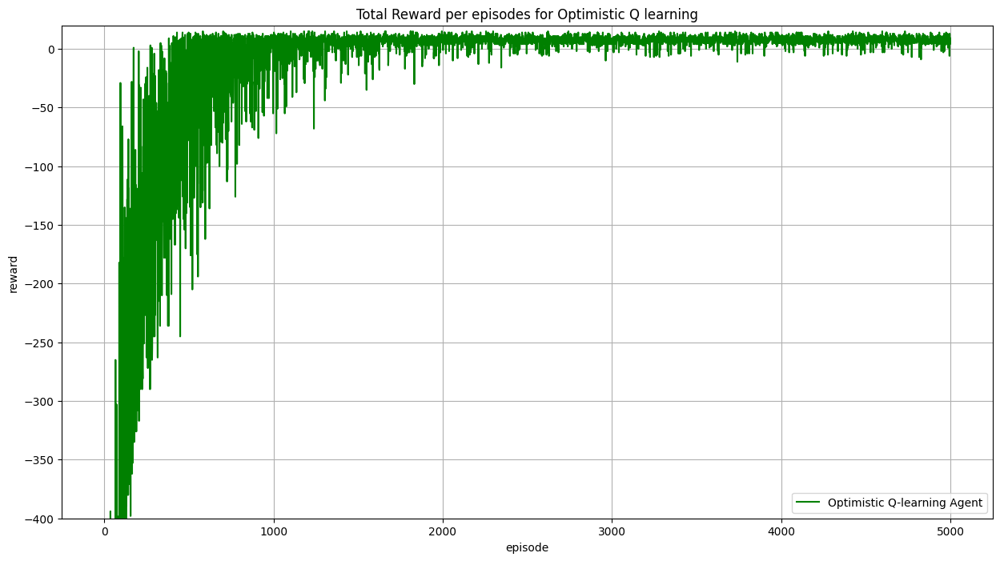

Number of times passenger was dropped off: 4819.0
Max reward: 15.0
Min reward: -929.0
Avg reward: -19.7972


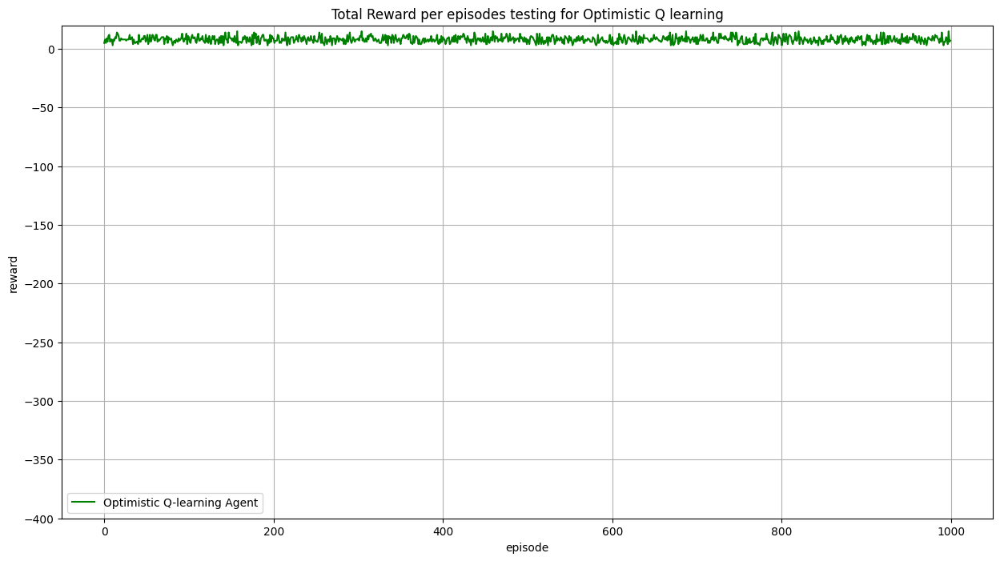

...... running with alpha = 0.1 and gamma = 0.9 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


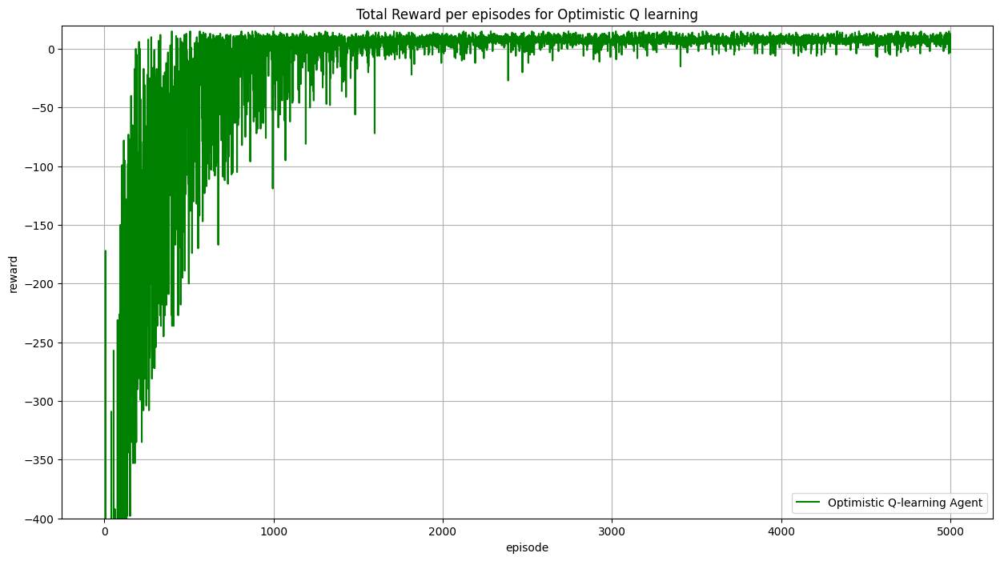

Number of times passenger was dropped off: 4810.0
Max reward: 15.0
Min reward: -929.0
Avg reward: -21.1208


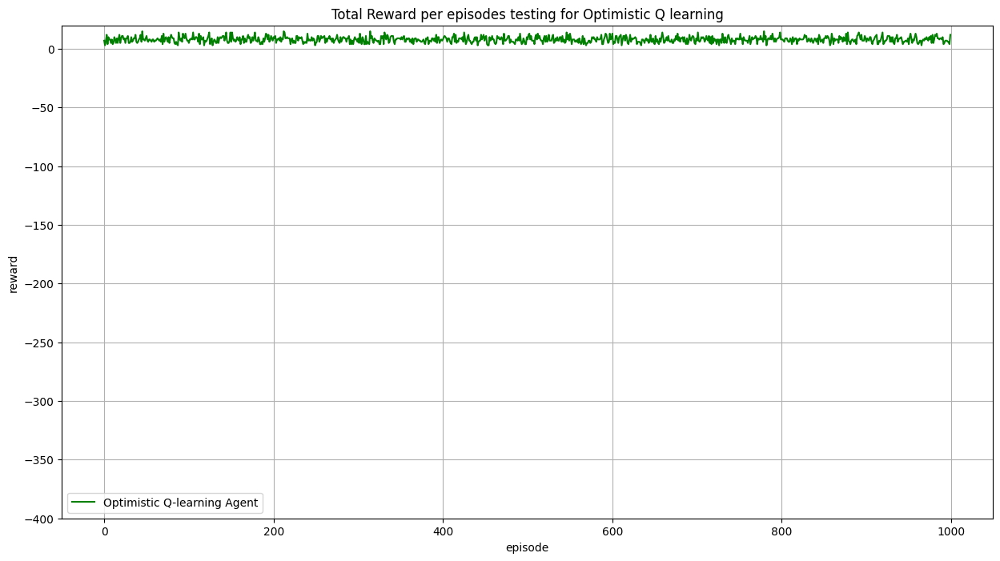

...... running with alpha = 0.1 and gamma = 0.8 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


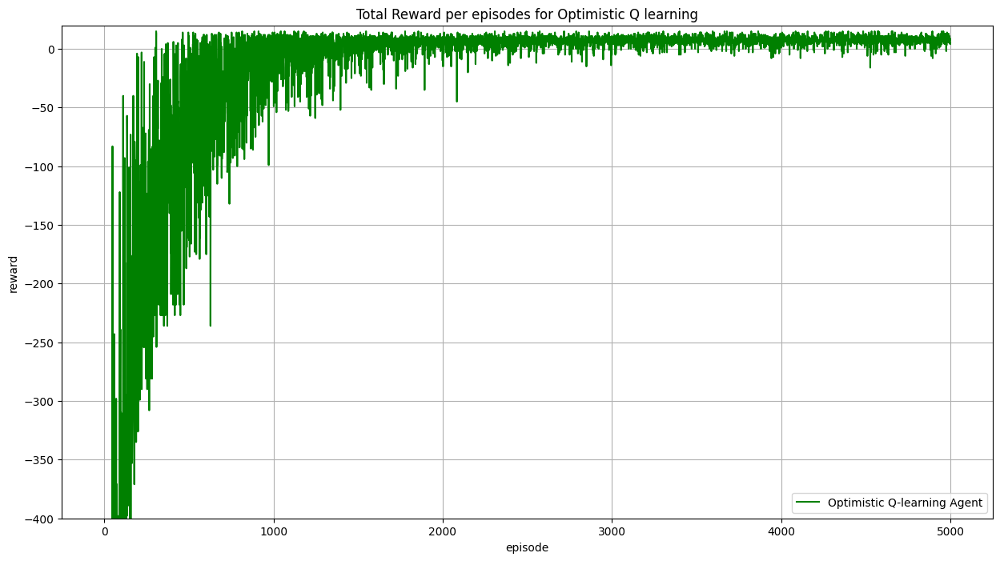

Number of times passenger was dropped off: 4783.0
Max reward: 15.0
Min reward: -866.0
Avg reward: -23.1482


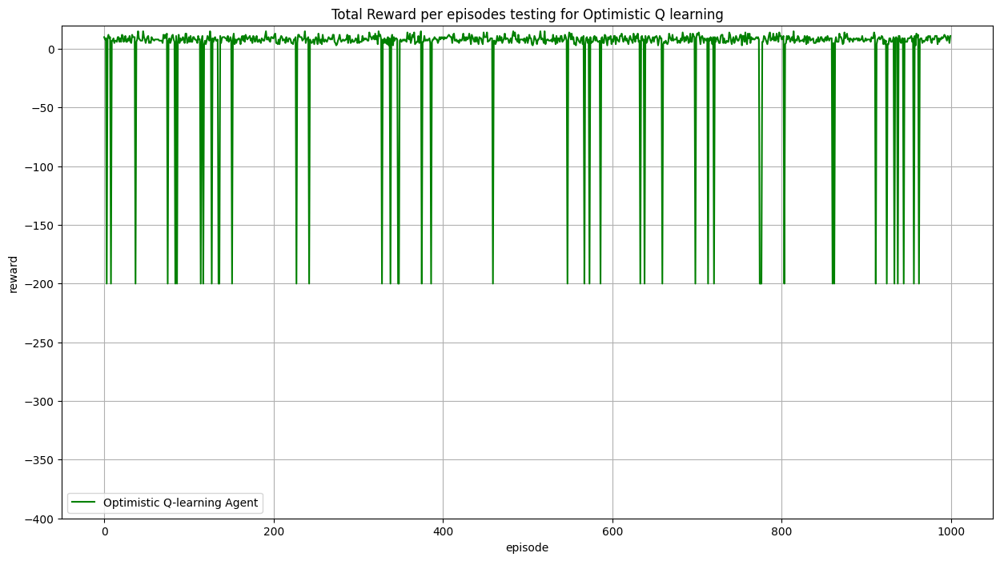

...... running with alpha = 0.1 and gamma = 0.7 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


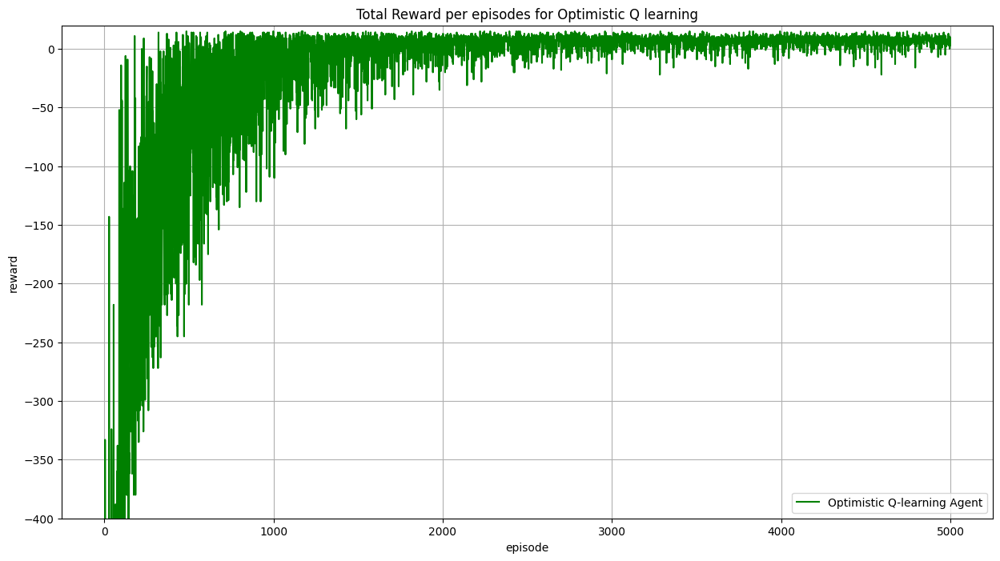

Number of times passenger was dropped off: 4773.0
Max reward: 15.0
Min reward: -893.0
Avg reward: -25.6102


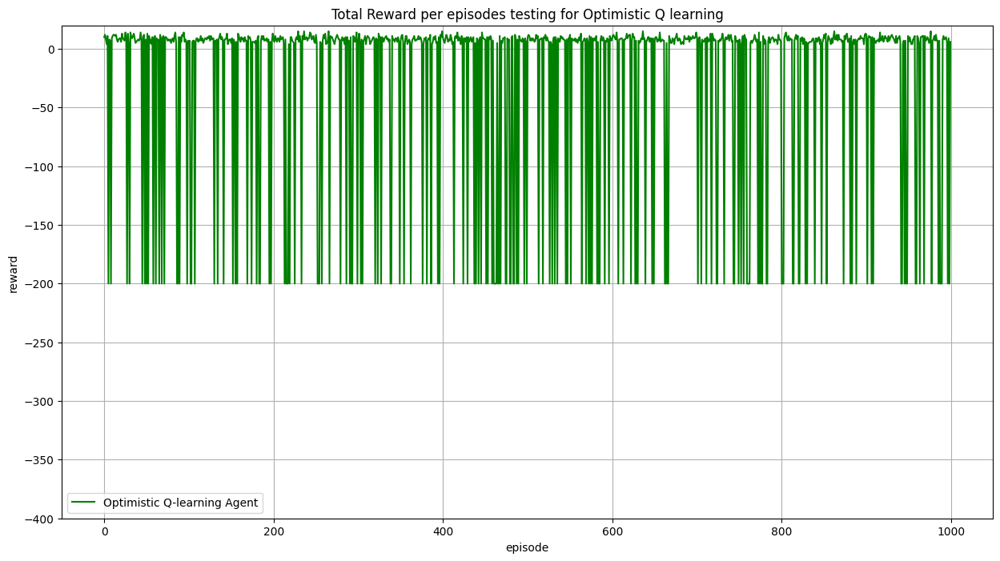

alpha = 0.2
...... running with alpha = 0.2 and gamma = 1 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


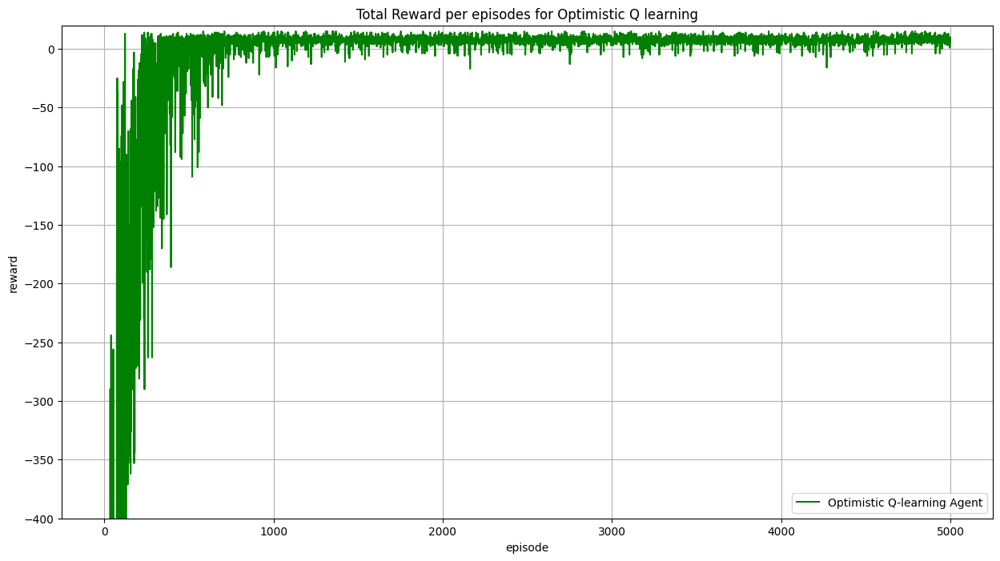

Number of times passenger was dropped off: 4884.0
Max reward: 15.0
Min reward: -821.0
Avg reward: -11.9354


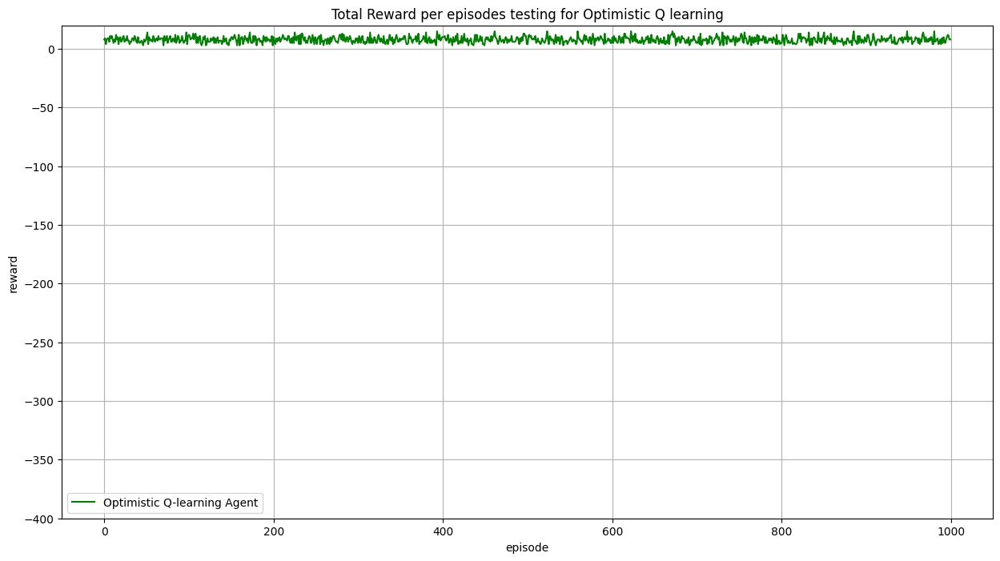

...... running with alpha = 0.2 and gamma = 0.9 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


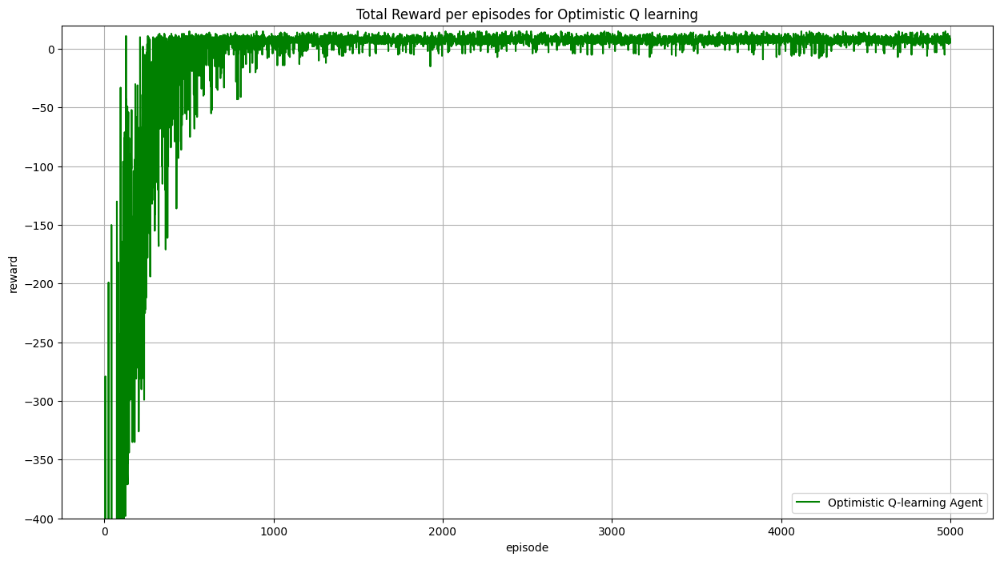

Number of times passenger was dropped off: 4877.0
Max reward: 15.0
Min reward: -830.0
Avg reward: -12.5634


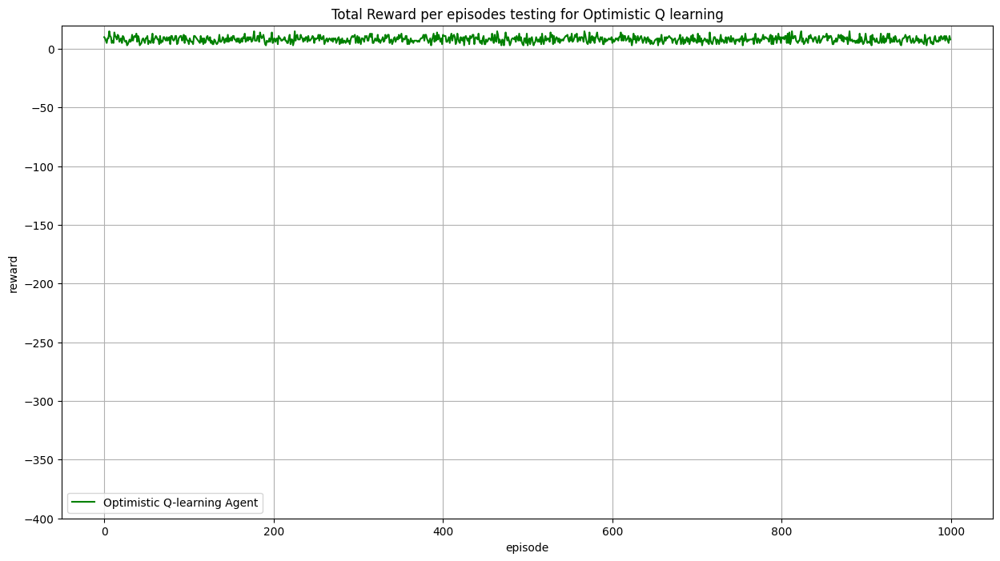

...... running with alpha = 0.2 and gamma = 0.8 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


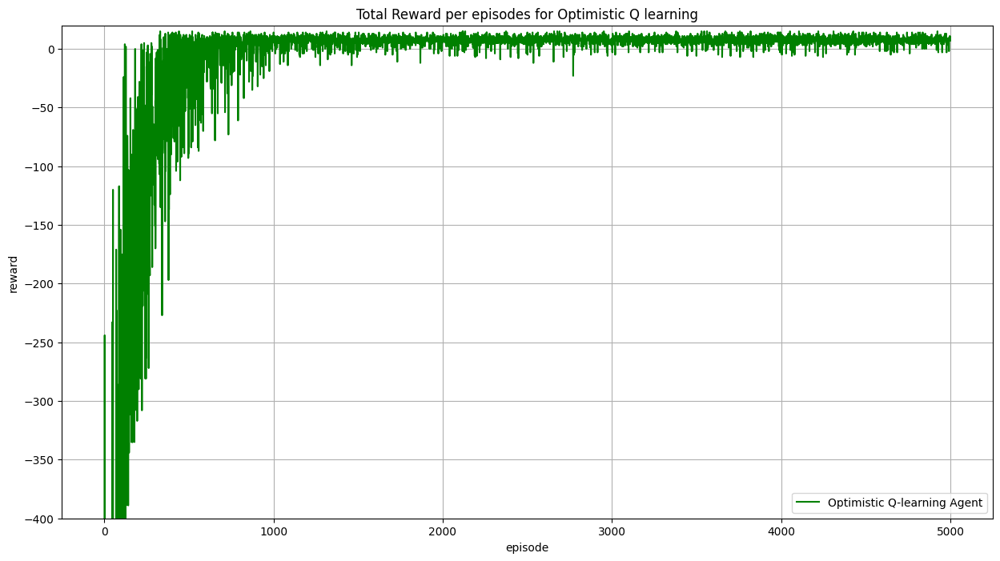

Number of times passenger was dropped off: 4861.0
Max reward: 15.0
Min reward: -947.0
Avg reward: -14.2792


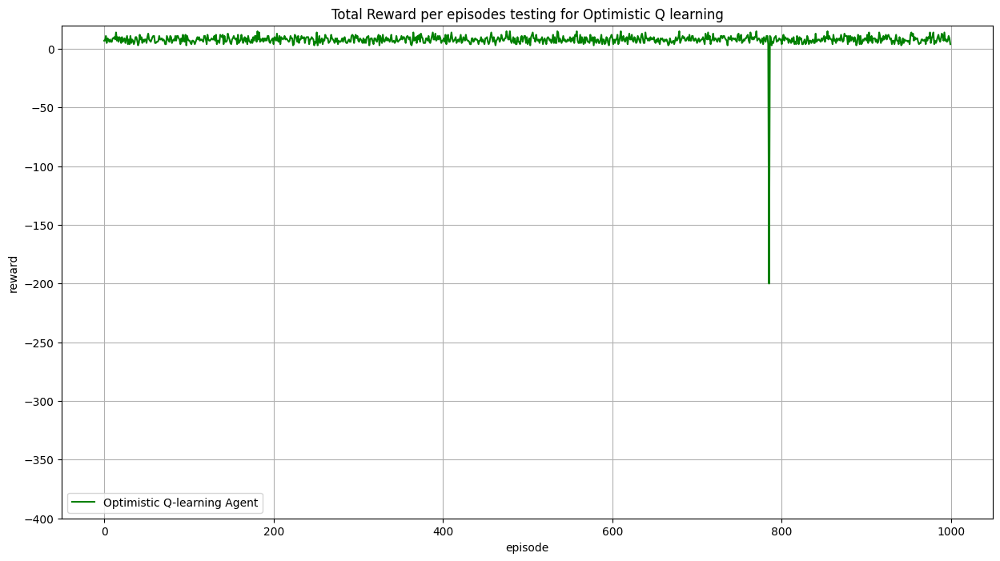

...... running with alpha = 0.2 and gamma = 0.7 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


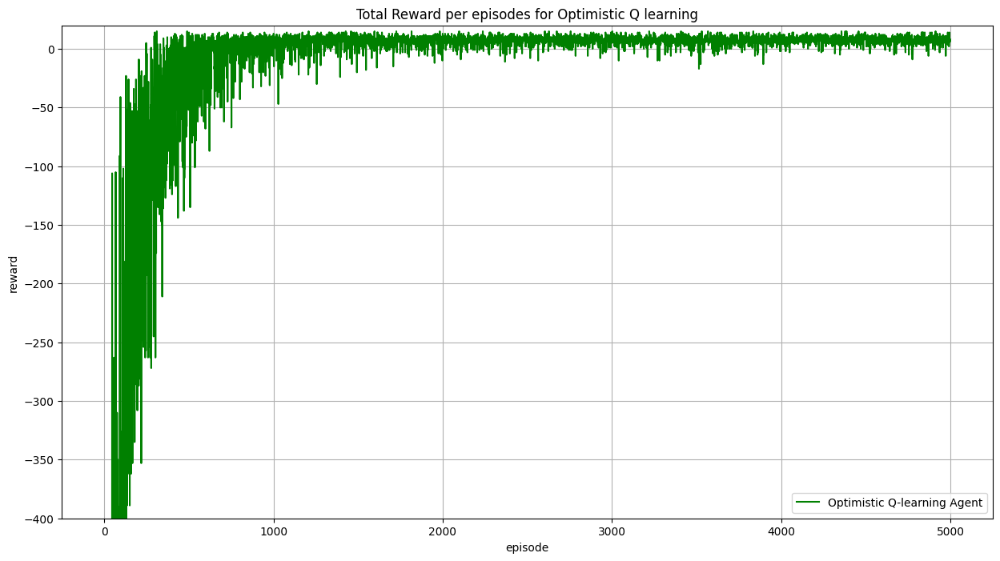

Number of times passenger was dropped off: 4856.0
Max reward: 15.0
Min reward: -938.0
Avg reward: -15.1812


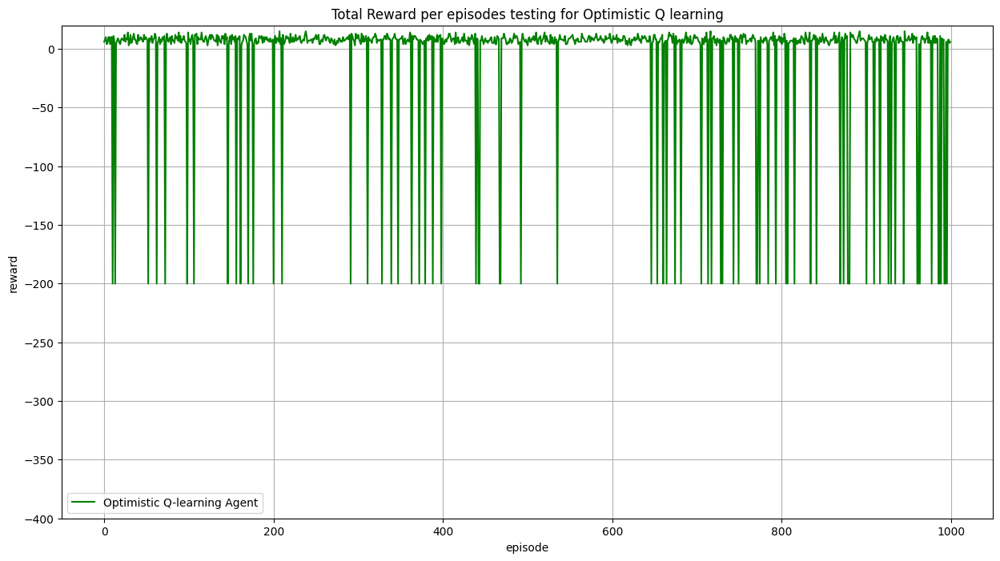

alpha = 0.3
...... running with alpha = 0.3 and gamma = 1 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


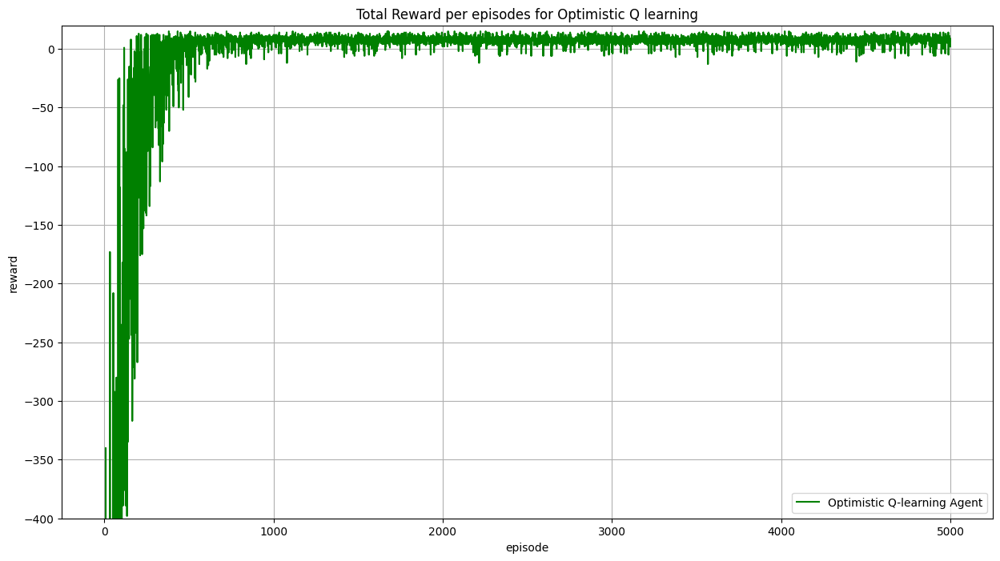

Number of times passenger was dropped off: 4908.0
Max reward: 15.0
Min reward: -839.0
Avg reward: -8.9934


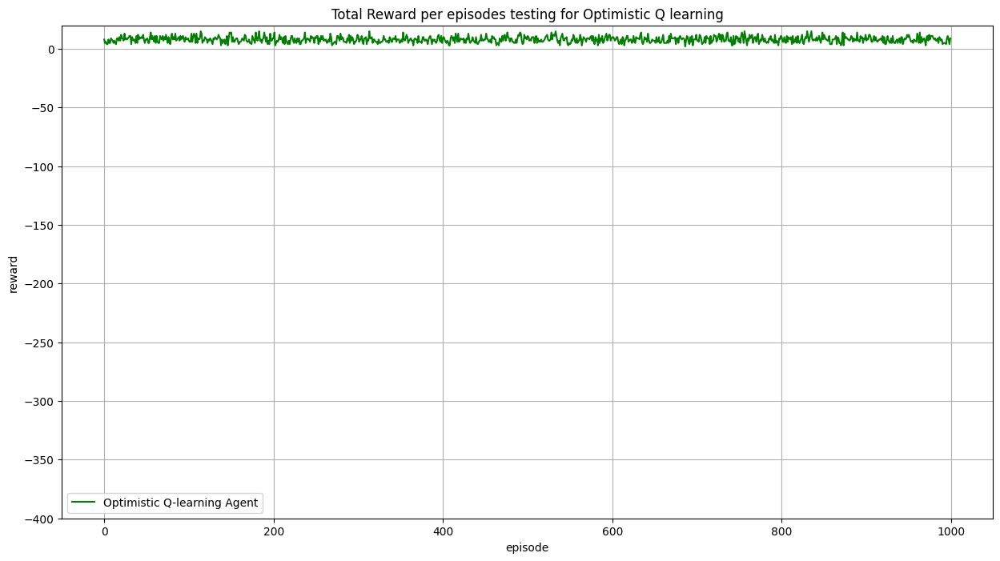

...... running with alpha = 0.3 and gamma = 0.9 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


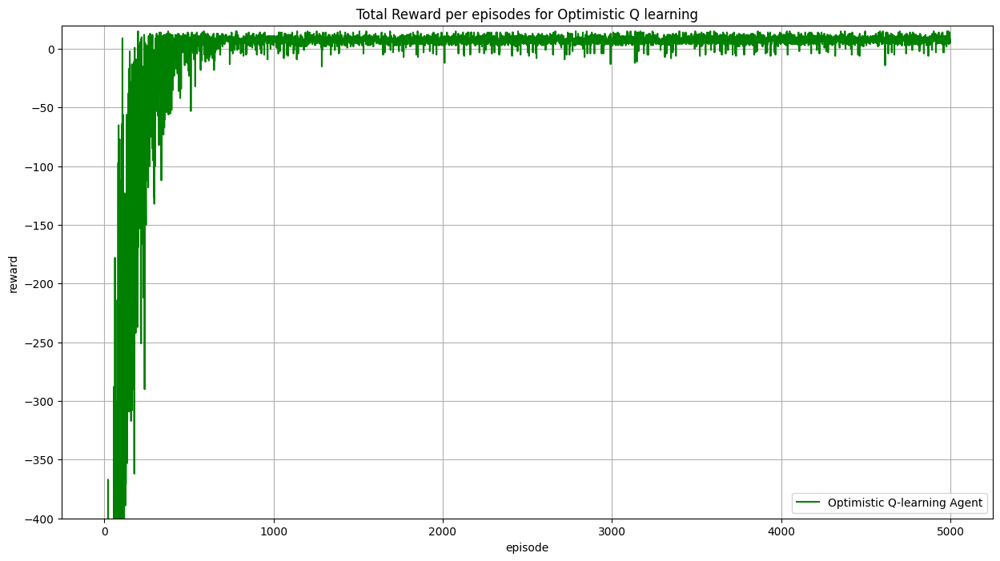

Number of times passenger was dropped off: 4904.0
Max reward: 15.0
Min reward: -929.0
Avg reward: -9.7574


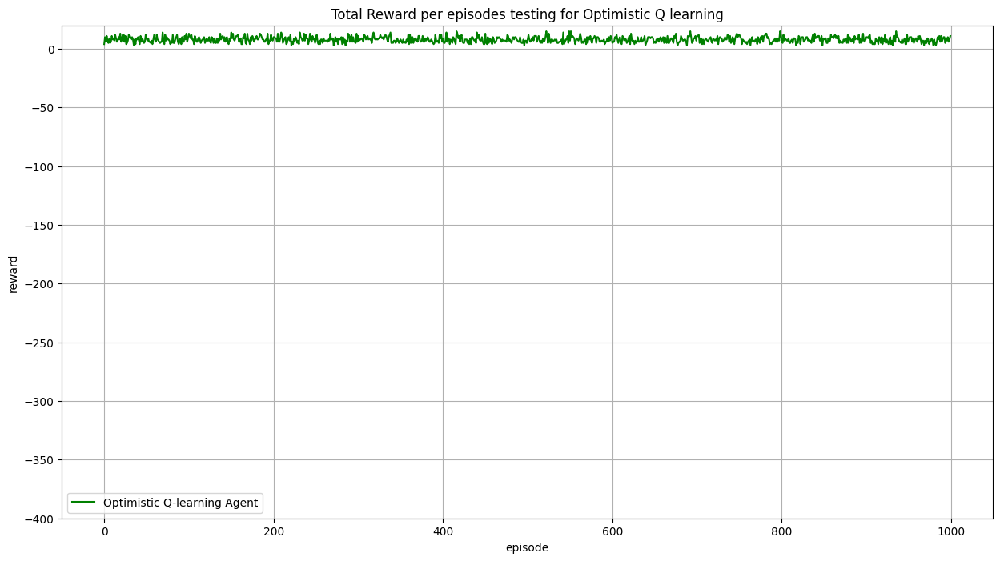

...... running with alpha = 0.3 and gamma = 0.8 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


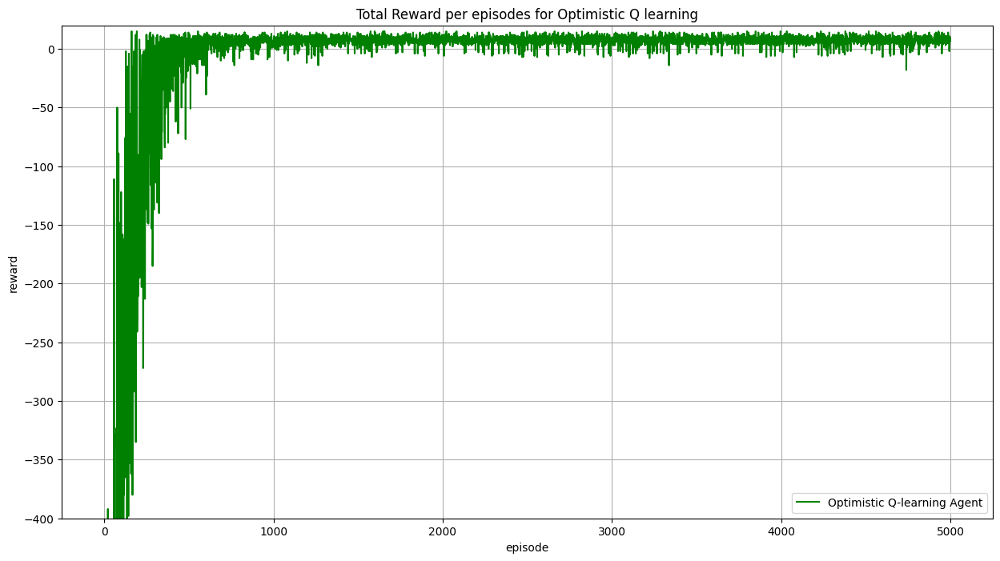

Number of times passenger was dropped off: 4893.0
Max reward: 15.0
Min reward: -884.0
Avg reward: -10.7178


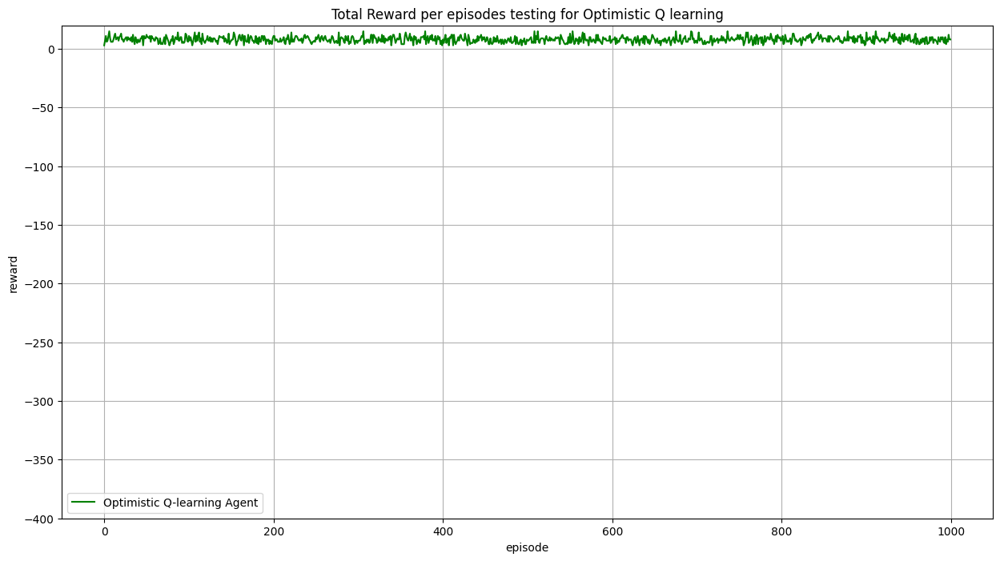

...... running with alpha = 0.3 and gamma = 0.7 ......
Training....


/Users/zeidsmac/miniforge3/envs/cartpole/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Learning done!


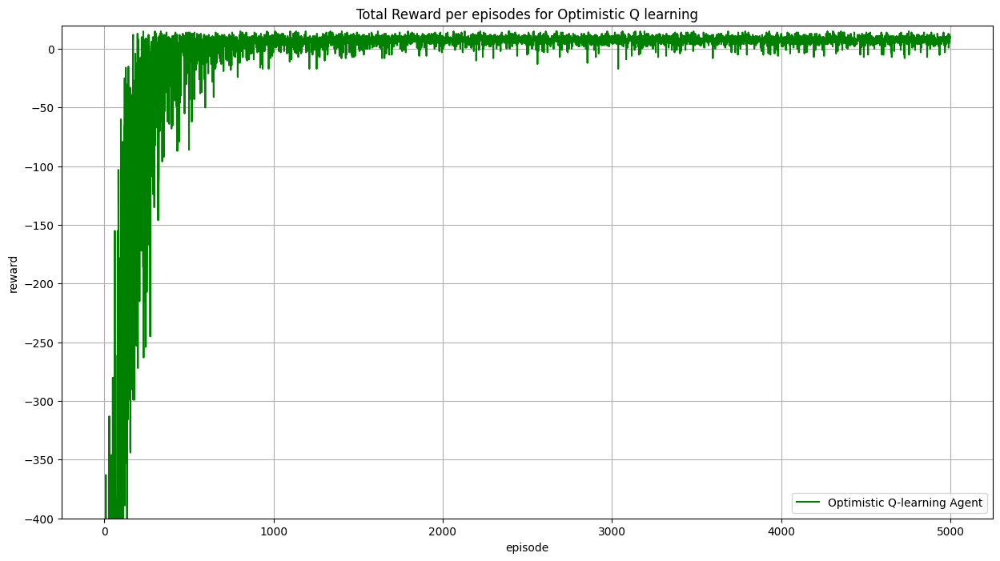

Number of times passenger was dropped off: 4897.0
Max reward: 15.0
Min reward: -911.0
Avg reward: -10.604


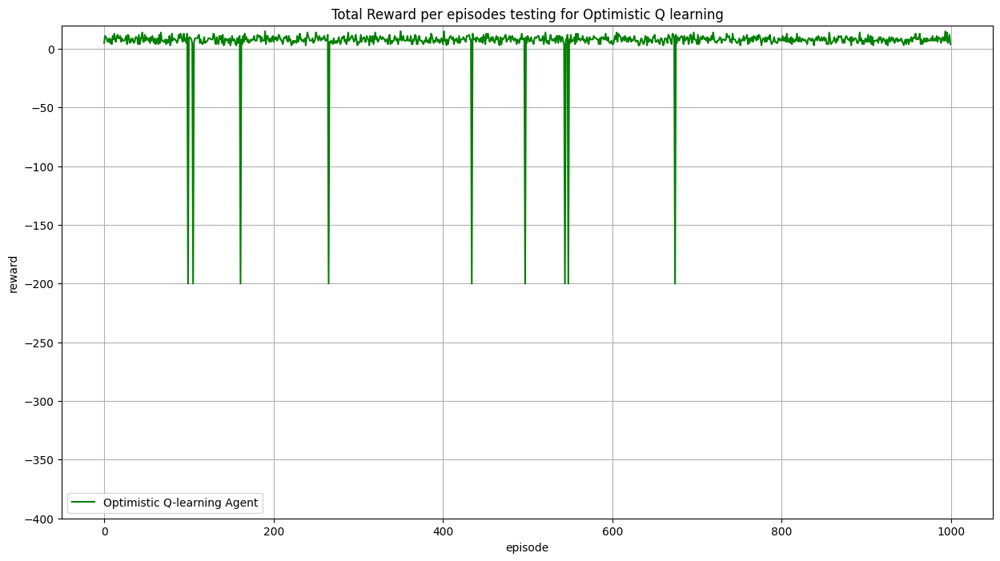

,a0.1_g1,a0.1_g0.9,a0.1_g0.8,a0.1_g0.7,a0.2_g1,a0.2_g0.9,a0.2_g0.8,a0.2_g0.7,a0.3_g1,a0.3_g0.9,a0.3_g0.8,a0.3_g0.7
0,-794.0,-785.0,-848.0,-893.0,-821.0,-776.0,-785.0,-866.0,-740.0,-848.0,-803.0,-776.0
1,-929.0,-794.0,-794.0,-803.0,-803.0,-749.0,-830.0,-758.0,-839.0,-668.0,-758.0,-830.0
2,-803.0,-929.0,-803.0,-866.0,-785.0,-740.0,-821.0,-794.0,-794.0,-929.0,-803.0,-740.0
3,-722.0,-902.0,-821.0,-785.0,-650.0,-803.0,-244.0,-668.0,-812.0,-875.0,-803.0,-911.0
4,-713.0,-785.0,-866.0,-785.0,-803.0,-668.0,-830.0,-938.0,-803.0,-659.0,-848.0,-875.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,13.0,8.0,7.0,0.0,7.0,11.0,10.0,7.0,6.0,14.0,5.0,10.0
4996,6.0,11.0,8.0,7.0,1.0,9.0,11.0,7.0,7.0,7.0,8.0,10.0
4997,6.0,0.0,9.0,10.0,10.0,9.0,10.0,6.0,7.0,8.0,10.0,9.0
4998,4.0,13.0,4.0,10.0,6.0,5.0,10.0,7.0,9.0,5.0,8.0,10.0


In [19]:
alpha = 0.1
gamma = 0.8

OIV_Q_rewards = pd.DataFrame()
Qperformance = {"alpha":[],"gamma":[],"avg_reward":[]}


for i in [0.1,0.2,0.3]:
    print(f"alpha = {i}")
    for j in [1,0.9,0.8,0.7]:
        print(f"...... running with alpha = {i} and gamma = {j} ......")
        alpha = i
        gamma = j
        Q_agent = Q_Agent(max_episodes, 
                max_steps, 
                test_episodes, 
                alpha = i, 
                gamma = j, 
                epsilon = 1.0, 
                decay_rate = 0.01,
                optimistic = True)
        name = "a"+str(i)+"_g"+str(j)
        Q_agent.run()
        Q_agent.test()
        OIV_Q_rewards[name] = pd.Series(Q_agent.reward_arr)

        
        Q_agent.export_csv(f"QAgent_a{i}_g{j}")
        Qperformance["alpha"].append(i)
        Qperformance["gamma"].append(j)
        Qperformance["avg_reward"].append((sum(Q_agent.reward_arr)/Q_agent.max_episodes))
OIV_Q_rewards.to_csv("Optimistic_Qlearning.csv")
OIV_Q_rewards

best algo with alpha = 0.3 and gamma = 1

In [20]:
OIV_Q_rewards= OIV_Q_rewards["a0.3_g1"]
OIV_SARSA_rewards = OIV_SARSA_rewards["a0.3_g1"]
Q_rewards = Q_rewards["a0.3_g1"]
SARSA_rewards = SARSA_rewards["a0.3_g1"]

In [21]:
OIV_Q_rewards

0      -740.0
1      -839.0
2      -794.0
3      -812.0
4      -803.0
        ...  
4995      6.0
4996      7.0
4997      7.0
4998      9.0
4999      2.0
Name: a0.3_g1, Length: 5000, dtype: float64

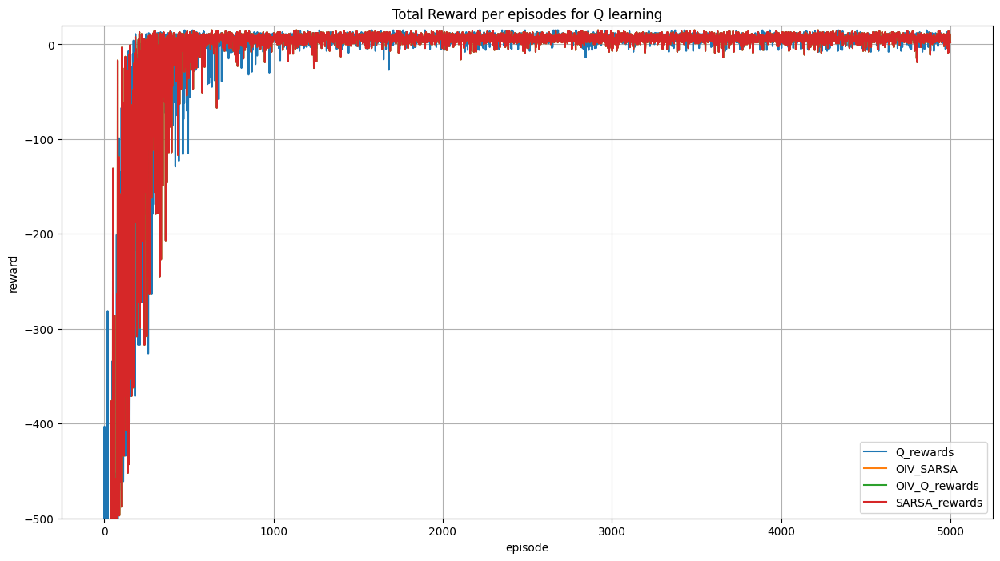

In [22]:
plt.figure(figsize=(15,8))
plt.title(f"Total Reward per episodes for Q learning")
plt.xlabel("episode")
plt.ylabel("reward")
plt.ylim(-500, 20)
plt.grid()
plt.plot(SARSA_rewards, label = "Q_rewards")
plt.plot(OIV_SARSA_rewards, label = "OIV_SARSA")
plt.plot(OIV_SARSA_rewards, label = "OIV_Q_rewards")
plt.plot(OIV_SARSA_rewards, label = "SARSA_rewards")


plt.legend()
plt.show()
